In [1]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
import zipfile
import os

# Define the paths
zip_file_path = '/content/drive/MyDrive/archive(1).zip'
extract_dir = '/content/drive/MyDrive/skin_disease_dataset/'

# Extract the zip file
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extract_dir)

print("Extraction complete!")


In [11]:
from PIL import UnidentifiedImageError

def process_images_with_error_handling(category_path):
    brightness = []
    contrast = []
    corrupted_files = []

    for image_name in os.listdir(category_path):
        image_path = os.path.join(category_path, image_name)
        try:
            with Image.open(image_path) as img:
                img = img.convert('L')  # Convert image to grayscale
                img_np = np.array(img)
                b = np.mean(img_np)
                c = np.std(img_np)
                brightness.append(b)
                contrast.append(c)
        except UnidentifiedImageError:
            print(f"Corrupted image skipped: {image_path}")
            corrupted_files.append(image_path)

    return brightness, contrast, corrupted_files

# Example usage with error handling
category_path = '/content/drive/MyDrive/skin_disease_dataset/train/Melanoma Skin Cancer Nevi and Moles'
brightness, contrast, corrupted_files = process_images_with_error_handling(category_path)

# Continue with the analysis...
if corrupted_files:
    print(f"Total corrupted images found: {len(corrupted_files)}")
    for file in corrupted_files:
        print(file)


Corrupted image skipped: /content/drive/MyDrive/skin_disease_dataset/train/Melanoma Skin Cancer Nevi and Moles/melanotic-macule-11.jpg
Total corrupted images found: 1
/content/drive/MyDrive/skin_disease_dataset/train/Melanoma Skin Cancer Nevi and Moles/melanotic-macule-11.jpg


In [14]:
import os

for file in corrupted_files:
    os.remove(file)
    print(f"Removed corrupted file: {file}")


Removed corrupted file: /content/drive/MyDrive/skin_disease_dataset/train/Melanoma Skin Cancer Nevi and Moles/melanotic-macule-11.jpg


Training Dataset Sample Images


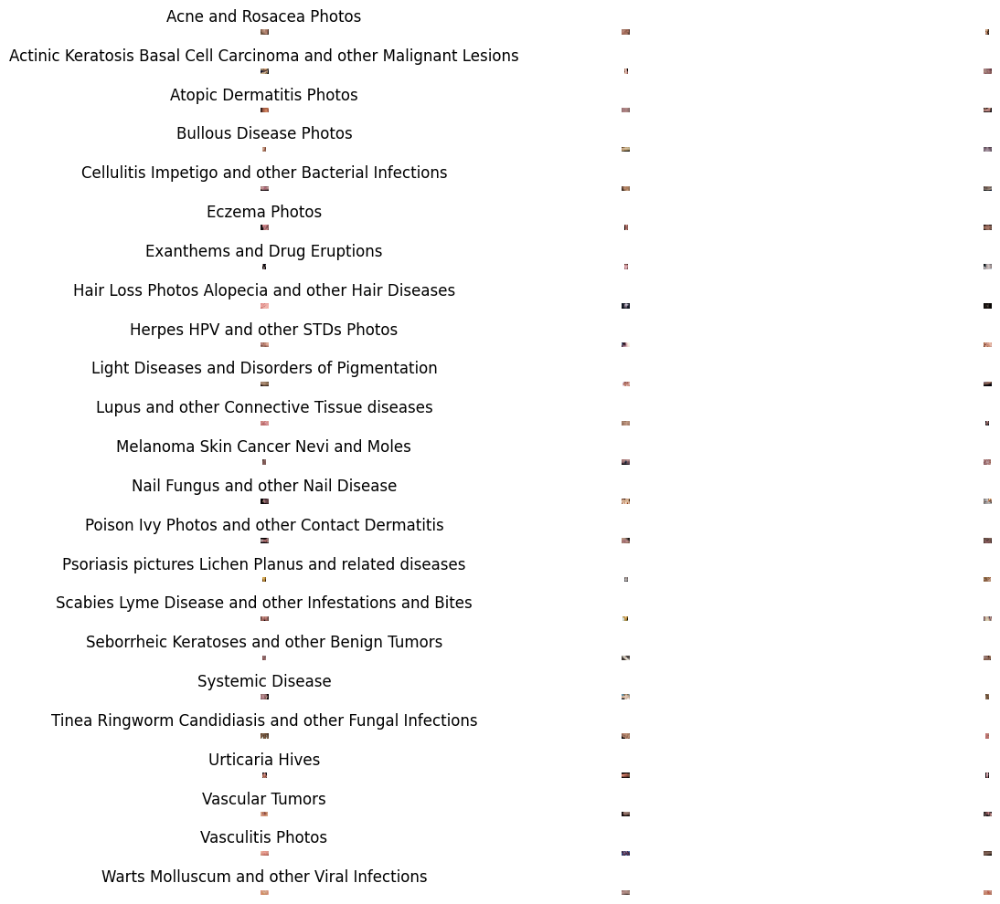

Testing Dataset Sample Images


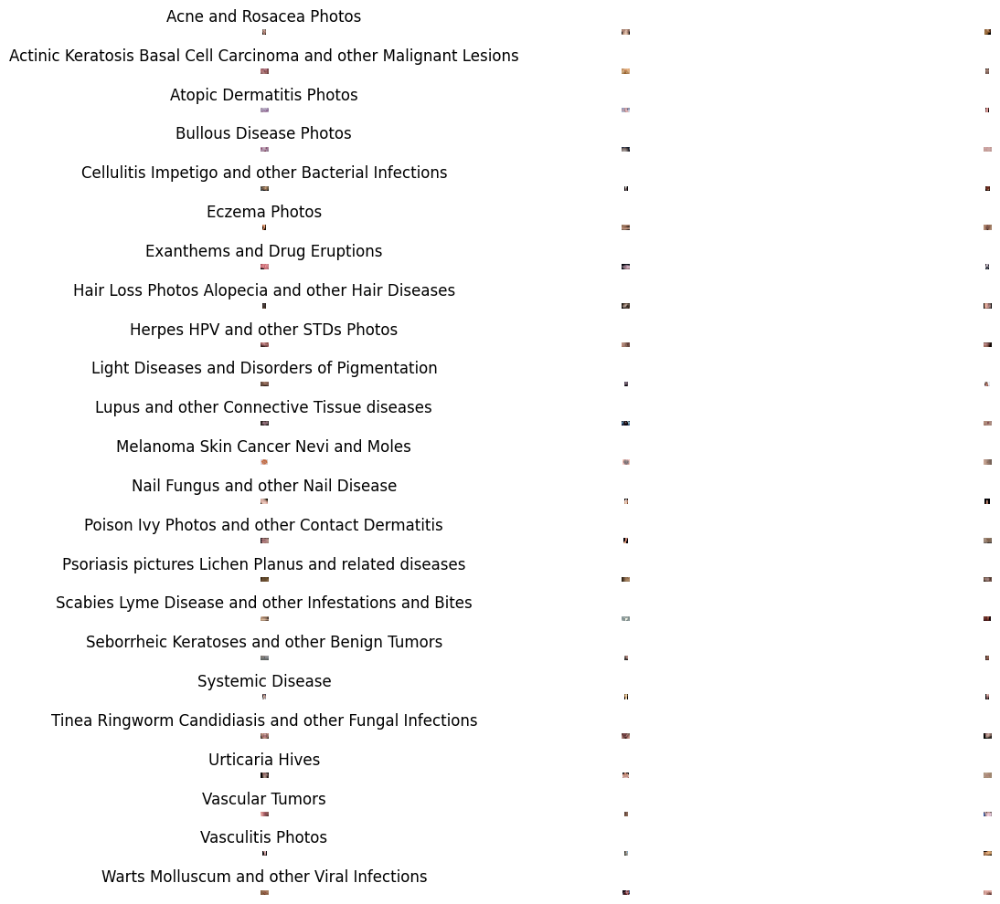

In [3]:
import os
import random
import matplotlib.pyplot as plt
from PIL import Image

# Define the paths to the training and test datasets
train_path = '/content/drive/MyDrive/skin_disease_dataset/train'
test_path = '/content/drive/MyDrive/skin_disease_dataset/test'

# Function to display sample images from a directory
def display_sample_images(directory_path, num_samples=3):
    categories = os.listdir(directory_path)
    plt.figure(figsize=(15, 10))

    for i, category in enumerate(categories):
        category_path = os.path.join(directory_path, category)
        images = os.listdir(category_path)
        sample_images = random.sample(images, num_samples)

        for j, image_name in enumerate(sample_images):
            image_path = os.path.join(category_path, image_name)
            img = Image.open(image_path)
            plt.subplot(len(categories), num_samples, i * num_samples + j + 1)
            plt.imshow(img)
            plt.axis('off')
            if j == 0:
                plt.title(category)

    plt.tight_layout()
    plt.show()

# Display sample images from the training dataset
print("Training Dataset Sample Images")
display_sample_images(train_path)

# Display sample images from the testing dataset
print("Testing Dataset Sample Images")
display_sample_images(test_path)


Acne and Rosacea Photos: 840 images
Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions: 1149 images
Atopic Dermatitis Photos: 489 images
Bullous Disease Photos: 448 images
Cellulitis Impetigo and other Bacterial Infections: 288 images
Eczema Photos: 1235 images
Exanthems and Drug Eruptions: 404 images
Hair Loss Photos Alopecia and other Hair Diseases: 239 images
Herpes HPV and other STDs Photos: 405 images
Light Diseases and Disorders of Pigmentation: 568 images
Lupus and other Connective Tissue diseases: 420 images
Melanoma Skin Cancer Nevi and Moles: 463 images
Nail Fungus and other Nail Disease: 1040 images
Poison Ivy Photos and other Contact Dermatitis: 260 images
Psoriasis pictures Lichen Planus and related diseases: 1405 images
Scabies Lyme Disease and other Infestations and Bites: 431 images
Seborrheic Keratoses and other Benign Tumors: 936 images
Systemic Disease: 606 images
Tinea Ringworm Candidiasis and other Fungal Infections: 1300 images
Urticaria Hives: 212

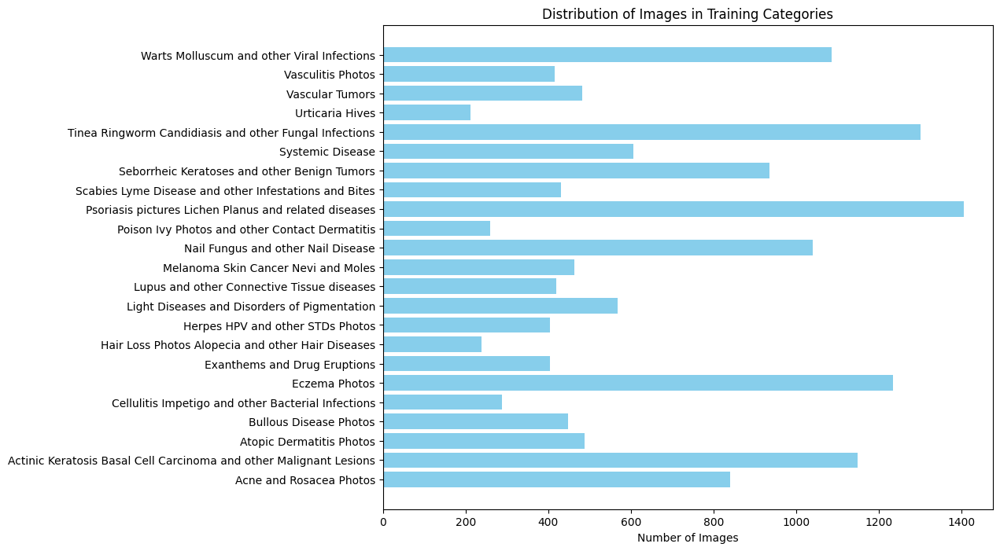

In [4]:
import os
import matplotlib.pyplot as plt

# Define the paths
train_path = '/content/drive/MyDrive/skin_disease_dataset/train'
test_path = '/content/drive/MyDrive/skin_disease_dataset/test'

# Get the list of directories
train_categories = os.listdir(train_path)

# Count the number of images in each category
train_image_counts = {}
for category in train_categories:
    category_path = os.path.join(train_path, category)
    train_image_counts[category] = len(os.listdir(category_path))

# Display the counts
for category, count in train_image_counts.items():
    print(f"{category}: {count} images")

# Plotting the distribution of images across categories
plt.figure(figsize=(10, 8))
plt.barh(list(train_image_counts.keys()), list(train_image_counts.values()), color='skyblue')
plt.xlabel('Number of Images')
plt.title('Distribution of Images in Training Categories')
plt.show()


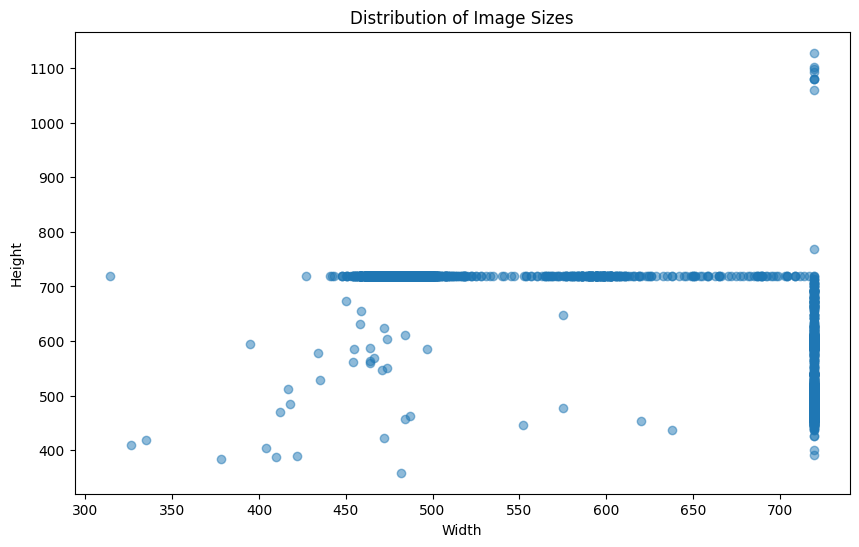

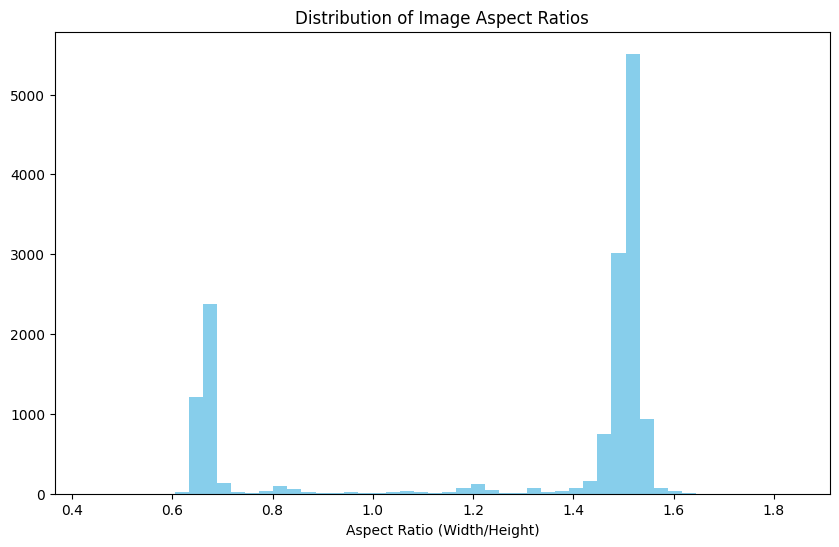

In [15]:
from PIL import Image
import numpy as np

# Analyze image sizes and aspect ratios
image_sizes = []
aspect_ratios = []

for category in train_categories:
    category_path = os.path.join(train_path, category)
    for image_name in os.listdir(category_path):
        image_path = os.path.join(category_path, image_name)
        with Image.open(image_path) as img:
            width, height = img.size
            image_sizes.append((width, height))
            aspect_ratios.append(width / height)

# Convert to numpy arrays for easy analysis
image_sizes = np.array(image_sizes)
aspect_ratios = np.array(aspect_ratios)

# Plot the distribution of image sizes
plt.figure(figsize=(10, 6))
plt.scatter(image_sizes[:, 0], image_sizes[:, 1], alpha=0.5)
plt.xlabel('Width')
plt.ylabel('Height')
plt.title('Distribution of Image Sizes')
plt.show()

# Plot the distribution of aspect ratios
plt.figure(figsize=(10, 6))
plt.hist(aspect_ratios, bins=50, color='skyblue')
plt.xlabel('Aspect Ratio (Width/Height)')
plt.title('Distribution of Image Aspect Ratios')
plt.show()


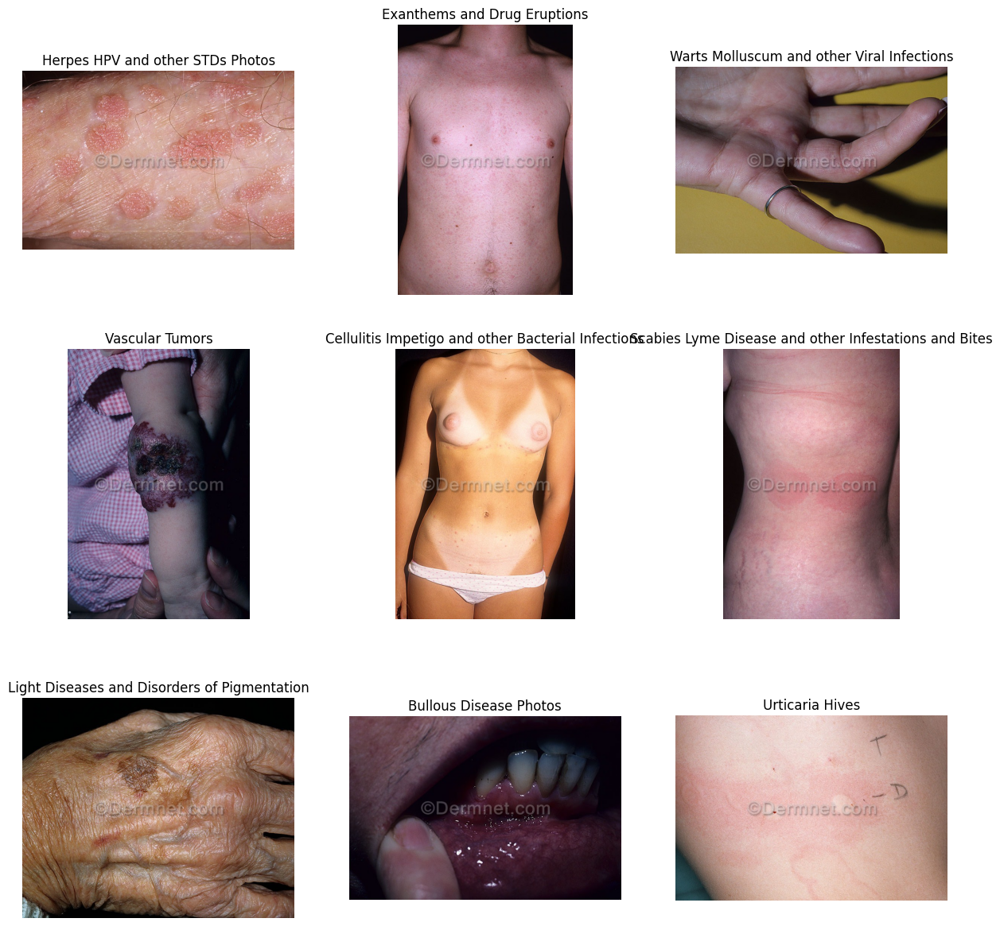

In [23]:
import random

# Display sample images from each category
plt.figure(figsize=(15, 15))
for i, category in enumerate(random.sample(train_categories, 9)):
    category_path = os.path.join(train_path, category)
    sample_image = random.choice(os.listdir(category_path))
    image_path = os.path.join(category_path, sample_image)

    plt.subplot(3, 3, i + 1)
    img = Image.open(image_path)
    plt.imshow(img)
    plt.title(category)
    plt.axis('off')
plt.show()


In [16]:
# Check for low-resolution images
low_res_images = []
for category in train_categories:
    category_path = os.path.join(train_path, category)
    for image_name in os.listdir(category_path):
        image_path = os.path.join(category_path, image_name)
        with Image.open(image_path) as img:
            width, height = img.size
            if width < 100 or height < 100:
                low_res_images.append(image_path)

# Display the number of low-resolution images found
print(f"Number of low-resolution images found: {len(low_res_images)}")

# display a few low-resolution images
plt.figure(figsize=(10, 10))
for i, image_path in enumerate(random.sample(low_res_images, min(9, len(low_res_images)))):
    plt.subplot(3, 3, i + 1)
    img = Image.open(image_path)
    plt.imshow(img)
    plt.title(f"Low Res Image {i+1}")
    plt.axis('off')
plt.show()


Number of low-resolution images found: 0


<Figure size 1000x1000 with 0 Axes>

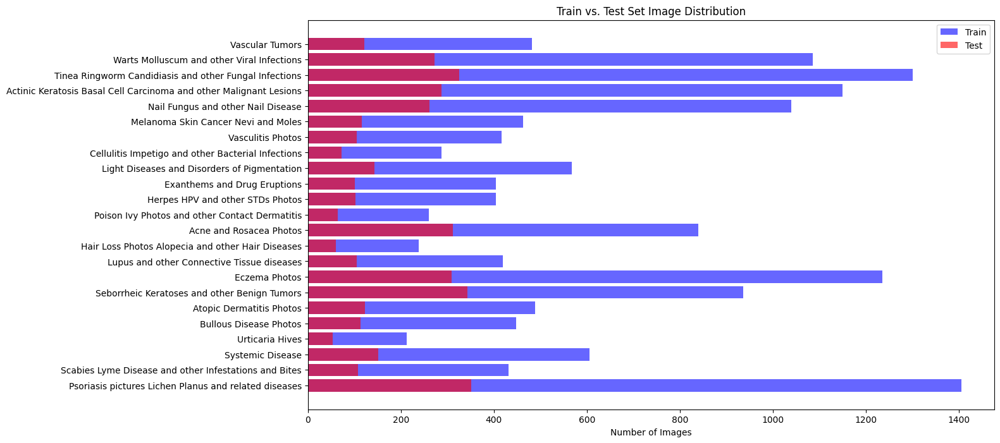

In [9]:
# Count the number of images in each category in the test set
test_categories = os.listdir(test_path)
test_image_counts = {}
for category in test_categories:
    category_path = os.path.join(test_path, category)
    test_image_counts[category] = len(os.listdir(category_path))

# Combine train and test counts for comparison
combined_counts = {category: [train_image_counts.get(category, 0), test_image_counts.get(category, 0)]
                   for category in set(train_image_counts) | set(test_image_counts)}

# Plotting the comparison
categories = list(combined_counts.keys())
train_counts = [combined_counts[cat][0] for cat in categories]
test_counts = [combined_counts[cat][1] for cat in categories]

plt.figure(figsize=(14, 8))
plt.barh(categories, train_counts, color='blue', alpha=0.6, label='Train')
plt.barh(categories, test_counts, color='red', alpha=0.6, label='Test')
plt.xlabel('Number of Images')
plt.title('Train vs. Test Set Image Distribution')
plt.legend()
plt.show()


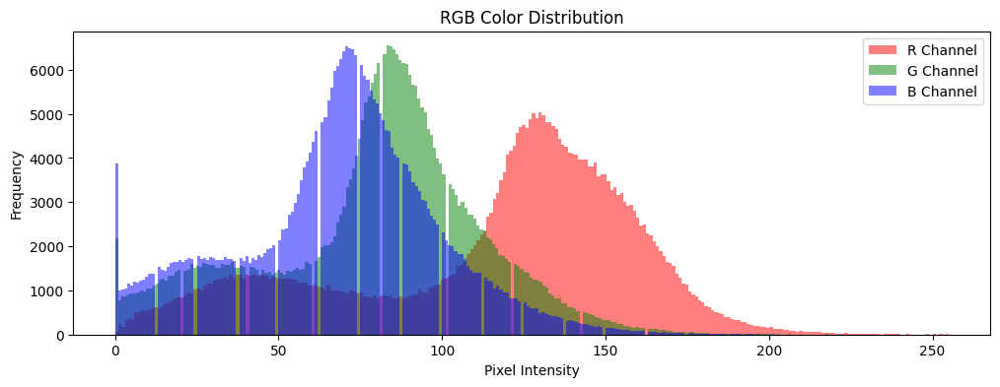

In [10]:
# Analyze and visualize RGB color distribution
def plot_color_distribution(image_path):
    img = Image.open(image_path)
    img_np = np.array(img)
    colors = ('r', 'g', 'b')
    channel_ids = (0, 1, 2)
    plt.figure(figsize=(12, 4))

    for channel_id, color in zip(channel_ids, colors):
        plt.hist(img_np[:, :, channel_id].ravel(), bins=256, color=color, alpha=0.5, label=f'{color.upper()} Channel')

    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')
    plt.title('RGB Color Distribution')
    plt.legend()
    plt.show()

# Display color distribution for a sample image
plot_color_distribution(sample_image_path)


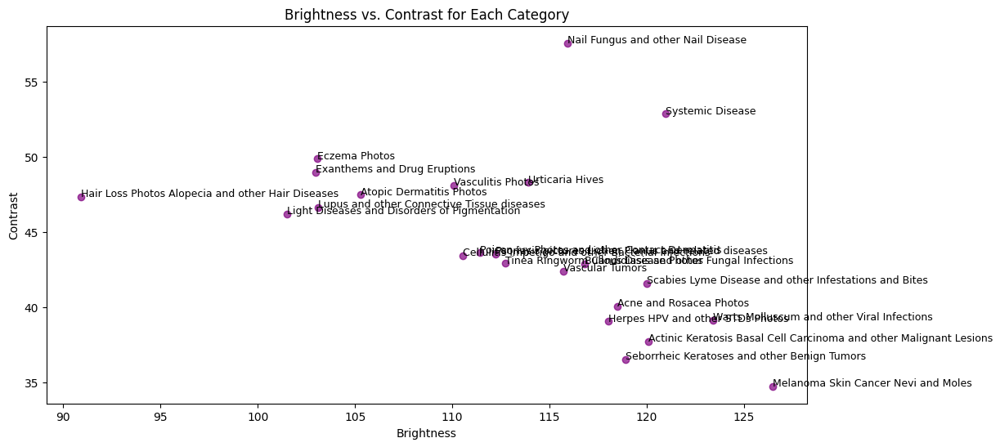

In [17]:
from skimage import exposure

# Function to calculate brightness and contrast
def calculate_brightness_contrast(image_path):
    img = Image.open(image_path).convert('L')  # Convert image to grayscale
    img_np = np.array(img)

    brightness = np.mean(img_np)
    contrast = np.std(img_np)
    return brightness, contrast

# Analyze brightness and contrast for each category
brightness_contrast = {}
for category in train_categories:
    category_path = os.path.join(train_path, category)
    brightness = []
    contrast = []
    for image_name in os.listdir(category_path):
        image_path = os.path.join(category_path, image_name)
        b, c = calculate_brightness_contrast(image_path)
        brightness.append(b)
        contrast.append(c)
    brightness_contrast[category] = (np.mean(brightness), np.mean(contrast))

# Plot brightness and contrast
brightness_values = [bc[0] for bc in brightness_contrast.values()]
contrast_values = [bc[1] for bc in brightness_contrast.values()]

plt.figure(figsize=(12, 6))
plt.scatter(brightness_values, contrast_values, color='purple', alpha=0.7)
for i, category in enumerate(train_categories):
    plt.text(brightness_values[i], contrast_values[i], category, fontsize=9)
plt.xlabel('Brightness')
plt.ylabel('Contrast')
plt.title('Brightness vs. Contrast for Each Category')
plt.show()


<ipython-input-24-75580b9ef8ce>:31: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab20', len(set(labels)))


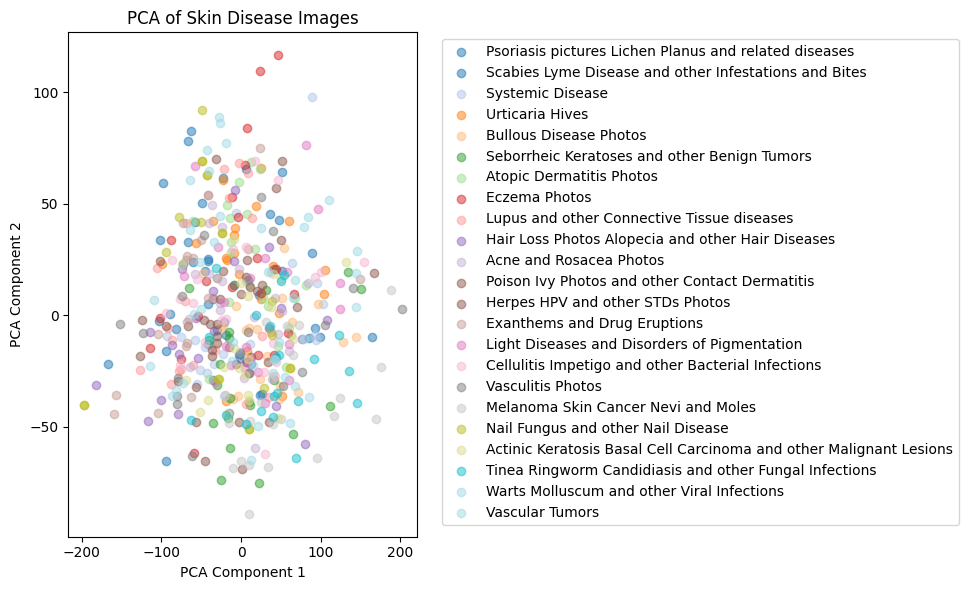

In [24]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import cv2

# Load a subset of images and flatten them
n_samples = 500
image_data = []
labels = []

for category in train_categories:
    category_path = os.path.join(train_path, category)
    for image_name in os.listdir(category_path)[:n_samples // len(train_categories)]:
        image_path = os.path.join(category_path, image_name)
        img = Image.open(image_path).resize((64, 64))  # Resize to smaller dimension
        img_np = np.array(img).flatten()  # Flatten the image
        image_data.append(img_np)
        labels.append(category)

# Standardize the data
image_data = np.array(image_data)
scaler = StandardScaler()
image_data = scaler.fit_transform(image_data)

# Perform PCA
pca = PCA(n_components=2)
pca_result = pca.fit_transform(image_data)


# Perform PCA and plot with a legend
plt.figure(figsize=(10, 6))
colors = plt.cm.get_cmap('tab20', len(set(labels)))

for i, category in enumerate(set(labels)):
    indices = [j for j, label in enumerate(labels) if label == category]
    plt.scatter(pca_result[indices, 0], pca_result[indices, 1],
                alpha=0.5, label=category, color=colors(i))

plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.title('PCA of Skin Disease Images')
plt.legend(loc='best', bbox_to_anchor=(1.05, 1), ncol=1)  # Place the legend outside the plot
plt.tight_layout()
plt.show()



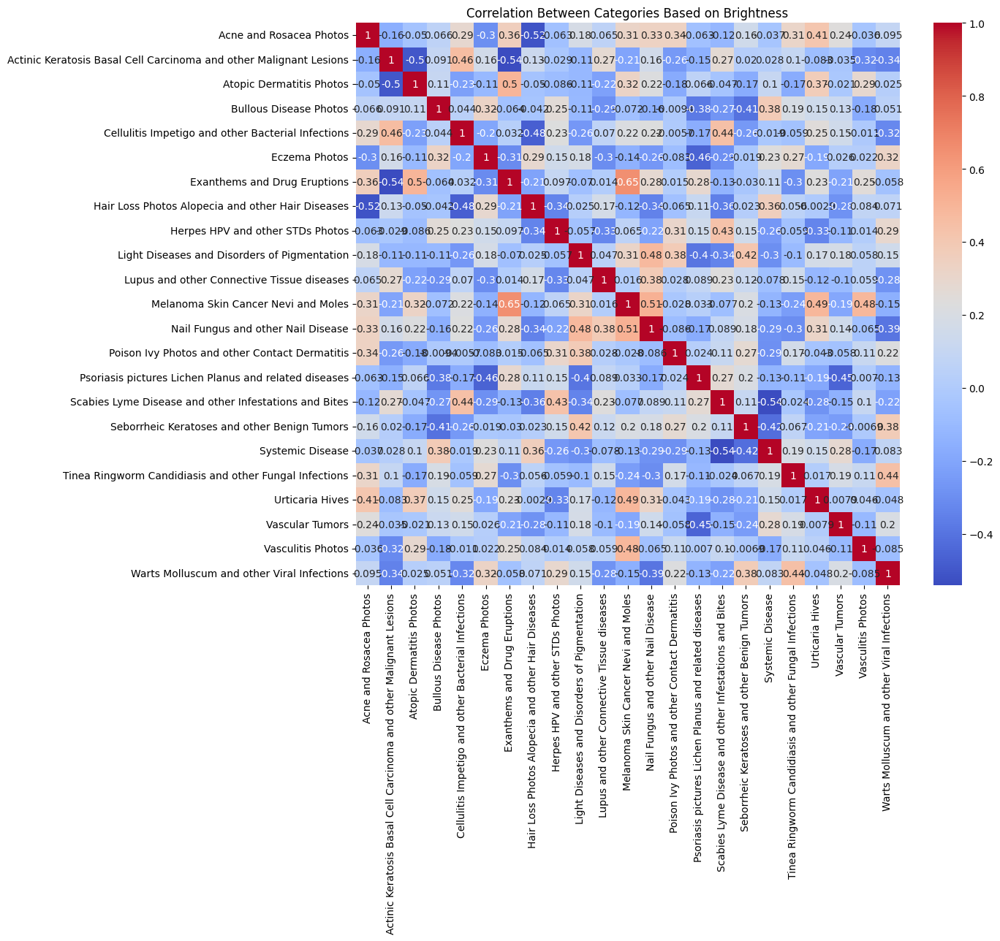

In [19]:
from scipy.stats import pearsonr

# Calculate correlations between categories using mean brightness as a simple feature
correlations = np.zeros((len(train_categories), len(train_categories)))

for i, category_1 in enumerate(train_categories):
    for j, category_2 in enumerate(train_categories):
        brightness_1 = []
        brightness_2 = []
        category_1_path = os.path.join(train_path, category_1)
        category_2_path = os.path.join(train_path, category_2)

        for image_name in os.listdir(category_1_path)[:n_samples // len(train_categories)]:
            image_path = os.path.join(category_1_path, image_name)
            b, _ = calculate_brightness_contrast(image_path)
            brightness_1.append(b)

        for image_name in os.listdir(category_2_path)[:n_samples // len(train_categories)]:
            image_path = os.path.join(category_2_path, image_name)
            b, _ = calculate_brightness_contrast(image_path)
            brightness_2.append(b)

        # Calculate Pearson correlation
        correlation, _ = pearsonr(brightness_1, brightness_2)
        correlations[i, j] = correlation

# Plot the correlation matrix as a heatmap
import seaborn as sns

plt.figure(figsize=(12, 10))
sns.heatmap(correlations, xticklabels=train_categories, yticklabels=train_categories, cmap='coolwarm', annot=True)
plt.title('Correlation Between Categories Based on Brightness')
plt.show()


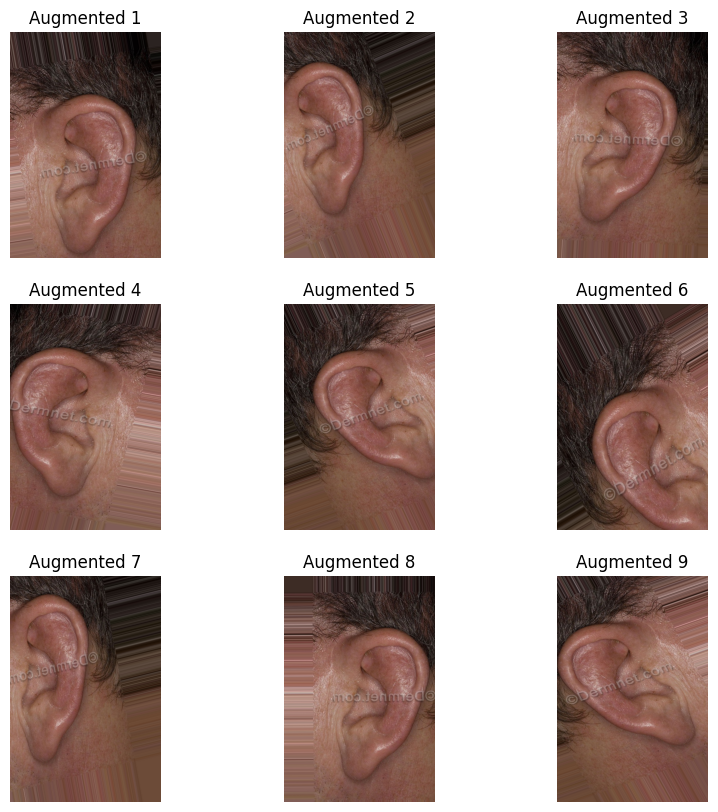

In [8]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define an ImageDataGenerator for augmentation
datagen = ImageDataGenerator(rotation_range=30, width_shift_range=0.2, height_shift_range=0.2,
                             shear_range=0.2, zoom_range=0.2, horizontal_flip=True, fill_mode='nearest')

# Load a single image for augmentation
sample_category = random.choice(train_categories)
sample_image_path = os.path.join(train_path, sample_category, random.choice(os.listdir(os.path.join(train_path, sample_category))))
img = Image.open(sample_image_path)
x = np.array(img)
x = x.reshape((1,) + x.shape)  # Reshape image for the generator

# Generate augmented images and display them
plt.figure(figsize=(10, 10))
for i, batch in enumerate(datagen.flow(x, batch_size=1)):
    plt.subplot(3, 3, i + 1)
    aug_img = Image.fromarray(batch[0].astype('uint8'))
    plt.imshow(aug_img)
    plt.title(f'Augmented {i+1}')
    plt.axis('off')
    if i >= 8:
        break  # Generate 9 augmented images
plt.show()


In [16]:
import os

# Define directories
train_dir = '/content/drive/MyDrive/skin_disease_dataset/train'
test_dir = '/content/drive/MyDrive/skin_disease_dataset/test'

# Get a list of all categories in the test directory
categories = [category for category in os.listdir(test_dir) if os.path.isdir(os.path.join(test_dir, category))]

# Initialize dictionaries to hold file paths for each category
test_files = {}

# Loop through each category and collect file paths
for category in categories:
    category_test_path = os.path.join(test_dir, category)
    test_files[category] = [file for _, _, files_ in os.walk(category_test_path) for file in files_]

# Example: Print the number of files for each category in the test set
for category, files in test_files.items():
    print(f"Category: {category}, Number of test images: {len(files)}")


Category: Acne and Rosacea Photos, Number of test images: 292
Category: Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions, Number of test images: 288
Category: Atopic Dermatitis Photos, Number of test images: 123
Category: Bullous Disease Photos, Number of test images: 113
Category: Cellulitis Impetigo and other Bacterial Infections, Number of test images: 73
Category: Eczema Photos, Number of test images: 309
Category: Exanthems and Drug Eruptions, Number of test images: 101
Category: Hair Loss Photos Alopecia and other Hair Diseases, Number of test images: 60
Category: Herpes HPV and other STDs Photos, Number of test images: 102
Category: Light Diseases and Disorders of Pigmentation, Number of test images: 143
Category: Lupus and other Connective Tissue diseases, Number of test images: 105
Category: Melanoma Skin Cancer Nevi and Moles, Number of test images: 116
Category: Nail Fungus and other Nail Disease, Number of test images: 261
Category: Poison Ivy Photos and o

In [17]:
import os

# Define the base training directory
train_dir = '/content/drive/MyDrive/skin_disease_dataset/train'

# Get a list of all category folders in the training directory
categories = [category for category in os.listdir(train_dir) if os.path.isdir(os.path.join(train_dir, category))]

# Initialize a list to store the full paths of all subdirectories in the training set
train_dirs = []

# Loop through each category and gather all subdirectory paths
for category in categories:
    category_train_path = os.path.join(train_dir, category)
    for folder_, _, files_ in os.walk(category_train_path):
        print(folder_)
        train_dirs.append(folder_)

# Optional: Print the collected training directories
print("Total training directories collected:", len(train_dirs))


/content/drive/MyDrive/skin_disease_dataset/train/Acne and Rosacea Photos
/content/drive/MyDrive/skin_disease_dataset/train/Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions
/content/drive/MyDrive/skin_disease_dataset/train/Atopic Dermatitis Photos
/content/drive/MyDrive/skin_disease_dataset/train/Bullous Disease Photos
/content/drive/MyDrive/skin_disease_dataset/train/Cellulitis Impetigo and other Bacterial Infections
/content/drive/MyDrive/skin_disease_dataset/train/Eczema Photos
/content/drive/MyDrive/skin_disease_dataset/train/Exanthems and Drug Eruptions
/content/drive/MyDrive/skin_disease_dataset/train/Hair Loss Photos Alopecia and other Hair Diseases
/content/drive/MyDrive/skin_disease_dataset/train/Herpes HPV and other STDs Photos
/content/drive/MyDrive/skin_disease_dataset/train/Light Diseases and Disorders of Pigmentation
/content/drive/MyDrive/skin_disease_dataset/train/Lupus and other Connective Tissue diseases
/content/drive/MyDrive/skin_disease_dataset/tr

In [18]:
import os
import random
import matplotlib.pyplot as plt
from keras.preprocessing import image
from mpl_toolkits.axes_grid1 import ImageGrid

def plotGridImages(d_name, list_files, train_path, nrows=1, ncols=5):
    fig = plt.figure(1, figsize=(30, 30))
    grid = ImageGrid(fig, 111, nrows_ncols=(nrows, ncols), axes_pad=0.05)

    print(f"Category: {d_name}")

    # Randomly sample images to display
    sampled_files = random.sample(list_files, min(len(list_files), ncols))

    for i, img_id in enumerate(sampled_files):
        image_dir_path = os.path.join(train_path, d_name, img_id)  # Full path to the image
        print(f"Loading image: {image_dir_path}")  # Print the path for debugging

        if not os.path.exists(image_dir_path):
            print(f"Image not found: {image_dir_path}")
            continue

        try:
            ax = grid[i]
            img = image.load_img(image_dir_path, target_size=(224, 224))  # Ensure correct target size
            img = image.img_to_array(img)
            ax.imshow(img / 255.)  # Normalize the image for display
            ax.text(10, 200, 'LABEL: %s' % d_name, color='k', backgroundcolor='w', alpha=0.8)
            ax.axis('off')
        except Exception as e:
            print(f"Error loading image {img_id}: {e}")
            continue

    plt.show()



Category: Acne and Rosacea Photos
Loading image: /content/drive/MyDrive/skin_disease_dataset/train/Acne and Rosacea Photos/hidradenitis-suppurativa-2.jpg
Loading image: /content/drive/MyDrive/skin_disease_dataset/train/Acne and Rosacea Photos/acne-cystic-55.jpg
Image not found: /content/drive/MyDrive/skin_disease_dataset/train/Acne and Rosacea Photos/acne-cystic-55.jpg
Loading image: /content/drive/MyDrive/skin_disease_dataset/train/Acne and Rosacea Photos/perioral-dermatitis-113.jpg
Loading image: /content/drive/MyDrive/skin_disease_dataset/train/Acne and Rosacea Photos/acne-open-comedo-14.jpg
Loading image: /content/drive/MyDrive/skin_disease_dataset/train/Acne and Rosacea Photos/acne-excoriated-12.jpg


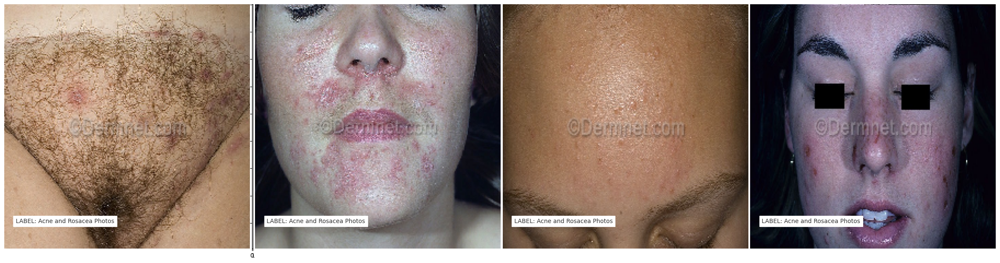

In [19]:
category_name = 'Acne and Rosacea Photos'  # Replace with the desired category name
list_files = test_files[category_name]  # Get the list of files for the specified category

plotGridImages(category_name, list_files, train_dir)

In [20]:
import os
import pandas as pd

# Define paths to the training and test directories
train_dir = '/content/drive/MyDrive/skin_disease_dataset/train'
test_dir = '/content/drive/MyDrive/skin_disease_dataset/test'

# Initialize lists to hold image paths and labels
train_image_paths = []
train_labels = []

test_image_paths = []
test_labels = []

# Function to gather image paths and labels
def gather_image_paths_and_labels(directory, image_paths_list, labels_list):
    for category in os.listdir(directory):
        category_path = os.path.join(directory, category)
        if os.path.isdir(category_path):
            for image_name in os.listdir(category_path):
                image_path = os.path.join(category_path, image_name)
                if image_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                    image_paths_list.append(image_path)
                    labels_list.append(category)  # Label is the category name

# Gather training image paths and labels
gather_image_paths_and_labels(train_dir, train_image_paths, train_labels)

# Gather testing image paths and labels
gather_image_paths_and_labels(test_dir, test_image_paths, test_labels)

# Create DataFrames
final_df = pd.DataFrame({
    'Image': train_image_paths,
    'Label': train_labels
})

final_test_df = pd.DataFrame({
    'Image': test_image_paths,
    'Label': test_labels
})

# Display the first few rows to verify
print(final_df.head())
print(final_test_df.head())


                                               Image                    Label
0  /content/drive/MyDrive/skin_disease_dataset/tr...  Acne and Rosacea Photos
1  /content/drive/MyDrive/skin_disease_dataset/tr...  Acne and Rosacea Photos
2  /content/drive/MyDrive/skin_disease_dataset/tr...  Acne and Rosacea Photos
3  /content/drive/MyDrive/skin_disease_dataset/tr...  Acne and Rosacea Photos
4  /content/drive/MyDrive/skin_disease_dataset/tr...  Acne and Rosacea Photos
                                               Image                    Label
0  /content/drive/MyDrive/skin_disease_dataset/te...  Acne and Rosacea Photos
1  /content/drive/MyDrive/skin_disease_dataset/te...  Acne and Rosacea Photos
2  /content/drive/MyDrive/skin_disease_dataset/te...  Acne and Rosacea Photos
3  /content/drive/MyDrive/skin_disease_dataset/te...  Acne and Rosacea Photos
4  /content/drive/MyDrive/skin_disease_dataset/te...  Acne and Rosacea Photos


In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.applications import VGG16, VGG19, ResNet50, DenseNet121
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
from tensorflow.keras.regularizers import l2

# Define paths
train_path = '/content/drive/MyDrive/skin_disease_dataset/train'
test_path = '/content/drive/MyDrive/skin_disease_dataset/test'

# Define constants
BATCH_SIZE = 32
EPOCHS = 100
IMAGE_SIZE = (224, 224)
shuffle=True

# Data Augmentation and Normalization
train_datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2,
    horizontal_flip=True  # Add horizontal flip augmentation
)

test_datagen = ImageDataGenerator(rescale=1./255)

# Data Generators
train_generator = train_datagen.flow_from_directory(
    train_path,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='training',
    shuffle=True  # Ensure shuffling is enabled
)

val_generator = train_datagen.flow_from_directory(
    train_path,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='validation',
    shuffle=True  # Ensure shuffling is enabled
)

test_generator = test_datagen.flow_from_directory(
    test_path,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False  # Typically, shuffling is not used in test data
)

# Get number of classes
num_classes = len(train_generator.class_indices)


Found 12105 images belonging to 23 classes.
Found 3017 images belonging to 23 classes.
Found 3982 images belonging to 23 classes.


In [9]:
from sklearn.utils.class_weight import compute_class_weight

# Get class indices
class_indices = train_generator.class_indices
class_counts = train_generator.samples

# Calculate class weights
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_generator.classes),
    y=train_generator.classes
)
class_weights = dict(enumerate(class_weights))
print(class_weights)

{0: 0.7831909937888198, 1: 0.572069943289225, 2: 1.3426131322094055, 3: 1.4660288240280974, 4: 2.2783738001129303, 5: 0.5326967083259989, 6: 1.6243961352657006, 7: 2.7411684782608696, 8: 1.6243961352657006, 9: 1.1567128523650263, 10: 1.5663819875776397, 11: 1.4186101019571078, 12: 0.6325773411371237, 13: 2.530309364548495, 14: 0.4682423023363763, 15: 1.5255198487712665, 16: 0.70267603181053, 17: 1.0851636037651278, 18: 0.506061872909699, 19: 3.0959079283887467, 20: 1.3634827663888263, 21: 1.5804935370152762, 22: 0.6056436683844499}



Training EfficientNetB0
Found 12105 images belonging to 23 classes.
Found 3017 images belonging to 23 classes.
Computed class weights: {0: 0.7831909937888198, 1: 0.572069943289225, 2: 1.3426131322094055, 3: 1.4660288240280974, 4: 2.2783738001129303, 5: 0.5326967083259989, 6: 1.6243961352657006, 7: 2.7411684782608696, 8: 1.6243961352657006, 9: 1.1567128523650263, 10: 1.5663819875776397, 11: 1.4186101019571078, 12: 0.6325773411371237, 13: 2.530309364548495, 14: 0.4682423023363763, 15: 1.5255198487712665, 16: 0.70267603181053, 17: 1.0851636037651278, 18: 0.506061872909699, 19: 3.0959079283887467, 20: 1.3634827663888263, 21: 1.5804935370152762, 22: 0.6056436683844499}
16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
Starting Phase 1 training for EfficientNetB0...
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


379/379 ━━━━━━━━━━━━━━━━━━━━ 7082s 18s/step - accuracy: 0.1442 - loss: 0.6562 - val_accuracy: 0.2058 - val_loss: 0.5906 - learning_rate: 1.0000e-04
Epoch 2/50
379/379 ━━━━━━━━━━━━━━━━━━━━ 219s 569ms/step - accuracy: 0.2421 - loss: 0.5539 - val_accuracy: 0.2231 - val_loss: 0.5690 - learning_rate: 1.0000e-04
Epoch 3/50
379/379 ━━━━━━━━━━━━━━━━━━━━ 214s 556ms/step - accuracy: 0.2661 - loss: 0.5365 - val_accuracy: 0.2333 - val_loss: 0.5622 - learning_rate: 1.0000e-04
Epoch 4/50
379/379 ━━━━━━━━━━━━━━━━━━━━ 228s 592ms/step - accuracy: 0.2880 - loss: 0.5070 - val_accuracy: 0.2377 - val_loss: 0.5576 - learning_rate: 1.0000e-04
Epoch 5/50
379/379 ━━━━━━━━━━━━━━━━━━━━ 215s 560ms/step - accuracy: 0.3071 - loss: 0.4918 - val_accuracy: 0.2516 - val_loss: 0.5514 - learning_rate: 1.0000e-04
Epoch 6/50
379/379 ━━━━━━━━━━━━━━━━━━━━ 219s 568ms/step - accuracy: 0.3161 - loss: 0.4775 - val_accuracy: 0.2476 - val_loss: 0.5524 - learning_rate: 1.0000e-04
Epoch 7/50
379/379 ━━━━━━━━━━━━━━━━━━━━ 220s 573ms/s

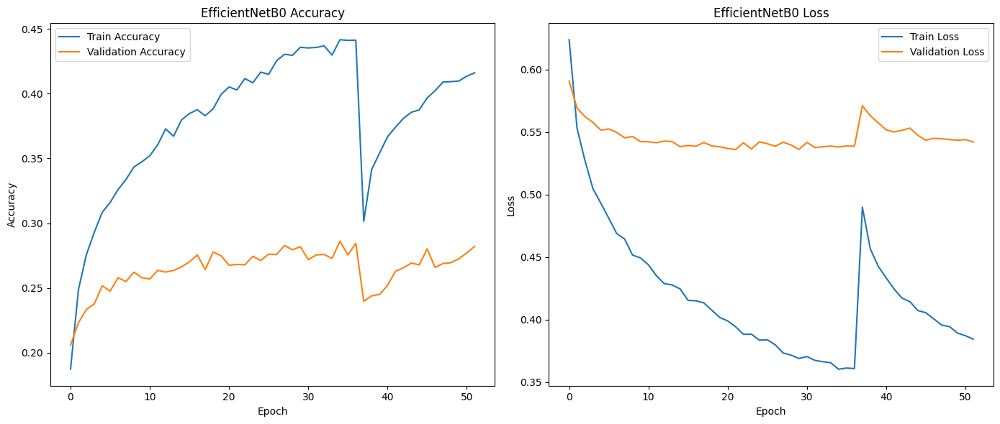

Found 3982 images belonging to 23 classes.
Evaluating EfficientNetB0 on test data...
125/125 ━━━━━━━━━━━━━━━━━━━━ 1854s 15s/step

Classification Report for EfficientNetB0:

                                                                    precision    recall  f1-score   support

                                           Acne and Rosacea Photos       0.51      0.37      0.43       292
Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions       0.40      0.40      0.40       288
                                          Atopic Dermatitis Photos       0.36      0.21      0.27       123
                                            Bullous Disease Photos       0.22      0.12      0.15       113
                Cellulitis Impetigo and other Bacterial Infections       0.08      0.01      0.02        73
                                                     Eczema Photos       0.37      0.39      0.38       309
                                      Exanthems and Drug Eruptions    

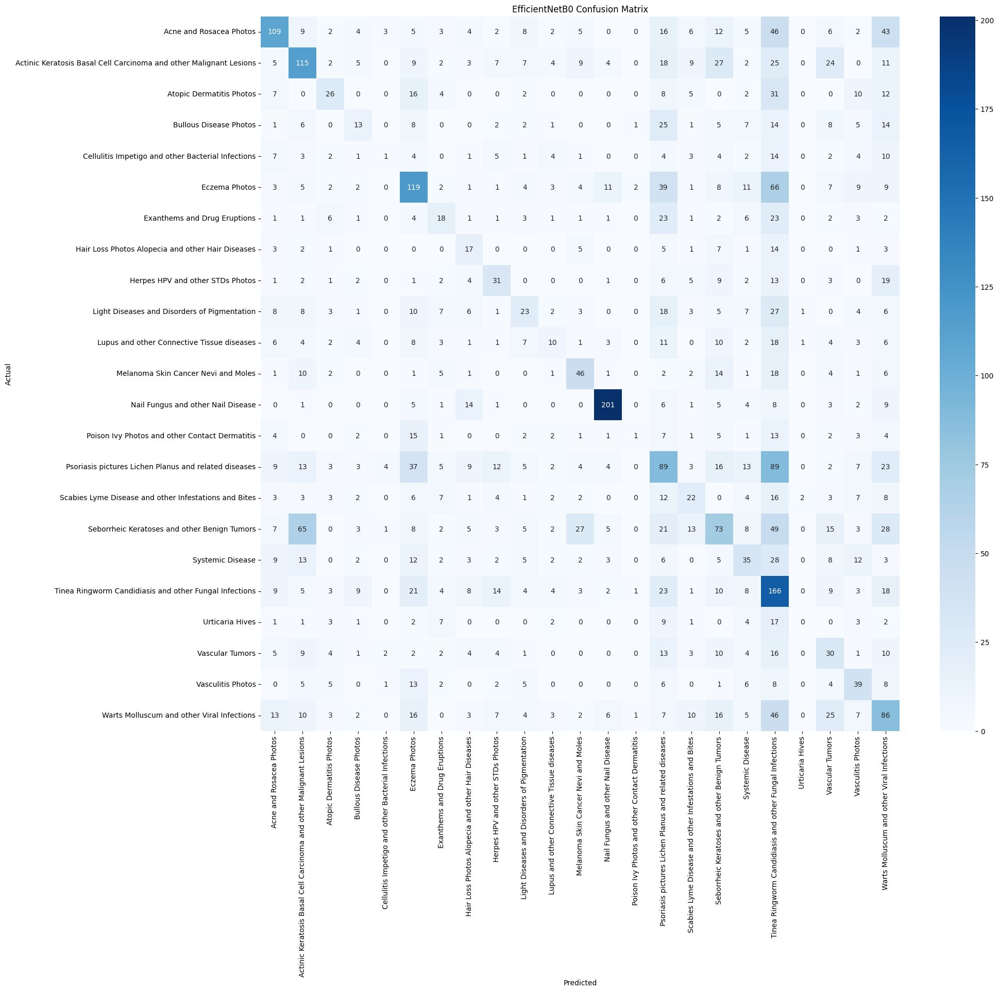


Training InceptionV3
Found 12105 images belonging to 23 classes.
Found 3017 images belonging to 23 classes.
Computed class weights: {0: 0.7831909937888198, 1: 0.572069943289225, 2: 1.3426131322094055, 3: 1.4660288240280974, 4: 2.2783738001129303, 5: 0.5326967083259989, 6: 1.6243961352657006, 7: 2.7411684782608696, 8: 1.6243961352657006, 9: 1.1567128523650263, 10: 1.5663819875776397, 11: 1.4186101019571078, 12: 0.6325773411371237, 13: 2.530309364548495, 14: 0.4682423023363763, 15: 1.5255198487712665, 16: 0.70267603181053, 17: 1.0851636037651278, 18: 0.506061872909699, 19: 3.0959079283887467, 20: 1.3634827663888263, 21: 1.5804935370152762, 22: 0.6056436683844499}
87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step
Starting Phase 1 training for InceptionV3...
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


379/379 ━━━━━━━━━━━━━━━━━━━━ 374s 918ms/step - accuracy: 0.1403 - loss: 0.6676 - val_accuracy: 0.1956 - val_loss: 0.5973 - learning_rate: 1.0000e-04
Epoch 2/50
379/379 ━━━━━━━━━━━━━━━━━━━━ 334s 867ms/step - accuracy: 0.2311 - loss: 0.5705 - val_accuracy: 0.2224 - val_loss: 0.5728 - learning_rate: 1.0000e-04
Epoch 3/50
379/379 ━━━━━━━━━━━━━━━━━━━━ 332s 863ms/step - accuracy: 0.2662 - loss: 0.5424 - val_accuracy: 0.2151 - val_loss: 0.5656 - learning_rate: 1.0000e-04
Epoch 4/50
379/379 ━━━━━━━━━━━━━━━━━━━━ 334s 870ms/step - accuracy: 0.2695 - loss: 0.5226 - val_accuracy: 0.2188 - val_loss: 0.5631 - learning_rate: 1.0000e-04
Epoch 5/50
379/379 ━━━━━━━━━━━━━━━━━━━━ 325s 846ms/step - accuracy: 0.2871 - loss: 0.5077 - val_accuracy: 0.2350 - val_loss: 0.5534 - learning_rate: 1.0000e-04
Epoch 6/50
379/379 ━━━━━━━━━━━━━━━━━━━━ 326s 848ms/step - accuracy: 0.3038 - loss: 0.4950 - val_accuracy: 0.2380 - val_loss: 0.5538 - learning_rate: 1.0000e-04
Epoch 7/50
379/379 ━━━━━━━━━━━━━━━━━━━━ 324s 841ms/

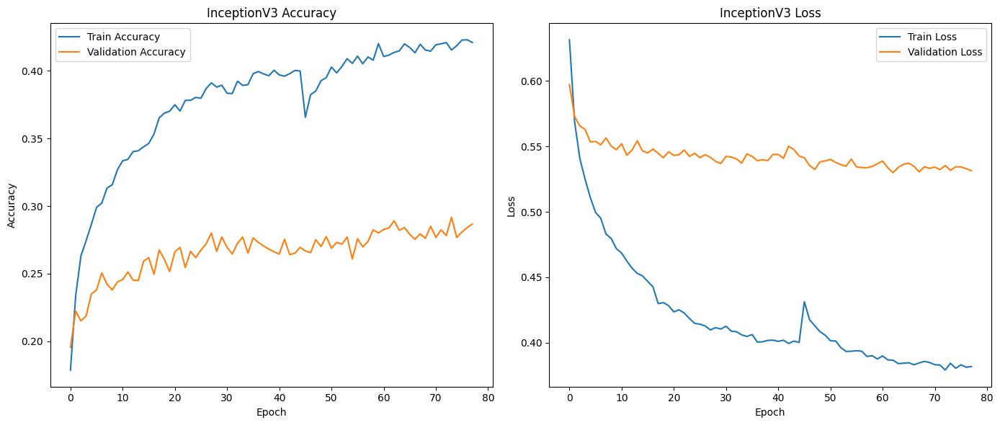

Found 3982 images belonging to 23 classes.
Evaluating InceptionV3 on test data...
125/125 ━━━━━━━━━━━━━━━━━━━━ 41s 286ms/step

Classification Report for InceptionV3:

                                                                    precision    recall  f1-score   support

                                           Acne and Rosacea Photos       0.46      0.63      0.53       292
Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions       0.41      0.40      0.40       288
                                          Atopic Dermatitis Photos       0.36      0.28      0.32       123
                                            Bullous Disease Photos       0.24      0.10      0.14       113
                Cellulitis Impetigo and other Bacterial Infections       0.00      0.00      0.00        73
                                                     Eczema Photos       0.40      0.43      0.41       309
                                      Exanthems and Drug Eruptions       0.2

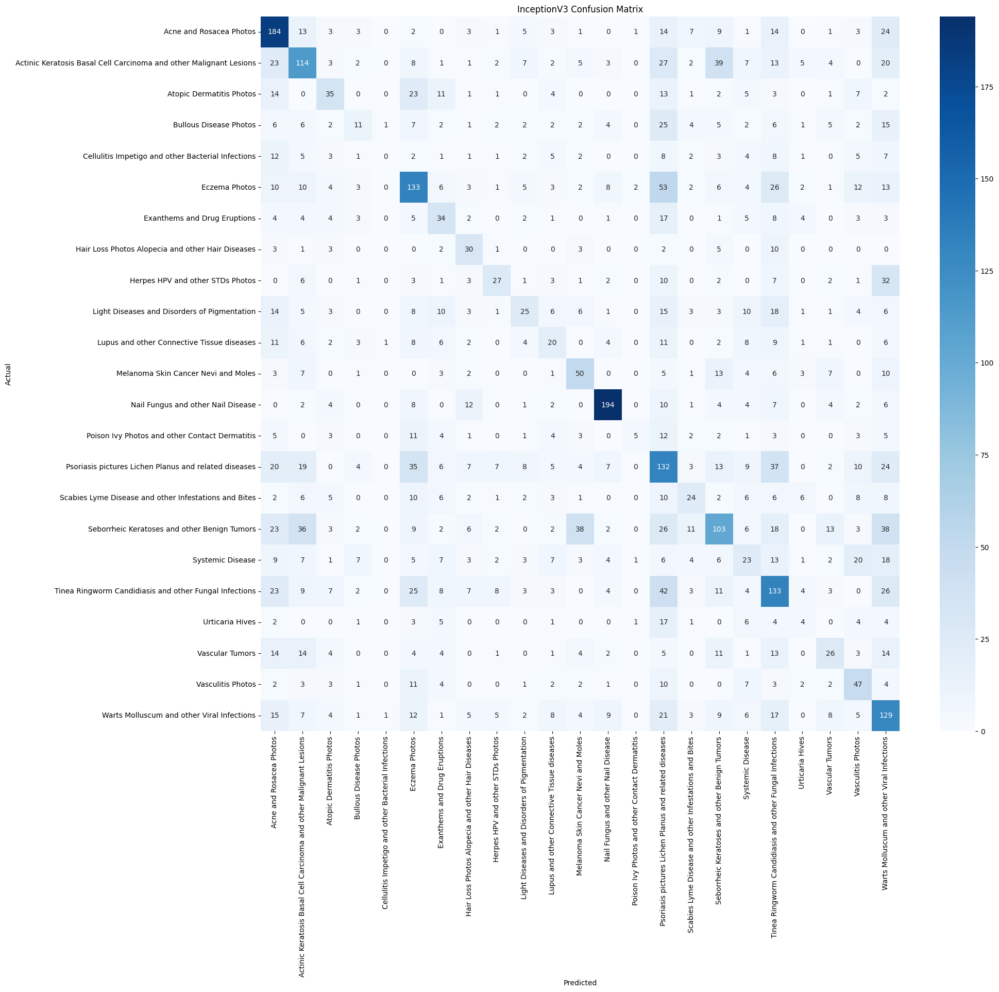


Training ResNet152V2
Found 12105 images belonging to 23 classes.
Found 3017 images belonging to 23 classes.
Computed class weights: {0: 0.7831909937888198, 1: 0.572069943289225, 2: 1.3426131322094055, 3: 1.4660288240280974, 4: 2.2783738001129303, 5: 0.5326967083259989, 6: 1.6243961352657006, 7: 2.7411684782608696, 8: 1.6243961352657006, 9: 1.1567128523650263, 10: 1.5663819875776397, 11: 1.4186101019571078, 12: 0.6325773411371237, 13: 2.530309364548495, 14: 0.4682423023363763, 15: 1.5255198487712665, 16: 0.70267603181053, 17: 1.0851636037651278, 18: 0.506061872909699, 19: 3.0959079283887467, 20: 1.3634827663888263, 21: 1.5804935370152762, 22: 0.6056436683844499}
234545216/234545216 ━━━━━━━━━━━━━━━━━━━━ 7s 0us/step
Starting Phase 1 training for ResNet152V2...
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


379/379 ━━━━━━━━━━━━━━━━━━━━ 254s 595ms/step - accuracy: 0.1300 - loss: 0.7481 - val_accuracy: 0.1889 - val_loss: 0.6128 - learning_rate: 1.0000e-04
Epoch 2/50
379/379 ━━━━━━━━━━━━━━━━━━━━ 212s 551ms/step - accuracy: 0.2304 - loss: 0.5876 - val_accuracy: 0.2111 - val_loss: 0.5868 - learning_rate: 1.0000e-04
Epoch 3/50
379/379 ━━━━━━━━━━━━━━━━━━━━ 213s 554ms/step - accuracy: 0.2624 - loss: 0.5464 - val_accuracy: 0.2184 - val_loss: 0.5809 - learning_rate: 1.0000e-04
Epoch 4/50
379/379 ━━━━━━━━━━━━━━━━━━━━ 211s 549ms/step - accuracy: 0.2816 - loss: 0.5274 - val_accuracy: 0.2201 - val_loss: 0.5738 - learning_rate: 1.0000e-04
Epoch 5/50
379/379 ━━━━━━━━━━━━━━━━━━━━ 211s 549ms/step - accuracy: 0.2911 - loss: 0.5053 - val_accuracy: 0.2343 - val_loss: 0.5678 - learning_rate: 1.0000e-04
Epoch 6/50
379/379 ━━━━━━━━━━━━━━━━━━━━ 211s 548ms/step - accuracy: 0.3014 - loss: 0.5017 - val_accuracy: 0.2357 - val_loss: 0.5624 - learning_rate: 1.0000e-04
Epoch 7/50
379/379 ━━━━━━━━━━━━━━━━━━━━ 208s 541ms/

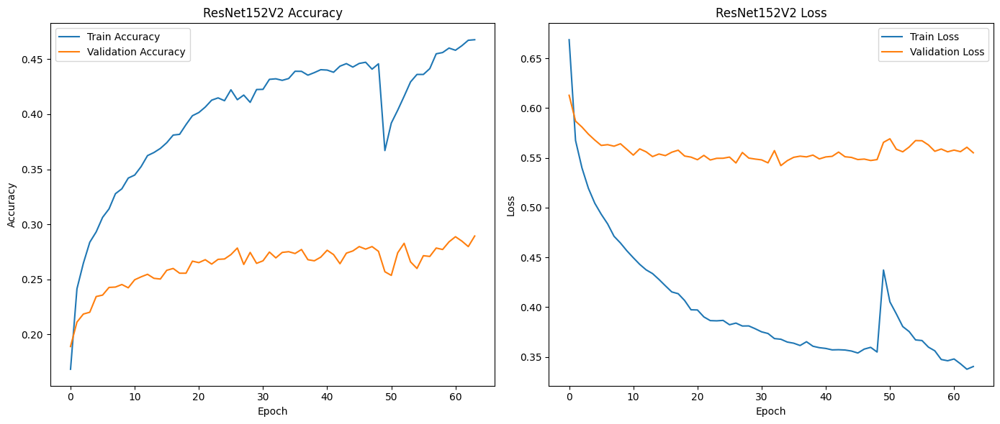

Found 3982 images belonging to 23 classes.
Evaluating ResNet152V2 on test data...
125/125 ━━━━━━━━━━━━━━━━━━━━ 39s 254ms/step

Classification Report for ResNet152V2:

                                                                    precision    recall  f1-score   support

                                           Acne and Rosacea Photos       0.44      0.64      0.52       292
Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions       0.36      0.39      0.37       288
                                          Atopic Dermatitis Photos       0.36      0.21      0.27       123
                                            Bullous Disease Photos       0.24      0.08      0.12       113
                Cellulitis Impetigo and other Bacterial Infections       0.00      0.00      0.00        73
                                                     Eczema Photos       0.30      0.42      0.35       309
                                      Exanthems and Drug Eruptions       0.2

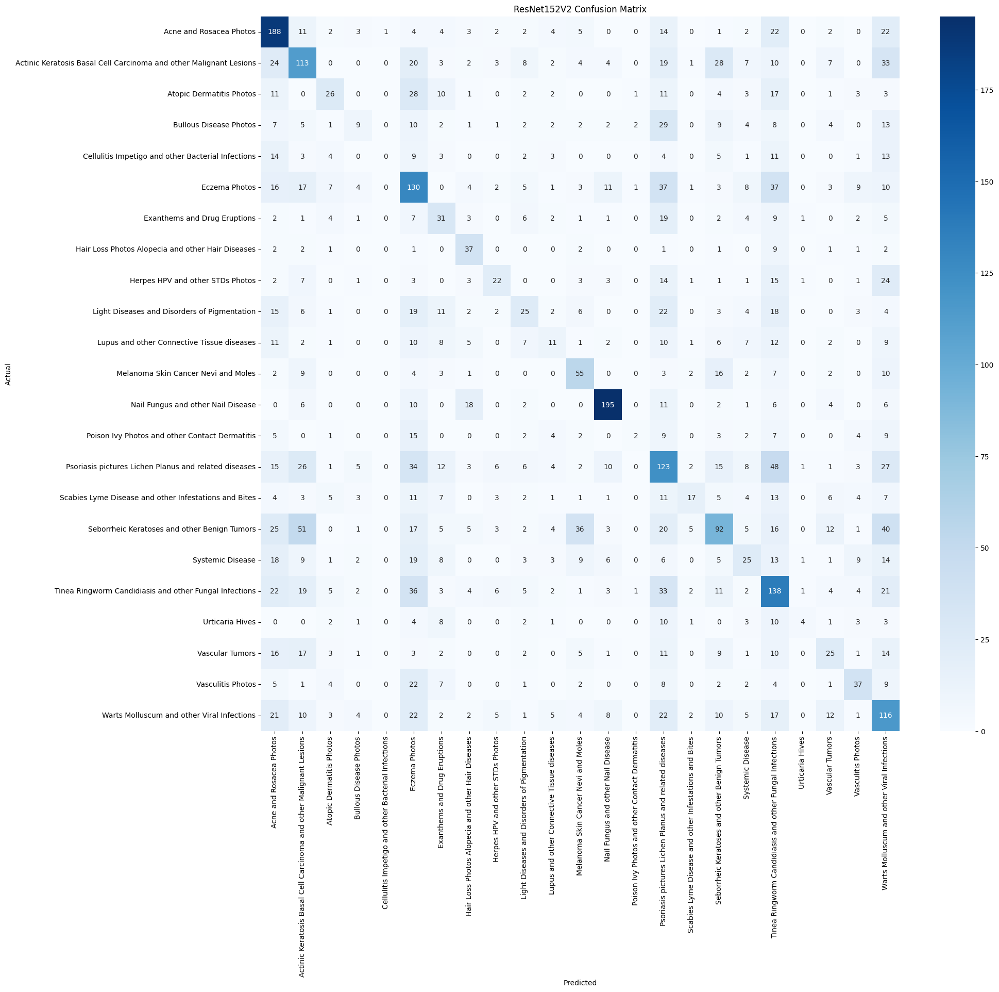


Training DenseNet121
Found 12105 images belonging to 23 classes.
Found 3017 images belonging to 23 classes.
Computed class weights: {0: 0.7831909937888198, 1: 0.572069943289225, 2: 1.3426131322094055, 3: 1.4660288240280974, 4: 2.2783738001129303, 5: 0.5326967083259989, 6: 1.6243961352657006, 7: 2.7411684782608696, 8: 1.6243961352657006, 9: 1.1567128523650263, 10: 1.5663819875776397, 11: 1.4186101019571078, 12: 0.6325773411371237, 13: 2.530309364548495, 14: 0.4682423023363763, 15: 1.5255198487712665, 16: 0.70267603181053, 17: 1.0851636037651278, 18: 0.506061872909699, 19: 3.0959079283887467, 20: 1.3634827663888263, 21: 1.5804935370152762, 22: 0.6056436683844499}
Starting Phase 1 training for DenseNet121...
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


379/379 ━━━━━━━━━━━━━━━━━━━━ 252s 595ms/step - accuracy: 0.1095 - loss: 0.7403 - val_accuracy: 0.2032 - val_loss: 0.5982 - learning_rate: 1.0000e-04
Epoch 2/50
379/379 ━━━━━━━━━━━━━━━━━━━━ 209s 543ms/step - accuracy: 0.2289 - loss: 0.5837 - val_accuracy: 0.2217 - val_loss: 0.5749 - learning_rate: 1.0000e-04
Epoch 3/50
379/379 ━━━━━━━━━━━━━━━━━━━━ 208s 541ms/step - accuracy: 0.2570 - loss: 0.5426 - val_accuracy: 0.2317 - val_loss: 0.5645 - learning_rate: 1.0000e-04
Epoch 4/50
379/379 ━━━━━━━━━━━━━━━━━━━━ 207s 539ms/step - accuracy: 0.2656 - loss: 0.5382 - val_accuracy: 0.2420 - val_loss: 0.5573 - learning_rate: 1.0000e-04
Epoch 5/50
379/379 ━━━━━━━━━━━━━━━━━━━━ 208s 540ms/step - accuracy: 0.2848 - loss: 0.5157 - val_accuracy: 0.2416 - val_loss: 0.5543 - learning_rate: 1.0000e-04
Epoch 6/50
379/379 ━━━━━━━━━━━━━━━━━━━━ 207s 539ms/step - accuracy: 0.3029 - loss: 0.5016 - val_accuracy: 0.2516 - val_loss: 0.5485 - learning_rate: 1.0000e-04
Epoch 7/50
379/379 ━━━━━━━━━━━━━━━━━━━━ 207s 539ms/

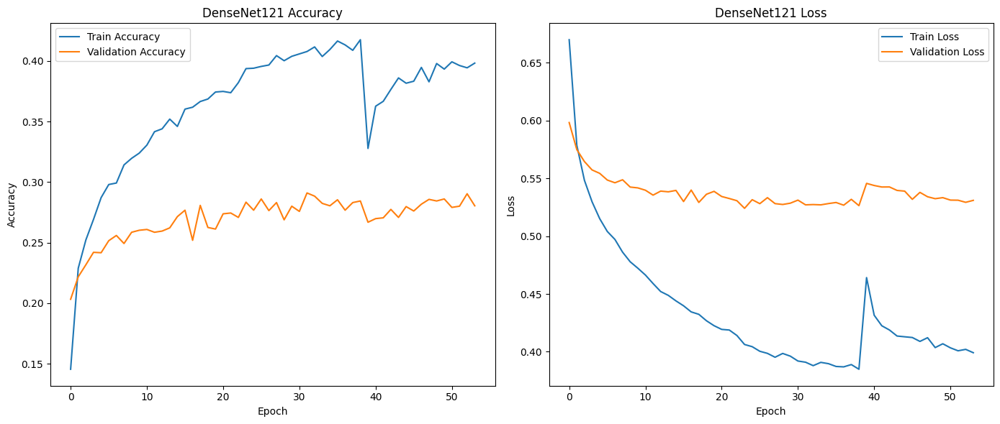

Found 3982 images belonging to 23 classes.
Evaluating DenseNet121 on test data...
125/125 ━━━━━━━━━━━━━━━━━━━━ 39s 259ms/step

Classification Report for DenseNet121:

                                                                    precision    recall  f1-score   support

                                           Acne and Rosacea Photos       0.54      0.39      0.45       292
Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions       0.36      0.43      0.39       288
                                          Atopic Dermatitis Photos       0.38      0.24      0.29       123
                                            Bullous Disease Photos       0.15      0.04      0.07       113
                Cellulitis Impetigo and other Bacterial Infections       0.15      0.03      0.05        73
                                                     Eczema Photos       0.37      0.44      0.40       309
                                      Exanthems and Drug Eruptions       0.2

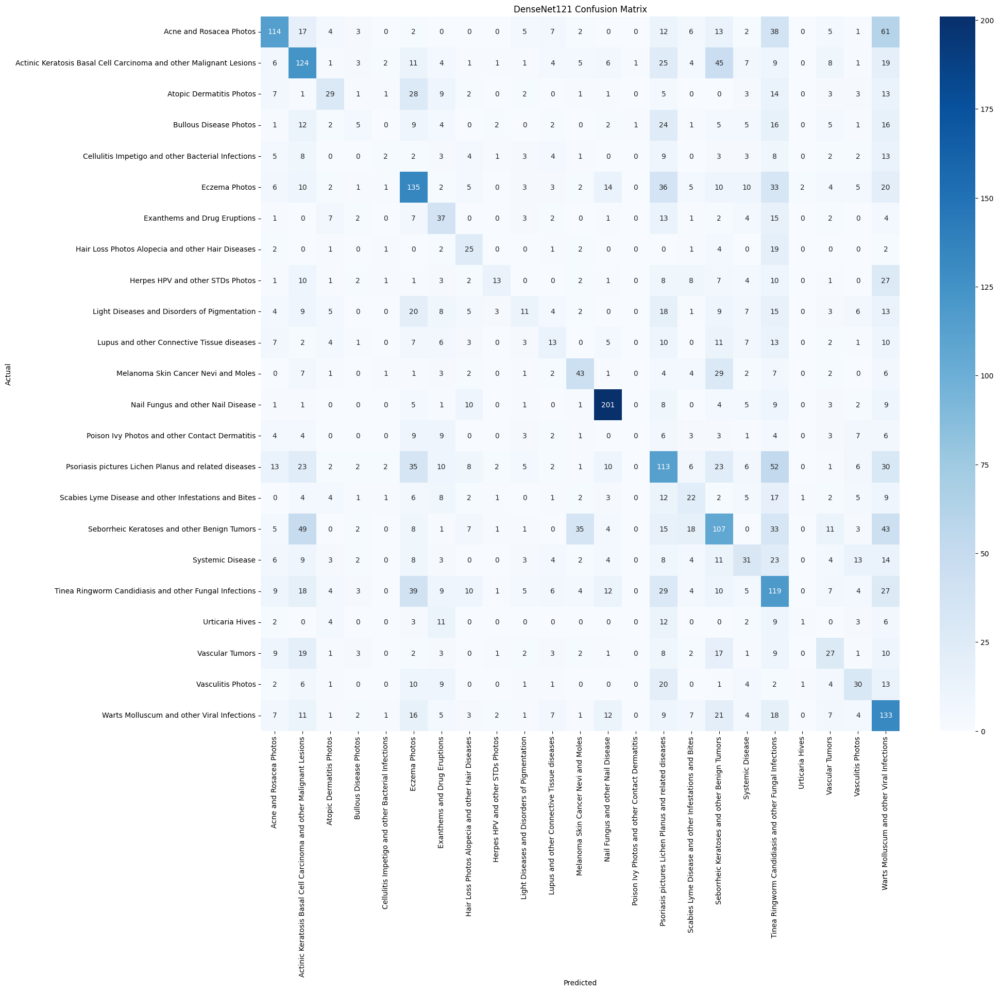

In [6]:
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import (
    EfficientNetB0, InceptionV3, ResNet152V2, DenseNet121
)
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
from sklearn.utils import class_weight
from sklearn.metrics import classification_report, confusion_matrix

# Set random seeds for reproducibility
tf.random.set_seed(42)
np.random.seed(42)

# Define Focal Loss
def focal_loss(gamma=2., alpha=0.25):
    """
    Focal loss for multi-class classification
    FL(p_t) = -alpha * (1 - p_t)^gamma * log(p_t)
    """
    def focal_loss_fixed(y_true, y_pred):
        epsilon = tf.keras.backend.epsilon()
        y_true = tf.cast(y_true, tf.float32)
        y_pred = tf.clip_by_value(y_pred, epsilon, 1. - epsilon)
        cross_entropy = -y_true * tf.math.log(y_pred)
        weight = alpha * tf.pow(1 - y_pred, gamma)
        loss = weight * cross_entropy
        return tf.reduce_mean(tf.reduce_sum(loss, axis=-1))
    return focal_loss_fixed

# Define Model Building Function
def build_model(base_model, num_classes):
    """
    Builds a model by adding custom layers on top of the base_model.
    """
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(512, activation='relu')(x)
    x = Dropout(0.5)(x)
    predictions = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    return model

# Define a function to train and evaluate a model
def train_and_evaluate_model(model_name, base_model_class, input_size, preprocess_func, train_dir, test_dir, save_dir):
    """
    Trains and evaluates a given model.

    Parameters:
    - model_name: Name of the model (string)
    - base_model_class: Keras application base model class
    - input_size: Tuple specifying image size (height, width)
    - preprocess_func: Preprocessing function specific to the base model
    - train_dir: Directory path for training data
    - test_dir: Directory path for test data
    - save_dir: Directory path to save the trained model
    """
    print(f"\n{'='*30}\nTraining {model_name}\n{'='*30}")

    # Create ImageDataGenerators with model-specific preprocessing
    train_datagen = ImageDataGenerator(
        preprocessing_function=preprocess_func,
        rotation_range=30,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        vertical_flip=True,
        fill_mode='nearest',
        validation_split=0.2  # 80-20 split
    )

    # Training generator
    train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=input_size,
        batch_size=32,
        class_mode='categorical',
        subset='training',
        shuffle=True,
        seed=42
    )

    # Validation generator
    val_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=input_size,
        batch_size=32,
        class_mode='categorical',
        subset='validation',
        shuffle=False,
        seed=42
    )

    # Compute class weights based on training data
    classes = train_generator.classes
    class_weights_array = class_weight.compute_class_weight(
        class_weight='balanced',
        classes=np.unique(classes),
        y=classes
    )
    class_weights = {i: weight for i, weight in enumerate(class_weights_array)}
    print(f"Computed class weights: {class_weights}")

    # Get number of classes
    num_classes = len(train_generator.class_indices)

    # Load the base model with pre-trained ImageNet weights
    base_model = base_model_class(weights='imagenet', include_top=False, input_shape=(input_size[0], input_size[1], 3))

    # Phase 1: Train top layers
    base_model.trainable = False  # Freeze base model

    # Build the model
    model = build_model(base_model, num_classes)

    # Compile the model
    model.compile(
        optimizer=Adam(learning_rate=1e-4),
        loss=focal_loss(),
        metrics=['accuracy']
    )

    # Define callbacks
    reduce_lr = ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,
        patience=5,
        min_lr=1e-7,
        verbose=1
    )
    early_stopping = EarlyStopping(
        monitor='val_loss',
        patience=15,
        restore_best_weights=True,
        verbose=1
    )

    # Train the model (Phase 1)
    print(f"Starting Phase 1 training for {model_name}...")
    history1 = model.fit(
        train_generator,
        validation_data=val_generator,
        epochs=50,
        callbacks=[reduce_lr, early_stopping],
        class_weight=class_weights
    )

    # Phase 2: Fine-tune some layers of the base model
    base_model.trainable = True  # Unfreeze the base model

    # Freeze all layers except the last 20 layers
    for layer in base_model.layers[:-20]:
        layer.trainable = False
    print(f"Fine-tuning {model_name}: Unfroze the last 20 layers.")

    # Re-compile the model with a lower learning rate
    model.compile(
        optimizer=Adam(learning_rate=1e-5),
        loss=focal_loss(),
        metrics=['accuracy']
    )

    # Train the model (Phase 2)
    print(f"Starting Phase 2 training for {model_name}...")
    history2 = model.fit(
        train_generator,
        validation_data=val_generator,
        epochs=50,
        callbacks=[reduce_lr, early_stopping],
        class_weight=class_weights
    )

    # Combine training histories
    history = {}
    for key in history1.history:
        history[key] = history1.history[key] + history2.history[key]

    # Save the trained model
    model_save_path = os.path.join(save_dir, f"{model_name}_disease_model.keras")
    model.save(model_save_path)
    print(f"Model saved to {model_save_path}")

    # Plot training history
    plt.figure(figsize=(14, 6))

    # Plot Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history['accuracy'], label='Train Accuracy')
    plt.plot(history['val_accuracy'], label='Validation Accuracy')
    plt.title(f'{model_name} Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    # Plot Loss
    plt.subplot(1, 2, 2)
    plt.plot(history['loss'], label='Train Loss')
    plt.plot(history['val_loss'], label='Validation Loss')
    plt.title(f'{model_name} Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()

    # Create test data generator with model-specific preprocessing
    test_datagen = ImageDataGenerator(
        preprocessing_function=preprocess_func
    )

    test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=input_size,
        batch_size=32,
        class_mode='categorical',
        shuffle=False
    )

    # Predict on test data
    print(f"Evaluating {model_name} on test data...")
    test_generator.reset()
    y_pred = model.predict(test_generator, verbose=1)
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true = test_generator.classes
    class_labels = list(test_generator.class_indices.keys())

    # Classification Report
    print(f"\nClassification Report for {model_name}:\n")
    print(classification_report(y_true, y_pred_classes, target_names=class_labels))

    # Confusion Matrix
    cm = confusion_matrix(y_true, y_pred_classes)
    plt.figure(figsize=(20, 18))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_labels, yticklabels=class_labels)
    plt.title(f'{model_name} Confusion Matrix')
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.xticks(rotation=90)
    plt.yticks(rotation=0)
    plt.show()

# Define model configurations
model_configs = [
    {
        'name': 'EfficientNetB0',
        'base_model_class': EfficientNetB0,
        'input_size': (224, 224),
        'preprocess_func': tf.keras.applications.efficientnet.preprocess_input
    },
    {
        'name': 'InceptionV3',
        'base_model_class': InceptionV3,
        'input_size': (299, 299),
        'preprocess_func': tf.keras.applications.inception_v3.preprocess_input
    },
    {
        'name': 'ResNet152V2',
        'base_model_class': ResNet152V2,
        'input_size': (224, 224),
        'preprocess_func': tf.keras.applications.resnet_v2.preprocess_input
    },
    {
        'name': 'DenseNet121',
        'base_model_class': DenseNet121,
        'input_size': (224, 224),
        'preprocess_func': tf.keras.applications.densenet.preprocess_input
    }
]

# Define directories
train_dir = '/content/drive/MyDrive/skin_disease_dataset/train'
test_dir = '/content/drive/MyDrive/skin_disease_dataset/test'
save_dir = '/content/drive/MyDrive/'

# Iterate over models and train each separately
for config in model_configs:
    train_and_evaluate_model(
        model_name=config['name'],
        base_model_class=config['base_model_class'],
        input_size=config['input_size'],
        preprocess_func=config['preprocess_func'],
        train_dir=train_dir,
        test_dir=test_dir,
        save_dir=save_dir
    )


Code for the First Dataset from ISIC which only contains Malignant and Benign Images

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [2]:
import os

# Create a directory for the dataset
os.makedirs('/content/siim-isic-melanoma', exist_ok=True)


# Download metadata
!wget -O /content/siim-isic-melanoma/ISIC_2020_Training_GroundTruth_v2.csv https://isic-challenge-data.s3.amazonaws.com/2020/ISIC_2020_Training_GroundTruth_v2.csv

--2024-08-23 18:24:38--  https://isic-challenge-data.s3.amazonaws.com/2020/ISIC_2020_Training_GroundTruth_v2.csv
Resolving isic-challenge-data.s3.amazonaws.com (isic-challenge-data.s3.amazonaws.com)... 3.5.30.186, 52.216.153.116, 3.5.29.142, ...
Connecting to isic-challenge-data.s3.amazonaws.com (isic-challenge-data.s3.amazonaws.com)|3.5.30.186|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2387418 (2.3M) [text/csv]
Saving to: ‘/content/siim-isic-melanoma/ISIC_2020_Training_GroundTruth_v2.csv’

/content/siim-isic- 100%[===================>]   2.28M  4.19MB/s    in 0.5s    

2024-08-23 18:24:38 (4.19 MB/s) - ‘/content/siim-isic-melanoma/ISIC_2020_Training_GroundTruth_v2.csv’ saved [2387418/2387418]



In [3]:
import zipfile
import pandas as pd


# Define paths
zip_file_path = '/content/drive/MyDrive/Colab Notebooks/ISIC_2020_Training_JPEG.zip'
extracted_images_path = 'extracted_images'

# Extract images
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extracted_images_path)

# Load metadata
metadata = pd.read_csv('/content/siim-isic-melanoma/ISIC_2020_Training_GroundTruth_v2.csv')

# Display metadata information
metadata.info()
metadata.describe()
metadata.head()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33126 entries, 0 to 33125
Data columns (total 9 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   image_name                     33126 non-null  object 
 1   patient_id                     33126 non-null  object 
 2   lesion_id                      33126 non-null  object 
 3   sex                            33061 non-null  object 
 4   age_approx                     33058 non-null  float64
 5   anatom_site_general_challenge  32599 non-null  object 
 6   diagnosis                      33126 non-null  object 
 7   benign_malignant               33126 non-null  object 
 8   target                         33126 non-null  int64  
dtypes: float64(1), int64(1), object(7)
memory usage: 2.3+ MB


,image_name,patient_id,lesion_id,sex,age_approx,anatom_site_general_challenge,diagnosis,benign_malignant,target
0,ISIC_2637011,IP_7279968,IL_7972535,male,45.0,head/neck,unknown,benign,0
1,ISIC_0015719,IP_3075186,IL_4649854,female,45.0,upper extremity,unknown,benign,0
2,ISIC_0052212,IP_2842074,IL_9087444,female,50.0,lower extremity,nevus,benign,0
3,ISIC_0068279,IP_6890425,IL_4255399,female,45.0,head/neck,unknown,benign,0
4,ISIC_0074268,IP_8723313,IL_6898037,female,55.0,upper extremity,unknown,benign,0


In [4]:
import os
import shutil
import pandas as pd

# Load metadata
metadata = pd.read_csv('/content/siim-isic-melanoma/ISIC_2020_Training_GroundTruth_v2.csv')

# Define paths
extracted_images_path = 'extracted_images'
train_path = 'balanced_train'
val_path = 'balanced_val'

# Create directories for train and validation
os.makedirs(os.path.join(train_path, 'benign'), exist_ok=True)
os.makedirs(os.path.join(train_path, 'malignant'), exist_ok=True)
os.makedirs(os.path.join(val_path, 'benign'), exist_ok=True)
os.makedirs(os.path.join(val_path, 'malignant'), exist_ok=True)

# Separate images by class
benign_images = metadata[metadata['target'] == 0]['image_name'].tolist()
malignant_images = metadata[metadata['target'] == 1]['image_name'].tolist()

# Balance the dataset by copying the same number of benign and malignant images
min_samples = min(len(benign_images), len(malignant_images))

benign_images = benign_images[:min_samples]
malignant_images = malignant_images[:min_samples]

# Define a function to copy images to the respective folders
def copy_images(image_list, dest_folder, source_folder):
    for image_name in image_list:
        image_filename = f"{image_name}.jpg"
        src = os.path.join(source_folder, image_filename)
        dst = os.path.join(dest_folder, image_filename)
        if os.path.exists(src):
            shutil.copy(src, dst)

# Split into train and validation sets (e.g., 80% train, 20% validation)
train_size = int(0.8 * min_samples)

benign_train = benign_images[:train_size]
benign_val = benign_images[train_size:]

malignant_train = malignant_images[:train_size]
malignant_val = malignant_images[train_size:]

# Copy images to class-specific train and validation folders
copy_images(benign_train, os.path.join(train_path, 'benign'), extracted_images_path)
copy_images(malignant_train, os.path.join(train_path, 'malignant'), extracted_images_path)

copy_images(benign_val, os.path.join(val_path, 'benign'), extracted_images_path)
copy_images(malignant_val, os.path.join(val_path, 'malignant'), extracted_images_path)

print(f"Train dataset: {len(benign_train)} benign, {len(malignant_train)} malignant images")
print(f"Validation dataset: {len(benign_val)} benign, {len(malignant_val)} malignant images")


Train dataset: 467 benign, 467 malignant images
Validation dataset: 117 benign, 117 malignant images


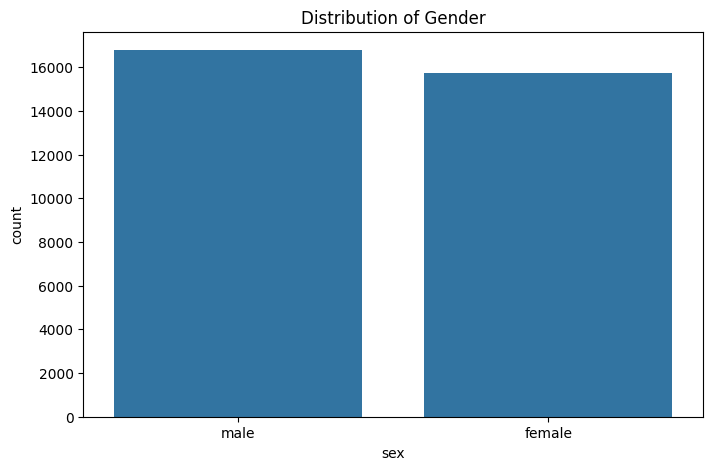

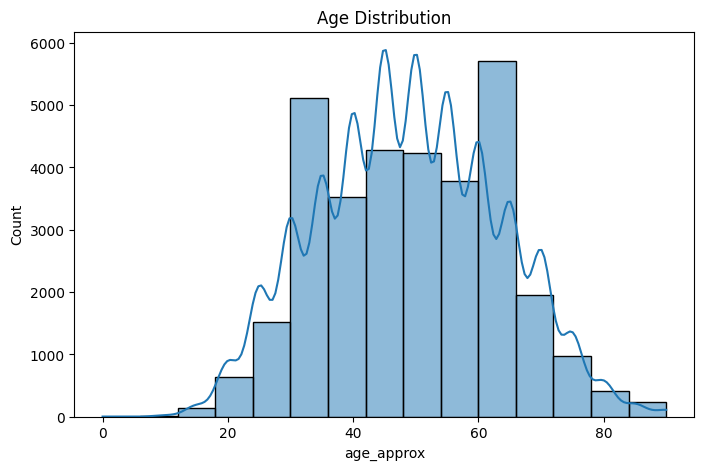

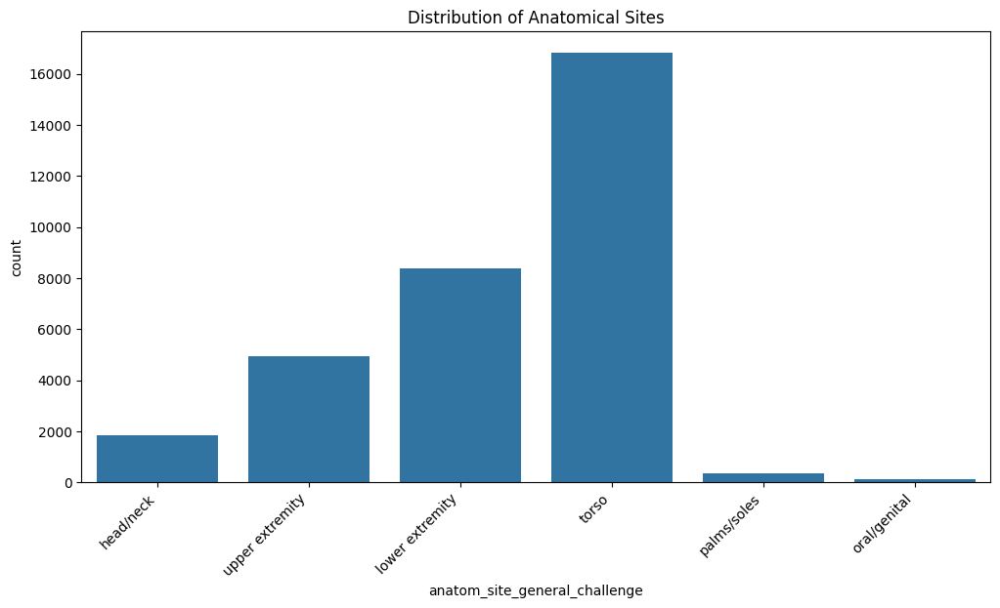

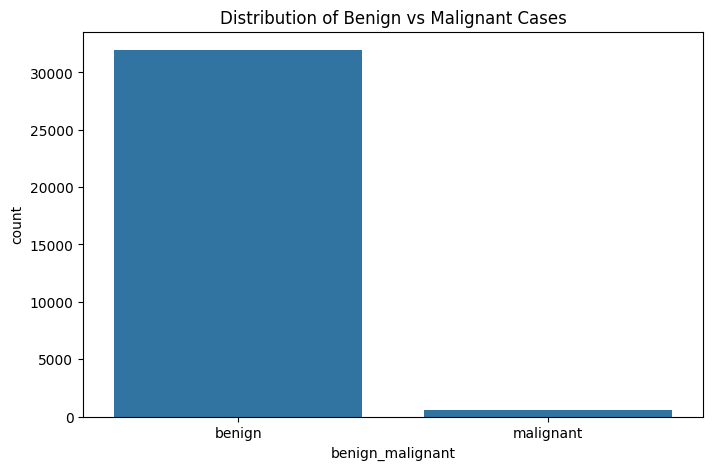

In [4]:
import os
import shutil
import random
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import numpy as np
from keras.utils import to_categorical
from keras.callbacks import ReduceLROnPlateau, EarlyStopping

# Drop rows with missing values in certain columns
metadata_clean = metadata.dropna(subset=['sex', 'age_approx', 'anatom_site_general_challenge'])

# Visualizations
plt.figure(figsize=(8, 5))
sns.countplot(data=metadata_clean, x='sex')
plt.title('Distribution of Gender')
plt.show()

plt.figure(figsize=(8, 5))
sns.histplot(metadata_clean['age_approx'], bins=15, kde=True)
plt.title('Age Distribution')
plt.show()

plt.figure(figsize=(12, 6))
sns.countplot(data=metadata_clean, x='anatom_site_general_challenge')
plt.xticks(rotation=45, ha='right')
plt.title('Distribution of Anatomical Sites')
plt.show()

plt.figure(figsize=(8, 5))
sns.countplot(data=metadata_clean, x='benign_malignant')
plt.title('Distribution of Benign vs Malignant Cases')
plt.show()


In [18]:
# Directory paths
source_dir = "/content/extracted_images/train"
dest_train_dir = "/content/extracted_images_split/train"
dest_val_dir = "/content/extracted_images_split/val"

# Create destination directories if they don't exist
os.makedirs(dest_train_dir, exist_ok=True)
os.makedirs(dest_val_dir, exist_ok=True)

# Shuffle and split data
image_files = os.listdir(source_dir)
random.shuffle(image_files)
split_index = int(len(image_files) * 0.8)
train_files = image_files[:split_index]
val_files = image_files[split_index:]

# Copy files to the respective directories
for file_name in train_files:
    shutil.copy(os.path.join(source_dir, file_name), os.path.join(dest_train_dir, file_name))
for file_name in val_files:
    shutil.copy(os.path.join(source_dir, file_name), os.path.join(dest_val_dir, file_name))

print(f"Training images copied: {len(train_files)}")
print(f"Validation images copied: {len(val_files)}")


Training images copied: 26500
Validation images copied: 6626


In [5]:
import os
import pandas as pd
import random
import shutil

# Define paths
metadata_file_path = '/content/siim-isic-melanoma/ISIC_2020_Training_GroundTruth_v2.csv'
source_dir = "/content/extracted_images/train"
balanced_train_dir = "/content/extracted_images_balanced/train"
balanced_val_dir = "/content/extracted_images_balanced/val"

# Create directories if they don't exist
os.makedirs(balanced_train_dir, exist_ok=True)
os.makedirs(balanced_val_dir, exist_ok=True)

# Load metadata
metadata = pd.read_csv(metadata_file_path)

# Split metadata into benign and malignant
benign_metadata = metadata[metadata['benign_malignant'] == 'benign']
malignant_metadata = metadata[metadata['benign_malignant'] == 'malignant']

# Balance the dataset by undersampling the benign class
benign_metadata_sample = benign_metadata.sample(n=len(malignant_metadata), random_state=42)

# Concatenate the benign sample with malignant metadata to create a balanced dataset
balanced_metadata = pd.concat([benign_metadata_sample, malignant_metadata])

# Shuffle the balanced metadata
balanced_metadata = balanced_metadata.sample(frac=1, random_state=42).reset_index(drop=True)

# Split into train and validation sets
split_index = int(len(balanced_metadata) * 0.8)
train_metadata = balanced_metadata[:split_index]
val_metadata = balanced_metadata[split_index:]

# Copy the images to the respective directories
for _, row in train_metadata.iterrows():
    image_name = row['image_name'] + ".jpg"
    shutil.copy(os.path.join(source_dir, image_name), os.path.join(balanced_train_dir, image_name))

for _, row in val_metadata.iterrows():
    image_name = row['image_name'] + ".jpg"
    shutil.copy(os.path.join(source_dir, image_name), os.path.join(balanced_val_dir, image_name))

print(f"Training images copied: {len(train_metadata)}")
print(f"Validation images copied: {len(val_metadata)}")


Training images copied: 934
Validation images copied: 234


Training set distribution:
benign_malignant
benign       481
malignant    453
Name: count, dtype: int64


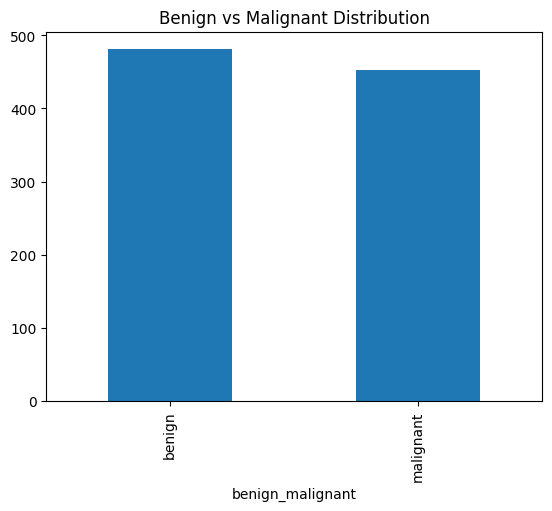

In [9]:
import pandas as pd
import os

# Load the balanced metadata for training and validation sets
train_metadata_path = os.path.join(balanced_train_dir, 'train_metadata.csv')
val_metadata_path = os.path.join(balanced_val_dir, 'val_metadata.csv')

# Function to calculate and display distribution
def check_balance(metadata):
    balance = metadata['benign_malignant'].value_counts()
    print(balance)
    balance.plot(kind='bar', title='Benign vs Malignant Distribution')

# Check balance for training set
print("Training set distribution:")
check_balance(train_metadata)

# Check balance for validation set


In [6]:
# Update the extracted images path if the images are inside a subdirectory
extracted_images_path = os.path.join(extracted_images_path, 'train')


In [7]:
import os

# Define paths
train_dir = '/content/extracted_images_balanced/train'
val_dir = '/content/extracted_images_balanced/val'

# Create directories for classes if they don't exist
os.makedirs(os.path.join(train_dir, 'benign'), exist_ok=True)
os.makedirs(os.path.join(train_dir, 'malignant'), exist_ok=True)
os.makedirs(os.path.join(val_dir, 'benign'), exist_ok=True)
os.makedirs(os.path.join(val_dir, 'malignant'), exist_ok=True)


In [8]:
# Define a function to copy images to the respective folders
def copy_images(image_list, dest_folder, source_folder):
    os.makedirs(dest_folder, exist_ok=True)  # Ensure the folder exists
    for image_name in image_list:
        image_filename = f"{image_name}.jpg"  # Ensure the extension matches
        src = os.path.join(source_folder, image_filename)
        dst = os.path.join(dest_folder, image_filename)
        if os.path.exists(src):
            shutil.copy(src, dst)
        else:
            print(f"File not found: {src}")

# Re-run the copy process for train and validation
copy_images(benign_train, os.path.join(train_path, 'benign'), extracted_images_path)
copy_images(malignant_train, os.path.join(train_path, 'malignant'), extracted_images_path)

copy_images(benign_val, os.path.join(val_path, 'benign'), extracted_images_path)
copy_images(malignant_val, os.path.join(val_path, 'malignant'), extracted_images_path)


In [9]:
import shutil
import pandas as pd

# Load metadata
metadata = pd.read_csv('/content/siim-isic-melanoma/ISIC_2020_Training_GroundTruth_v2.csv')

# Define source image directory
source_images_dir = '/content/extracted_images/train'

# Define function to copy images to class directories
def copy_images(metadata, target_dir):
    for _, row in metadata.iterrows():
        image_name = row['image_name'] + '.jpg'
        source_path = os.path.join(source_images_dir, image_name)

        if os.path.exists(source_path):
            target_class_dir = os.path.join(target_dir, row['benign_malignant'])
            shutil.copy(source_path, os.path.join(target_class_dir, image_name))
        else:
            print(f"Image {image_name} not found.")

# Split metadata into train and validation sets
split_index = int(len(metadata) * 0.8)
train_metadata = metadata[:split_index]
val_metadata = metadata[split_index:]

# Copy images to train and validation directories
print("Copying training images...")
copy_images(train_metadata, train_dir)
print("Copying validation images...")
copy_images(val_metadata, val_dir)


Copying training images...
Copying validation images...


In [15]:
import tensorflow as tf
from tensorflow.keras.applications import VGG16, VGG19, ResNet50, DenseNet121
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# Define paths
train_dir = balanced_train_dir
val_dir = balanced_val_dir

# Image size and parameters
IMG_SIZE = (224, 224)
BATCH_SIZE = 32
EPOCHS = 10

# Data generators
train_datagen = ImageDataGenerator(rescale=1./255)
val_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='binary'
)

val_generator = val_datagen.flow_from_directory(
    val_dir,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='binary',
    shuffle=False
)


Found 26500 images belonging to 2 classes.
Found 6626 images belonging to 2 classes.


In [14]:
import tensorflow as tf
from tensorflow.keras.applications import VGG16, VGG19, ResNet50, DenseNet121
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import ReduceLROnPlateau
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import os

# Define paths
balanced_train_dir = "/content/balanced_train"
balanced_val_dir = "/content/balanced_val"

# Image size and parameters
IMG_SIZE = (224, 224)
BATCH_SIZE = 32
EPOCHS = 10

# Data generators
train_datagen = ImageDataGenerator(rescale=1./255)
val_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    balanced_train_dir,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='binary'
)

val_generator = val_datagen.flow_from_directory(
    balanced_val_dir,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='binary',
    shuffle=False
)

Found 934 images belonging to 2 classes.
Found 234 images belonging to 2 classes.


In [15]:
# Define a function to build a model
def build_model(base_model):
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    predictions = Dense(1, activation='sigmoid')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    return model

# Function to unfreeze the top layers of the base model
def unfreeze_layers(model, num_layers_to_unfreeze):
    for layer in model.layers[-num_layers_to_unfreeze:]:
        layer.trainable = True
    return model

# Function to compile, train and evaluate model
def train_evaluate_model(base_model, model_name):
    # Optionally unfreeze some layers for fine-tuning
    base_model = unfreeze_layers(base_model, 4)

    model = build_model(base_model)
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Learning rate scheduler
    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6, verbose=1)

    # Train the model
    history = model.fit(
        train_generator,
        steps_per_epoch=train_generator.samples // BATCH_SIZE,
        validation_data=val_generator,
        validation_steps=val_generator.samples // BATCH_SIZE,
        epochs=EPOCHS,
        class_weight=class_weights_dict,
        callbacks=[reduce_lr]
    )

    # Plot accuracy and loss
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Val Accuracy')
    plt.title(f'{model_name} Accuracy')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Val Loss')
    plt.title(f'{model_name} Loss')
    plt.legend()

    plt.show()

    # Predict on validation set
    val_generator.reset()
    y_pred = model.predict(val_generator)
    y_pred = (y_pred > 0.5).astype(int)  # Adjusting threshold

    y_true = val_generator.classes

    # Flatten predictions and true labels for classification report
    y_pred_flat = y_pred.flatten()
    y_true_flat = y_true.flatten()

    print(f"Classification Report for {model_name}:\n")
    print(classification_report(y_true_flat, y_pred_flat, target_names=['Benign', 'Malignant']))

    cm = confusion_matrix(y_true_flat, y_pred_flat)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Benign', 'Malignant'], yticklabels=['Benign', 'Malignant'])
    plt.title(f'{model_name} Confusion Matrix')
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.show()

# Load pre-trained models
models = {
    'VGG16': VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3)),
    'VGG19': VGG19(weights='imagenet', include_top=False, input_shape=(224, 224, 3)),
    'ResNet50': ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3)),
    'DenseNet121': DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
}

# Train and evaluate each model
for model_name, base_model in models.items():
    print(f"\nTraining {model_name}...")
    train_evaluate_model(base_model, model_name)



Training VGG16...
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


28/29 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - accuracy: 0.5042 - loss: 2.3345

RuntimeError: pybind11::error_already_set: MISMATCH of original and normalized active exception types: ORIGINAL InternalError REPLACED BY KeyboardInterrupt: <EMPTY MESSAGE>

At:
  /usr/local/lib/python3.10/dist-packages/tensorflow/python/framework/errors_impl.py(462): __init__
  /usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/execute.py(53): quick_execute
  /usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/context.py(1552): call_function
  /usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/polymorphic_function/atomic_function.py(251): call_flat
  /usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/polymorphic_function/atomic_function.py(216): call_preflattened
  /usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/polymorphic_function/concrete_function.py(1322): _call_flat
  /usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/polymorphic_function/tracing_compilation.py(139): call_function
  /usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/polymorphic_function/polymorphic_function.py(878): _call
  /usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/polymorphic_function/polymorphic_function.py(833): __call__
  /usr/local/lib/python3.10/dist-packages/tensorflow/python/util/traceback_utils.py(150): error_handler
  /usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/trainer.py(318): fit
  /usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py(117): error_handler
  <ipython-input-15-83295d9d01bf>(28): train_evaluate_model
  <ipython-input-15-83295d9d01bf>(87): <cell line: 85>
  /usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py(3553): run_code
  /usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py(3473): run_ast_nodes
  /usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py(3257): run_cell_async
  /usr/local/lib/python3.10/dist-packages/IPython/core/async_helpers.py(78): _pseudo_sync_runner
  /usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py(3030): _run_cell
  /usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py(2975): run_cell
  /usr/local/lib/python3.10/dist-packages/ipykernel/zmqshell.py(539): run_cell
  /usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py(302): do_execute
  /usr/local/lib/python3.10/dist-packages/tornado/gen.py(234): wrapper
  /usr/local/lib/python3.10/dist-packages/ipykernel/kernelbase.py(539): execute_request
  /usr/local/lib/python3.10/dist-packages/tornado/gen.py(234): wrapper
  /usr/local/lib/python3.10/dist-packages/ipykernel/kernelbase.py(261): dispatch_shell
  /usr/local/lib/python3.10/dist-packages/tornado/gen.py(234): wrapper
  /usr/local/lib/python3.10/dist-packages/ipykernel/kernelbase.py(361): process_one
  /usr/local/lib/python3.10/dist-packages/tornado/gen.py(786): run
  /usr/local/lib/python3.10/dist-packages/tornado/gen.py(825): inner
  /usr/local/lib/python3.10/dist-packages/tornado/ioloop.py(738): _run_callback
  /usr/local/lib/python3.10/dist-packages/tornado/ioloop.py(685): <lambda>
  /usr/lib/python3.10/asyncio/events.py(80): _run
  /usr/lib/python3.10/asyncio/base_events.py(1909): _run_once
  /usr/lib/python3.10/asyncio/base_events.py(603): run_forever
  /usr/local/lib/python3.10/dist-packages/tornado/platform/asyncio.py(195): start
  /usr/local/lib/python3.10/dist-packages/ipykernel/kernelapp.py(619): start
  /usr/local/lib/python3.10/dist-packages/traitlets/config/application.py(992): launch_instance
  /usr/local/lib/python3.10/dist-packages/colab_kernel_launcher.py(37): <module>
  /usr/lib/python3.10/runpy.py(86): _run_code
  /usr/lib/python3.10/runpy.py(196): _run_module_as_main


In [12]:
# Calculate class weights
from sklearn.utils.class_weight import compute_class_weight

class_weights = compute_class_weight('balanced', classes=np.unique(train_generator.classes), y=train_generator.classes)
class_weights_dict = dict(enumerate(class_weights))

print("Class Weights:", class_weights_dict)



Class Weights: {0: 1.0, 1: 1.0}


In [13]:
# Define a function to build a model
def build_model(base_model):
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    predictions = Dense(1, activation='sigmoid')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    return model

# Function to unfreeze the top layers of the base model
def unfreeze_layers(model, num_layers_to_unfreeze):
    for layer in model.layers[-num_layers_to_unfreeze:]:
        layer.trainable = True
    return model

# Function to compile, train and evaluate model
def train_evaluate_model(base_model, model_name):
    # Optionally unfreeze some layers for fine-tuning
    base_model = unfreeze_layers(base_model, 4)

    model = build_model(base_model)
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Learning rate scheduler
    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6, verbose=1)

    # Train the model
    history = model.fit(
        train_generator,
        steps_per_epoch=train_generator.samples // BATCH_SIZE,
        validation_data=val_generator,
        validation_steps=val_generator.samples // BATCH_SIZE,
        epochs=EPOCHS,
        class_weight=class_weights_dict,
        callbacks=[reduce_lr]
    )

    # Plot accuracy and loss
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Val Accuracy')
    plt.title(f'{model_name} Accuracy')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Val Loss')
    plt.title(f'{model_name} Loss')
    plt.legend()

    plt.show()

    # Predict on validation set
    val_generator.reset()
    y_pred = model.predict(val_generator)
    y_pred = (y_pred > 0.5).astype(int)  # Adjusting threshold

    y_true = val_generator.classes

    # Flatten predictions and true labels for classification report
    y_pred_flat = y_pred.flatten()
    y_true_flat = y_true.flatten()

    print(f"Classification Report for {model_name}:\n")
    print(classification_report(y_true_flat, y_pred_flat, target_names=['Benign', 'Malignant']))

    cm = confusion_matrix(y_true_flat, y_pred_flat)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Benign', 'Malignant'], yticklabels=['Benign', 'Malignant'])
    plt.title(f'{model_name} Confusion Matrix')
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.show()

# Load pre-trained models
models = {
    'VGG16': VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3)),
    'VGG19': VGG19(weights='imagenet', include_top=False, input_shape=(224, 224, 3)),
    'ResNet50': ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3)),
    'DenseNet121': DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
}

# Train and evaluate each model
for model_name, base_model in models.items():
    print(f"\nTraining {model_name}...")
    train_evaluate_model(base_model, model_name)


58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
29084464/29084464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

Training VGG16...


KeyboardInterrupt: 

Found 934 images belonging to 2 classes.
Found 234 images belonging to 2 classes.

Training VGG16...
Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


29/29 ━━━━━━━━━━━━━━━━━━━━ 80s 2s/step - accuracy: 0.5547 - loss: 0.6816 - val_accuracy: 0.5848 - val_loss: 0.6714 - learning_rate: 1.0000e-04
Epoch 2/20
 1/29 ━━━━━━━━━━━━━━━━━━━━ 13s 472ms/step - accuracy: 0.6875 - loss: 0.6524

/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6875 - loss: 0.6524 - val_accuracy: 0.1000 - val_loss: 0.8210 - learning_rate: 1.0000e-04
Epoch 3/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 64s 2s/step - accuracy: 0.5670 - loss: 0.6855 - val_accuracy: 0.6830 - val_loss: 0.6294 - learning_rate: 1.0000e-04
Epoch 4/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7812 - loss: 0.5108 - val_accuracy: 1.0000 - val_loss: 0.1614 - learning_rate: 1.0000e-04
Epoch 5/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 64s 2s/step - accuracy: 0.6703 - loss: 0.6179 - val_accuracy: 0.7009 - val_loss: 0.6350 - learning_rate: 1.0000e-04
Epoch 6/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.6875 - loss: 0.6419 - val_accuracy: 1.0000 - val_loss: 0.3298 - learning_rate: 1.0000e-04
Epoch 7/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.7464 - loss: 0.5463
Epoch 7: ReduceLROnPlateau reducing learning rate to 1.9999999494757503e-05.
29/29 ━━━━━━━━━━━━━━━━━━━━ 62s 2s/step - accuracy: 0.7455 - loss: 0.5472 - val_a

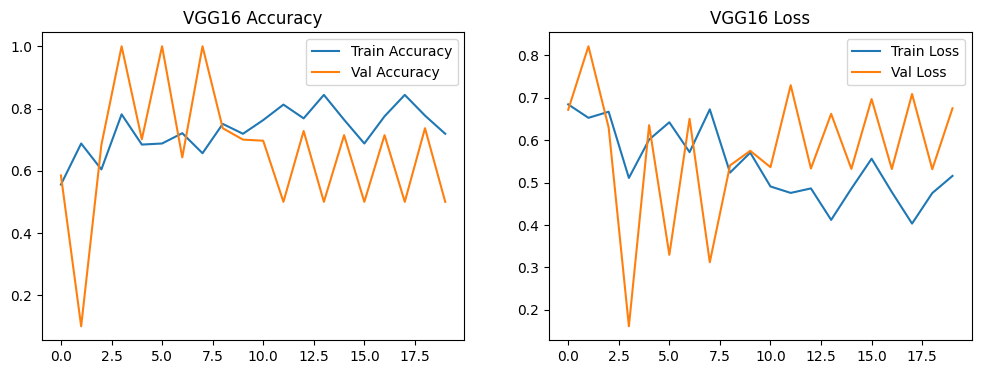

8/8 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step
Classification Report for VGG16:

              precision    recall  f1-score   support

      Benign       0.78      0.63      0.70       117
   Malignant       0.69      0.82      0.75       117

    accuracy                           0.73       234
   macro avg       0.73      0.73      0.72       234
weighted avg       0.73      0.73      0.72       234



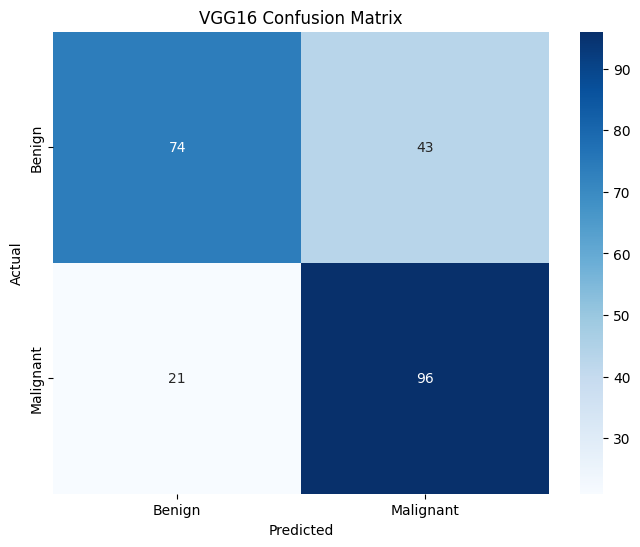


Training VGG19...
Epoch 1/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 74s 2s/step - accuracy: 0.5116 - loss: 0.6980 - val_accuracy: 0.5312 - val_loss: 0.6890 - learning_rate: 1.0000e-04
Epoch 2/20
 1/29 ━━━━━━━━━━━━━━━━━━━━ 15s 564ms/step - accuracy: 0.4688 - loss: 0.6937

/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.4688 - loss: 0.6937 - val_accuracy: 0.5000 - val_loss: 0.6912 - learning_rate: 1.0000e-04
Epoch 3/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 66s 2s/step - accuracy: 0.6255 - loss: 0.6575 - val_accuracy: 0.6964 - val_loss: 0.5843 - learning_rate: 1.0000e-04
Epoch 4/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8438 - loss: 0.5206 - val_accuracy: 0.3000 - val_loss: 0.8656 - learning_rate: 1.0000e-04
Epoch 5/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 67s 2s/step - accuracy: 0.7097 - loss: 0.5615 - val_accuracy: 0.6607 - val_loss: 0.5923 - learning_rate: 1.0000e-04
Epoch 6/20
 1/29 ━━━━━━━━━━━━━━━━━━━━ 15s 571ms/step - accuracy: 0.8438 - loss: 0.4777
Epoch 6: ReduceLROnPlateau reducing learning rate to 1.9999999494757503e-05.
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8438 - loss: 0.4777 - val_accuracy: 0.2000 - val_loss: 1.1018 - learning_rate: 1.0000e-04
Epoch 7/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 65s 2s/step - accuracy: 0.7646 - loss: 0.5251 - v

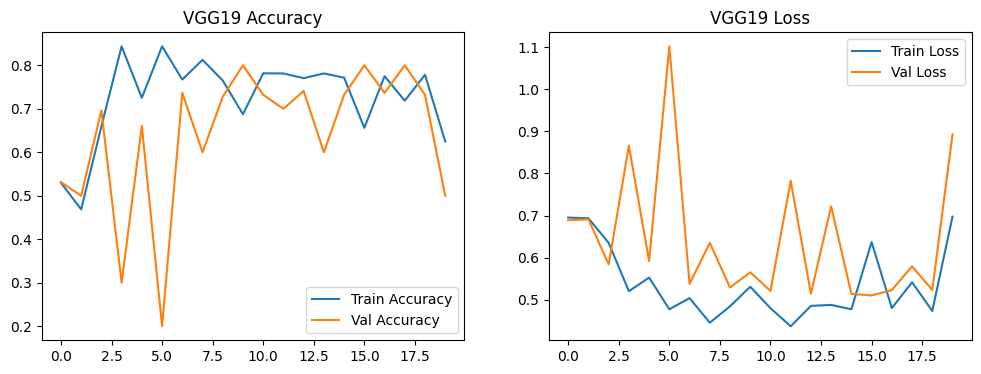

8/8 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step
Classification Report for VGG19:

              precision    recall  f1-score   support

      Benign       0.77      0.64      0.70       117
   Malignant       0.69      0.81      0.75       117

    accuracy                           0.73       234
   macro avg       0.73      0.73      0.72       234
weighted avg       0.73      0.73      0.72       234



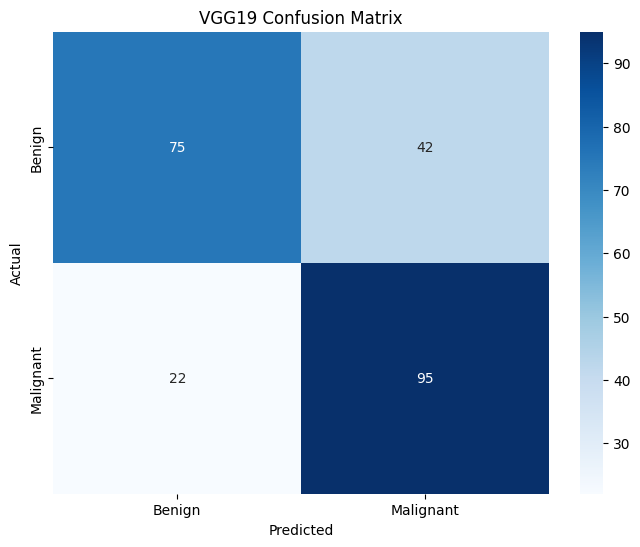


Training ResNet50...
Epoch 1/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 132s 2s/step - accuracy: 0.6895 - loss: 0.6103 - val_accuracy: 0.4777 - val_loss: 0.9733 - learning_rate: 1.0000e-04
Epoch 2/20
 1/29 ━━━━━━━━━━━━━━━━━━━━ 8s 312ms/step - accuracy: 0.7812 - loss: 0.4188

/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - accuracy: 0.7812 - loss: 0.4188 - val_accuracy: 1.0000 - val_loss: 0.2077 - learning_rate: 1.0000e-04
Epoch 3/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 98s 2s/step - accuracy: 0.8237 - loss: 0.4040 - val_accuracy: 0.4777 - val_loss: 1.9403 - learning_rate: 1.0000e-04
Epoch 4/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7500 - loss: 0.4055 - val_accuracy: 1.0000 - val_loss: 0.0099 - learning_rate: 1.0000e-04
Epoch 5/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 62s 2s/step - accuracy: 0.8604 - loss: 0.3312 - val_accuracy: 0.5223 - val_loss: 0.9380 - learning_rate: 1.0000e-04
Epoch 6/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9062 - loss: 0.3339 - val_accuracy: 0.0000e+00 - val_loss: 1.9107 - learning_rate: 1.0000e-04
Epoch 7/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8658 - loss: 0.3198
Epoch 7: ReduceLROnPlateau reducing learning rate to 1.9999999494757503e-05.
29/29 ━━━━━━━━━━━━━━━━━━━━ 63s 2s/step - accuracy: 0.8658 - loss: 0.3199 - v

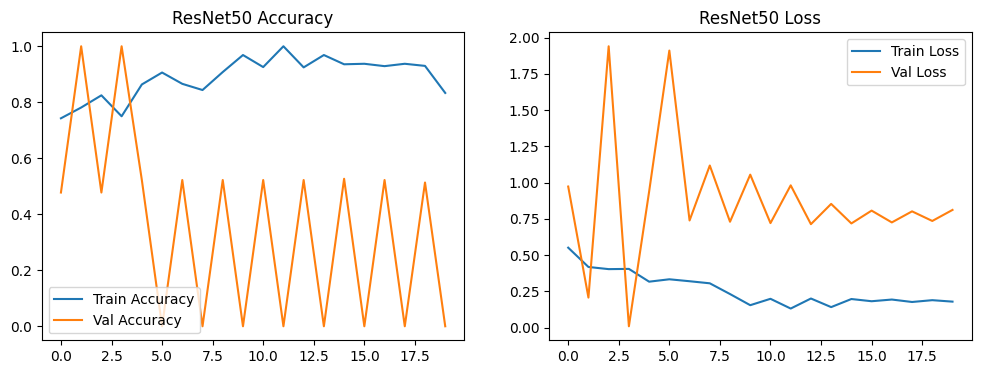

8/8 ━━━━━━━━━━━━━━━━━━━━ 14s 1s/step
Classification Report for ResNet50:

              precision    recall  f1-score   support

      Benign       0.48      0.85      0.62       117
   Malignant       0.35      0.08      0.13       117

    accuracy                           0.47       234
   macro avg       0.41      0.47      0.37       234
weighted avg       0.41      0.47      0.37       234



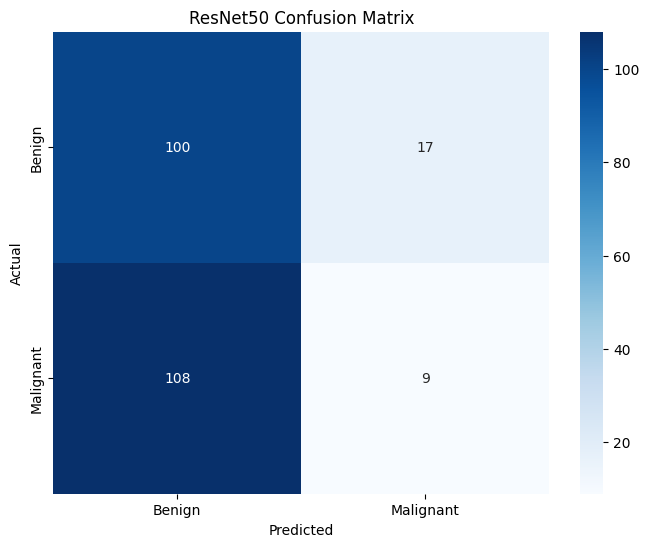


Training DenseNet121...
Epoch 1/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 191s 2s/step - accuracy: 0.6477 - loss: 0.6278 - val_accuracy: 0.5312 - val_loss: 0.7865 - learning_rate: 1.0000e-04
Epoch 2/20
 1/29 ━━━━━━━━━━━━━━━━━━━━ 37:52 81s/step - accuracy: 0.3333 - loss: 0.9496

/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


29/29 ━━━━━━━━━━━━━━━━━━━━ 85s 133ms/step - accuracy: 0.3333 - loss: 0.9496 - val_accuracy: 0.0000e+00 - val_loss: 1.3947 - learning_rate: 1.0000e-04
Epoch 3/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 69s 2s/step - accuracy: 0.7747 - loss: 0.4834 - val_accuracy: 0.6518 - val_loss: 0.6147 - learning_rate: 1.0000e-04
Epoch 4/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7812 - loss: 0.3916 - val_accuracy: 0.4000 - val_loss: 1.0496 - learning_rate: 1.0000e-04
Epoch 5/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 71s 2s/step - accuracy: 0.8539 - loss: 0.3432 - val_accuracy: 0.6071 - val_loss: 0.7049 - learning_rate: 1.0000e-04
Epoch 6/20
 1/29 ━━━━━━━━━━━━━━━━━━━━ 9s 324ms/step - accuracy: 0.6875 - loss: 0.4518
Epoch 6: ReduceLROnPlateau reducing learning rate to 1.9999999494757503e-05.
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6875 - loss: 0.4518 - val_accuracy: 0.0000e+00 - val_loss: 1.6080 - learning_rate: 1.0000e-04
Epoch 7/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 65s 2s/step - accuracy: 0.8698 - loss: 0

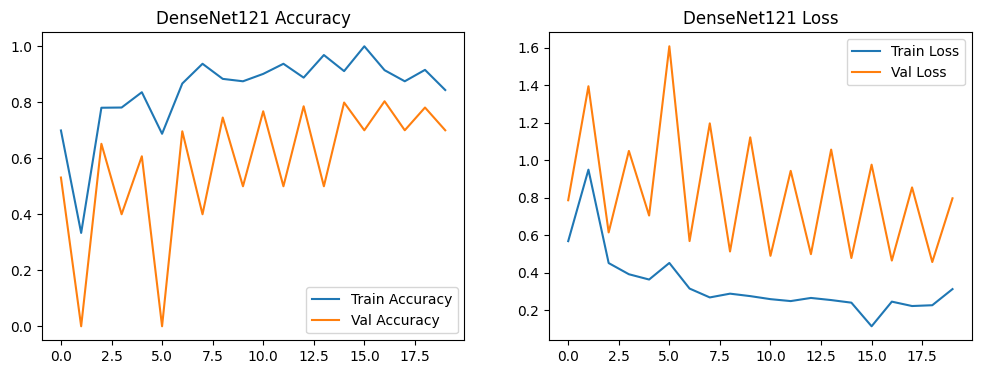

8/8 ━━━━━━━━━━━━━━━━━━━━ 22s 2s/step
Classification Report for DenseNet121:

              precision    recall  f1-score   support

      Benign       0.80      0.74      0.77       117
   Malignant       0.76      0.82      0.79       117

    accuracy                           0.78       234
   macro avg       0.78      0.78      0.78       234
weighted avg       0.78      0.78      0.78       234



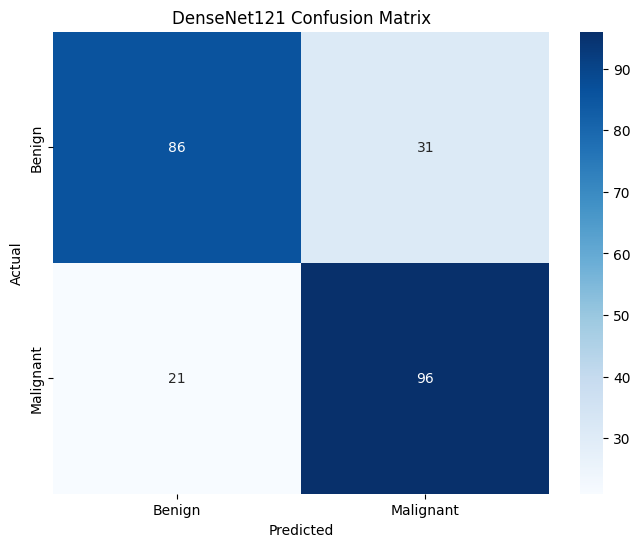

In [20]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras.applications import VGG16, VGG19, ResNet50, DenseNet121
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, confusion_matrix

# Define constants
BATCH_SIZE = 32
EPOCHS = 20

# Define a function to build a model
def build_model(base_model):
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    predictions = Dense(1, activation='sigmoid')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    return model

# Function to unfreeze the top layers of the base model
def unfreeze_layers(model, num_layers_to_unfreeze):
    for layer in model.layers[-num_layers_to_unfreeze:]:
        layer.trainable = True
    return model

# Data augmentation and preprocessing
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

val_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    balanced_train_dir,  # Replace with your actual directory
    target_size=(224, 224),
    batch_size=BATCH_SIZE,
    class_mode='binary'
)

val_generator = val_datagen.flow_from_directory(
    balanced_val_dir,  # Replace with your actual directory
    target_size=(224, 224),
    batch_size=BATCH_SIZE,
    class_mode='binary',
    shuffle=False
)

# Calculate class weights
class_weights = compute_class_weight('balanced', classes=np.unique(train_generator.classes), y=train_generator.classes)
class_weights_dict = dict(enumerate(class_weights))

# Function to compile, train, and evaluate model
def train_evaluate_model(base_model, model_name):
    # Unfreeze more layers for ResNet50 and VGG19 as they are deeper models
    if model_name == 'ResNet50':
        base_model = unfreeze_layers(base_model, 10)
    elif model_name == 'VGG19':
        base_model = unfreeze_layers(base_model, 5)
    else:
        base_model = unfreeze_layers(base_model, 4)  # Default for others

    model = build_model(base_model)
    model.compile(optimizer=Adam(learning_rate=1e-4), loss='binary_crossentropy', metrics=['accuracy'])

    # Learning rate scheduler
    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6, verbose=1)

    # Calculate steps per epoch
    steps_per_epoch = max(1, train_generator.samples // BATCH_SIZE)
    validation_steps = max(1, val_generator.samples // BATCH_SIZE)

    # Train the model
    history = model.fit(
        train_generator,
        steps_per_epoch=steps_per_epoch,
        validation_data=val_generator,
        validation_steps=validation_steps,
        epochs=EPOCHS,
        class_weight=class_weights_dict,
        callbacks=[reduce_lr]
    )


    # Plot accuracy and loss
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Val Accuracy')
    plt.title(f'{model_name} Accuracy')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Val Loss')
    plt.title(f'{model_name} Loss')
    plt.legend()

    plt.show()

    # Predict on validation set
    val_generator.reset()
    y_pred = model.predict(val_generator)
    y_pred = (y_pred > 0.5).astype(int)  # Adjusting threshold

    y_true = val_generator.classes

    # Flatten predictions and true labels for classification report
    y_pred_flat = y_pred.flatten()
    y_true_flat = y_true.flatten()

    print(f"Classification Report for {model_name}:\n")
    print(classification_report(y_true_flat, y_pred_flat, target_names=['Benign', 'Malignant']))

    cm = confusion_matrix(y_true_flat, y_pred_flat)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Benign', 'Malignant'], yticklabels=['Benign', 'Malignant'])
    plt.title(f'{model_name} Confusion Matrix')
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.show()

# Load pre-trained models
models = {
    'VGG16': VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3)),
    'VGG19': VGG19(weights='imagenet', include_top=False, input_shape=(224, 224, 3)),
    'ResNet50': ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3)),
    'DenseNet121': DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
}

# Train and evaluate each model
for model_name, base_model in models.items():
    print(f"\nTraining {model_name}...")
    train_evaluate_model(base_model, model_name)


In [ ]:
tuning


Training VGG16...
Epoch 1/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 75s 2s/step - accuracy: 0.5691 - loss: 7.2733 - val_accuracy: 0.6652 - val_loss: 6.5571 - learning_rate: 1.0000e-04
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.6875 - loss: 6.6031 - val_accuracy: 0.5000 - val_loss: 6.7203 - learning_rate: 1.0000e-04
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 67s 2s/step - accuracy: 0.7398 - loss: 6.3039 - val_accuracy: 0.7277 - val_loss: 5.8086 - learning_rate: 1.0000e-04
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7812 - loss: 5.7492 - val_accuracy: 0.9000 - val_loss: 5.5486 - learning_rate: 1.0000e-04
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 67s 2s/step - accuracy: 0.7692 - loss: 5.5128 - val_accuracy: 0.7098 - val_loss: 5.0924 - learning_rate: 1.0000e-04
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7812 - loss: 5.0630 - val_accuracy: 0.7000 - val_loss: 5.2430 - learning_rate: 1.0000e-04
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 64s 2s/step - accu

Model saved to /content/drive/MyDrive/VGG16_model.h5


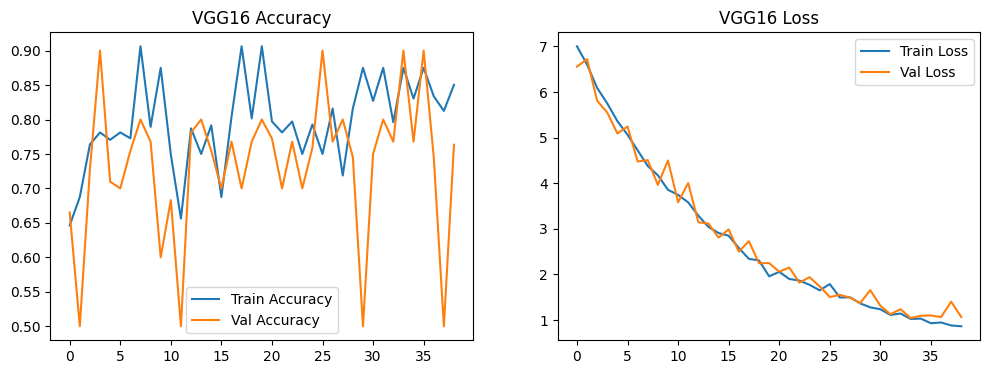

8/8 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step
Classification Report for VGG16:

              precision    recall  f1-score   support

      Benign       0.88      0.64      0.74       117
   Malignant       0.72      0.91      0.80       117

    accuracy                           0.78       234
   macro avg       0.80      0.78      0.77       234
weighted avg       0.80      0.78      0.77       234



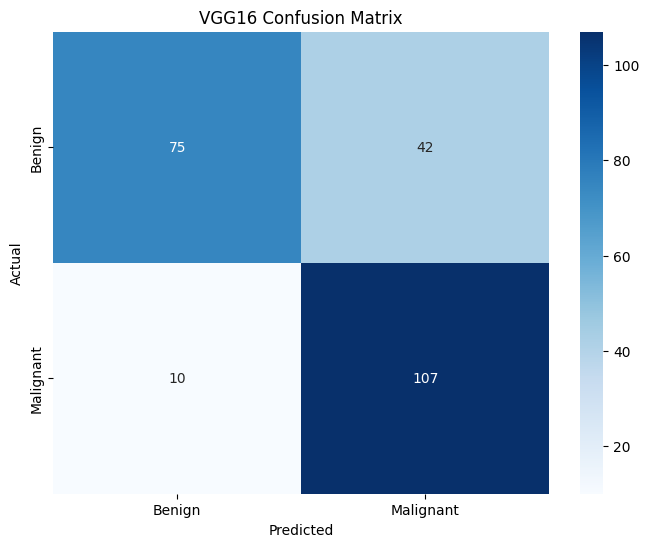


Training VGG19...
Epoch 1/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 75s 2s/step - accuracy: 0.6252 - loss: 7.2625 - val_accuracy: 0.7277 - val_loss: 6.5571 - learning_rate: 1.0000e-04
Epoch 2/50
 1/29 ━━━━━━━━━━━━━━━━━━━━ 15s 569ms/step - accuracy: 0.8125 - loss: 6.5360

/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.8125 - loss: 6.5360 - val_accuracy: 0.5000 - val_loss: 6.9063 - learning_rate: 1.0000e-04
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 64s 2s/step - accuracy: 0.7548 - loss: 6.3083 - val_accuracy: 0.7054 - val_loss: 5.8138 - learning_rate: 1.0000e-04
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6875 - loss: 5.7923 - val_accuracy: 0.6000 - val_loss: 5.9605 - learning_rate: 1.0000e-04
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 67s 2s/step - accuracy: 0.7224 - loss: 5.6145 - val_accuracy: 0.6652 - val_loss: 5.1887 - learning_rate: 1.0000e-04
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7812 - loss: 5.0365 - val_accuracy: 1.0000 - val_loss: 4.8998 - learning_rate: 1.0000e-04
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 64s 2s/step - accuracy: 0.7402 - loss: 4.9972 - val_accuracy: 0.7366 - val_loss: 4.5359 - learning_rate: 1.0000e-04
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8125 - loss: 4.4296 - 

Model saved to /content/drive/MyDrive/VGG19_model.h5


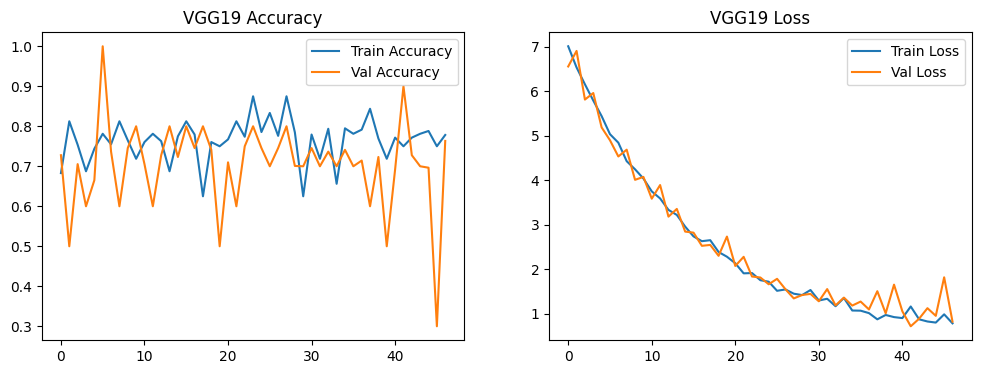

8/8 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step
Classification Report for VGG19:

              precision    recall  f1-score   support

      Benign       0.94      0.50      0.66       117
   Malignant       0.66      0.97      0.78       117

    accuracy                           0.74       234
   macro avg       0.80      0.74      0.72       234
weighted avg       0.80      0.74      0.72       234



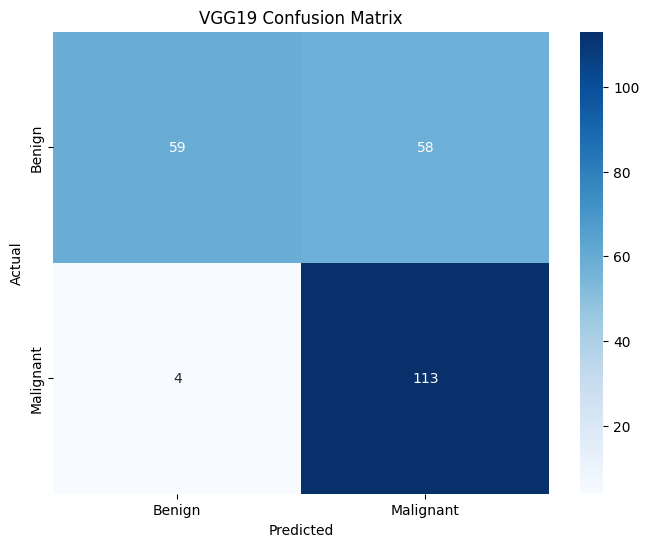


Training ResNet50...
Epoch 1/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 143s 3s/step - accuracy: 0.7541 - loss: 13.8549 - val_accuracy: 0.5223 - val_loss: 13.2233 - learning_rate: 1.0000e-04
Epoch 2/50
 1/29 ━━━━━━━━━━━━━━━━━━━━ 8s 291ms/step - accuracy: 0.8750 - loss: 12.7310

/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.8750 - loss: 12.7310 - val_accuracy: 0.0000e+00 - val_loss: 13.7128 - learning_rate: 1.0000e-04
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 64s 2s/step - accuracy: 0.8709 - loss: 12.4063 - val_accuracy: 0.4598 - val_loss: 12.0210 - learning_rate: 1.0000e-04
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7188 - loss: 11.8327 - val_accuracy: 0.8000 - val_loss: 11.7672 - learning_rate: 1.0000e-04
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 63s 2s/step - accuracy: 0.8571 - loss: 11.2147 - val_accuracy: 0.4777 - val_loss: 10.8264 - learning_rate: 1.0000e-04
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8750 - loss: 10.3529 - val_accuracy: 0.4000 - val_loss: 10.7851 - learning_rate: 1.0000e-04
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 62s 2s/step - accuracy: 0.9206 - loss: 10.0457 - val_accuracy: 0.5223 - val_loss: 10.0988 - learning_rate: 1.0000e-04
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9375 -

Model saved to /content/drive/MyDrive/ResNet50_model.h5


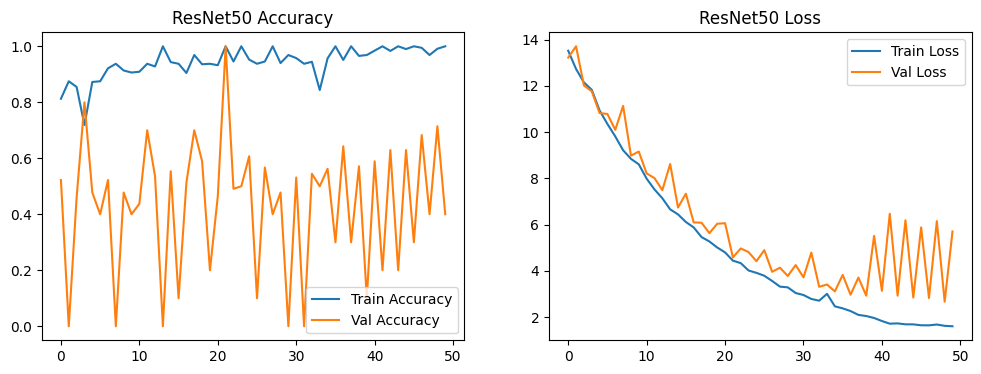

8/8 ━━━━━━━━━━━━━━━━━━━━ 14s 1s/step
Classification Report for ResNet50:

              precision    recall  f1-score   support

      Benign       0.67      0.78      0.72       117
   Malignant       0.74      0.62      0.68       117

    accuracy                           0.70       234
   macro avg       0.71      0.70      0.70       234
weighted avg       0.71      0.70      0.70       234



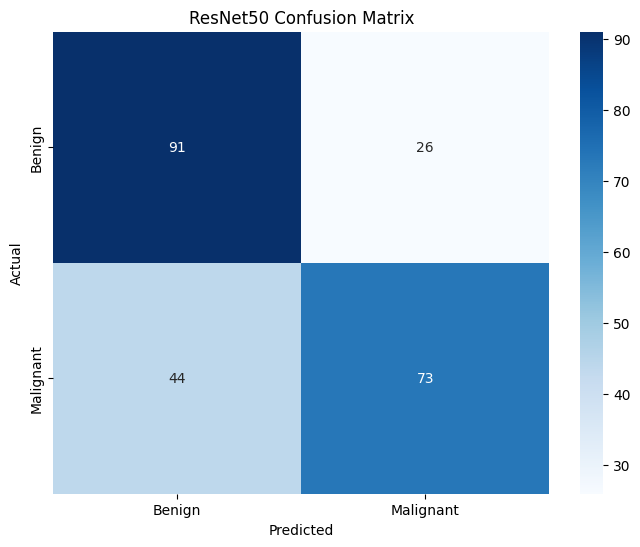


Training DenseNet121...
Epoch 1/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 305s 6s/step - accuracy: 0.7112 - loss: 10.5010 - val_accuracy: 0.7634 - val_loss: 9.7632 - learning_rate: 1.0000e-04
Epoch 2/50
 1/29 ━━━━━━━━━━━━━━━━━━━━ 9s 345ms/step - accuracy: 0.8750 - loss: 9.4995

/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


29/29 ━━━━━━━━━━━━━━━━━━━━ 6s 192ms/step - accuracy: 0.8750 - loss: 9.4995 - val_accuracy: 0.7000 - val_loss: 9.6766 - learning_rate: 1.0000e-04
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 63s 2s/step - accuracy: 0.8744 - loss: 9.2171 - val_accuracy: 0.7188 - val_loss: 8.9450 - learning_rate: 1.0000e-04
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.8438 - loss: 8.5652 - val_accuracy: 0.7000 - val_loss: 8.5073 - learning_rate: 1.0000e-04
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 63s 2s/step - accuracy: 0.8780 - loss: 8.2480 - val_accuracy: 0.7500 - val_loss: 7.9914 - learning_rate: 1.0000e-04
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8125 - loss: 7.8560 - val_accuracy: 0.8000 - val_loss: 8.0786 - learning_rate: 1.0000e-04
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 64s 2s/step - accuracy: 0.8588 - loss: 7.4407 - val_accuracy: 0.6830 - val_loss: 7.3465 - learning_rate: 1.0000e-04
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.8438 - loss: 6.9148 -

Model saved to /content/drive/MyDrive/DenseNet121_model.h5


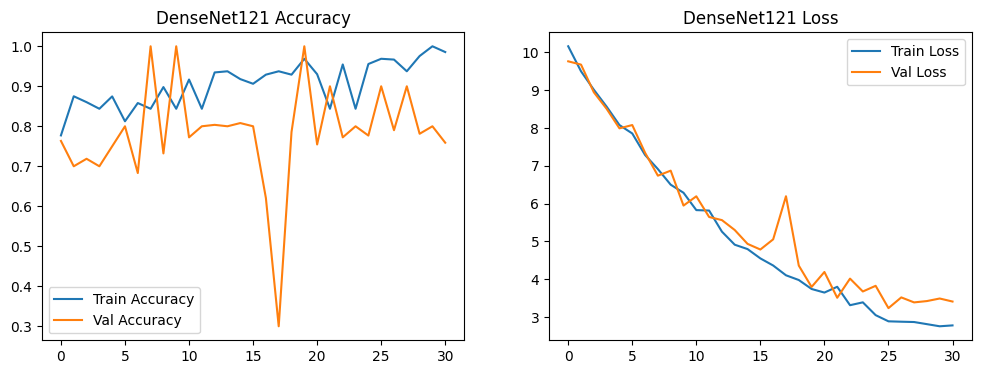

8/8 ━━━━━━━━━━━━━━━━━━━━ 21s 2s/step
Classification Report for DenseNet121:

              precision    recall  f1-score   support

      Benign       0.96      0.59      0.73       117
   Malignant       0.70      0.97      0.82       117

    accuracy                           0.78       234
   macro avg       0.83      0.78      0.77       234
weighted avg       0.83      0.78      0.77       234



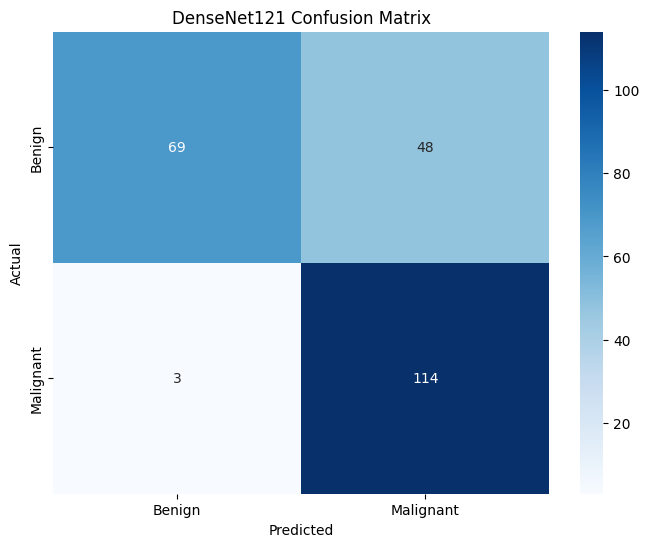

In [27]:
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import LearningRateScheduler
from tensorflow.keras.regularizers import l2
from tensorflow.keras.layers import Dropout

# Define constants
BATCH_SIZE = 32
EPOCHS = 50

def lr_schedule(epoch, lr):
    if epoch < 10:
        return lr
    else:
        return lr * 0.1

lr_scheduler = LearningRateScheduler(lr_schedule)
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=60,
    width_shift_range=0.3,
    height_shift_range=0.3,
    shear_range=0.3,
    zoom_range=0.3,
    horizontal_flip=True,
    fill_mode='nearest'
)
steps_per_epoch = max(1, train_generator.samples // BATCH_SIZE)
validation_steps = max(1, val_generator.samples // BATCH_SIZE)
def unfreeze_layers(model, num_layers_to_unfreeze):
    for layer in model.layers[-num_layers_to_unfreeze:]:
        layer.trainable = True
    return model


def build_model(base_model):
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu', kernel_regularizer=l2(0.01))(x)
    x = Dropout(0.5)(x)
    predictions = Dense(1, activation='sigmoid')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    return model

def train_evaluate_model(base_model, model_name):
    base_model = unfreeze_layers(base_model, 4)  # Adjust as necessary

    model = build_model(base_model)
    model.compile(optimizer=Adam(learning_rate=1e-4), loss='binary_crossentropy', metrics=['accuracy'])

    # Callbacks
    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6, verbose=1)
    early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

    # Train the model
    history = model.fit(
        train_generator,
        steps_per_epoch=steps_per_epoch,
        validation_data=val_generator,
        validation_steps=validation_steps,
        epochs=EPOCHS,
        class_weight=class_weights_dict,
        callbacks=[reduce_lr, early_stopping]
    )

    # Define the path where you want to save the model
    model_save_path = f"/content/drive/MyDrive/{model_name}_model.keras"
    model.save(model_save_path)
    print(f"Model saved to {model_save_path}")

    # Plot accuracy and loss
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Val Accuracy')
    plt.title(f'{model_name} Accuracy')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Val Loss')
    plt.title(f'{model_name} Loss')
    plt.legend()

    plt.show()

    # Predict on validation set
    val_generator.reset()
    y_pred = model.predict(val_generator)
    y_pred = (y_pred > 0.5).astype(int)  # Adjusting threshold

    y_true = val_generator.classes

    # Flatten predictions and true labels for classification report
    y_pred_flat = y_pred.flatten()
    y_true_flat = y_true.flatten()

    print(f"Classification Report for {model_name}:\n")
    print(classification_report(y_true_flat, y_pred_flat, target_names=['Benign', 'Malignant']))

    cm = confusion_matrix(y_true_flat, y_pred_flat)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Benign', 'Malignant'], yticklabels=['Benign', 'Malignant'])
    plt.title(f'{model_name} Confusion Matrix')
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.show()

# Train and evaluate each model with tuning
for model_name, base_model in models.items():
    print(f"\nTraining {model_name}...")
    train_evaluate_model(base_model, model_name)


In [6]:
benigntrain_dir = '/content/extracted_images_split/train/benign'
malignanttrain_dir = '/content/extracted_images_split/train/malignant'

benignval_dir = '/content/extracted_images_split/val/benign'
malignantval_dir = '/content/extracted_images_split/val/malignant'

# Create directories if they don't exist
os.makedirs(benigntrain_dir, exist_ok=True)
os.makedirs(malignanttrain_dir, exist_ok=True)

os.makedirs(benignval_dir, exist_ok=True)
os.makedirs(malignantval_dir, exist_ok=True)

# Separate DataFrame into benign and malignant
benign_df = metadata_clean[metadata_clean['benign_malignant'] == 'benign']
malignant_df = metadata_clean[metadata_clean['benign_malignant'] == 'malignant']

# Balance benign and malignant samples
if len(benign_df) > len(malignant_df):
    benign_df = benign_df.sample(len(malignant_df), random_state=42)

balanced_df = pd.concat([benign_df, malignant_df]).sample(frac=1, random_state=42).reset_index(drop=True)

# Copy balanced images to respective folders
for index, row in balanced_df.iterrows():
    image_name = row['image_name'] + '.jpg'
    benign_malignant = row['benign_malignant']
    source = os.path.join(dest_val_dir, image_name)
    if benign_malignant == 'benign':
        destination = os.path.join(benignval_dir, image_name)
    else:
        destination = os.path.join(malignantval_dir, image_name)
    if os.path.exists(source):
        shutil.copy(source, destination)


In [9]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator


folder_benign_train = '/content/extracted_images_split/train/benign'
folder_malignant_train = '/content/extracted_images_split/train/malignant'
folder_benign_val = '/content/extracted_images_split/val/benign'
folder_malignant_val = '/content/extracted_images_split/val/malignant'


def read(imname, resize_to=None):
    img = Image.open(imname).convert("RGB")
    if resize_to:
        img = img.resize(resize_to, Image.LANCZOS)
    return np.asarray(img)

def load_images_from_folder(folder_path, label, resize_to=None, target_size=None, method='none'):
    images = []
    labels = []
    filenames = os.listdir(folder_path)

    # Oversampling or undersampling based on the method chosen
    if method == 'oversample' and target_size is not None:
        while len(filenames) < target_size:
            filenames.extend(filenames[:target_size - len(filenames)])
        filenames = filenames[:target_size]
    elif method == 'undersample' and target_size is not None:
        filenames = filenames[:min(target_size, len(filenames))]

    for filename in filenames:
        img_path = os.path.join(folder_path, filename)
        images.append(read(img_path, resize_to=resize_to))
        labels.append(label)

    return np.array(images, dtype='uint8'), np.array(labels)

resize_to = (128, 128)

benign_train_size = 5000
malignant_train_size = 5000
benign_val_size = 1000
malignant_val_size = 1000

X_benign_train, y_benign_train = load_images_from_folder(folder_benign_train, 0, resize_to, target_size=malignant_train_size, method='undersample')
X_malignant_train, y_malignant_train = load_images_from_folder(folder_malignant_train, 1, resize_to, target_size=benign_train_size, method='oversample')

X_benign_val, y_benign_val = load_images_from_folder(benignval_dir, 0, resize_to)
X_malignant_val, y_malignant_val = load_images_from_folder(malignantval_dir, 1, resize_to)

X_train = np.concatenate((X_benign_train, X_malignant_train), axis=0)
y_train = np.concatenate((y_benign_train, y_malignant_train), axis=0)

train_shuffle_indices = np.arange(X_train.shape[0])
np.random.shuffle(train_shuffle_indices)
X_train = X_train[train_shuffle_indices]
y_train = y_train[train_shuffle_indices]

X_val = np.concatenate((X_benign_val, X_malignant_val), axis=0)
y_val = np.concatenate((y_benign_val, y_malignant_val), axis=0)

val_shuffle_indices = np.arange(X_val.shape[0])
np.random.shuffle(val_shuffle_indices)
X_val = X_val[val_shuffle_indices]
y_val = y_val[val_shuffle_indices]

print(f"Training data: {X_train.shape[0]} images")
print(f"Validation data: {X_val.shape[0]} images")


KeyboardInterrupt: 

In [ ]:
X_train = X_train / 255.0
X_val = X_val / 255.0

y_train = to_categorical(y_train, num_classes=2)
y_val = to_categorical(y_val, num_classes=2)

print(f"Shape of X_train: {X_train.shape}")
print(f"Shape of X_val: {X_val.shape}")
print(f"Shape of y_train: {y_train.shape}")
print(f"Shape of y_val: {y_val.shape}")

# Visualize samples
num_examples = 10
fig = plt.figure(figsize=(10, 5))

for i in range(num_examples):
    ax = fig.add_subplot(2, 5, i + 1)
    ax.imshow(X_train[i], interpolation='nearest')
    label = np.argmax(y_train[i])
    label_text = 'Benign' if label == 0 else 'Malignant'
    ax.set_title(label_text)
    ax.axis('off')

plt.tight_layout()
plt.show()


In [ ]:
from keras.applications import VGG16
from keras.models import Model
from keras.layers import GlobalAveragePooling2D, Dense, Dropout
from keras.optimizers import Adam

def build_vgg16(input_shape=(128, 128, 3), learning_rate=1e-4):
    # Load the VGG16 model, excluding the top layers
    vgg16 = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)

    # Freeze the convolutional base to retain pre-trained weights
    for layer in vgg16.layers:
        layer.trainable = False

    # Add custom top layers
    x = vgg16.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(512, activation='relu')(x)
    x = Dropout(0.5)(x)
    output = Dense(2, activation='softmax')(x)

    # Create the final model
    model = Model(inputs=vgg16.input, outputs=output)

    # Compile the model
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    return model

# Define the model as vgg16_model
vgg16_model = build_vgg16(learning_rate=1e-4)
vgg16_model.summary()


In [ ]:
# Callbacks
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6, verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True, verbose=1)

# Data augmentation
datagen = ImageDataGenerator(
    horizontal_flip=True,
    vertical_flip=True,
    rotation_range=10,
    zoom_range=0.1,
    shear_range=0.1,
    width_shift_range=0.1,
    height_shift_range=0.1
)

# Training
batch_size = 32
epochs = 50
history = model.fit(
    datagen.flow(X_train, y_train, batch_size=batch_size),
    epochs=epochs,
    validation_data=(X_val, y_val),
    callbacks=[reduce_lr, early_stopping],
    verbose=1
)


In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt



# Step 1: Predict the classes for X_test
y_pred = vgg16_model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)

# Convert y_test to the correct format if necessary
y_true = np.argmax(y_test, axis=1)

# Step 2: Generate Confusion Matrix
cm = confusion_matrix(y_true, y_pred_classes)

# Plot Confusion Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

# Step 3: Generate Classification Report
print("Classification Report:\n")
print(classification_report(y_true, y_pred_classes))


In [ ]:
import os
import shutil
import random

# Directory paths
source_dir = "/content/extracted_images/train"
dest_train_dir = "/content/extracted_images_split/train"
dest_val_dir = "/content/extracted_images_split/val"
dest_test_dir = "/content/extracted_images_split/test"

# Create destination directories if they don't exist
os.makedirs(dest_train_dir, exist_ok=True)
os.makedirs(dest_val_dir, exist_ok=True)
os.makedirs(dest_test_dir, exist_ok=True)

# Shuffle and split data into train, validation, and test
image_files = os.listdir(source_dir)
random.shuffle(image_files)

train_split = int(len(image_files) * 0.7)
val_split = int(len(image_files) * 0.15)

train_files = image_files[:train_split]
val_files = image_files[train_split:train_split + val_split]
test_files = image_files[train_split + val_split:]

# Copy files to respective directories
for file_name in train_files:
    shutil.copy(os.path.join(source_dir, file_name), os.path.join(dest_train_dir, file_name))
for file_name in val_files:
    shutil.copy(os.path.join(source_dir, file_name), os.path.join(dest_val_dir, file_name))
for file_name in test_files:
    shutil.copy(os.path.join(source_dir, file_name), os.path.join(dest_test_dir, file_name))

print(f"Training images copied: {len(train_files)}")
print(f"Validation images copied: {len(val_files)}")
print(f"Testing images copied: {len(test_files)}")


Training images copied: 23188
Validation images copied: 4968
Testing images copied: 4970


In [ ]:
import pandas as pd

# Paths
images_path = '/content/extracted_images_split/train'
benigntrain_dir = '/content/extracted_images_split/train/benign'
malignanttrain_dir = '/content/extracted_images_split/train/malignant'
val_benign_dir = '/content/extracted_images_split/val/benign'
val_malignant_dir = '/content/extracted_images_split/val/malignant'
test_benign_dir = '/content/extracted_images_split/test/benign'
test_malignant_dir = '/content/extracted_images_split/test/malignant'
csv_path = '/content/siim-isic-melanoma/ISIC_2020_Training_GroundTruth_v2.csv'

# Create directories if they don't exist
os.makedirs(benigntrain_dir, exist_ok=True)
os.makedirs(malignanttrain_dir, exist_ok=True)
os.makedirs(val_benign_dir, exist_ok=True)
os.makedirs(val_malignant_dir, exist_ok=True)
os.makedirs(test_benign_dir, exist_ok=True)
os.makedirs(test_malignant_dir, exist_ok=True)

# Load the CSV file
df = pd.read_csv(csv_path)

# Function to organize images by label
def organize_images(df, source_dir, benign_dir, malignant_dir):
    for index, row in df.iterrows():
        image_name = row['image_name'] + '.jpg'
        benign_malignant = row['benign_malignant']
        source = os.path.join(source_dir, image_name)

        if benign_malignant == 'benign':
            destination = os.path.join(benign_dir, image_name)
        elif benign_malignant == 'malignant':
            destination = os.path.join(malignant_dir, image_name)
        else:
            continue

        if os.path.exists(source):
            shutil.copy(source, destination)

# Organize training, validation, and testing images
organize_images(df, images_path, benigntrain_dir, malignanttrain_dir)
organize_images(df, '/content/extracted_images_split/val', val_benign_dir, val_malignant_dir)
organize_images(df, '/content/extracted_images_split/test', test_benign_dir, test_malignant_dir)

print("Images have been organized into 'benign' and 'malignant' folders for training, validation, and testing.")


Images have been organized into 'benign' and 'malignant' folders for training, validation, and testing.


In [ ]:
from keras.utils import to_categorical
import numpy as np
from PIL import Image

folder_benign_train = '/content/extracted_images_split/train/benign'
folder_malignant_train = '/content/extracted_images_split/train/malignant'
folder_benign_val = '/content/extracted_images_split/val/benign'
folder_malignant_val = '/content/extracted_images_split/val/malignant'
folder_benign_test = '/content/extracted_images_split/test/benign'
folder_malignant_test = '/content/extracted_images_split/test/malignant'

def read(imname, resize_to=None):
    img = Image.open(imname).convert("RGB")
    if resize_to:
        img = img.resize(resize_to, Image.LANCZOS)
    return np.asarray(img)

def load_images_from_folder(folder_path, label, resize_to=None):
    images = []
    labels = []
    filenames = os.listdir(folder_path)

    for filename in filenames:
        img_path = os.path.join(folder_path, filename)
        images.append(read(img_path, resize_to=resize_to))
        labels.append(label)

    return np.array(images, dtype='uint8'), np.array(labels)

resize_to = (128, 128)


benign_train_size = 5000
malignant_train_size = 5000
benign_val_size = 1000
malignant_val_size = 1000
benign_test_size = 1000
malignant_test_size = 1000

# Load and preprocess training, validation, and testing datasets
X_benign_train, y_benign_train = load_images_from_folder(folder_benign_train, 0, resize_to)
X_malignant_train, y_malignant_train = load_images_from_folder(folder_malignant_train, 1, resize_to)

X_benign_val, y_benign_val = load_images_from_folder(folder_benign_val, 0, resize_to)
X_malignant_val, y_malignant_val = load_images_from_folder(folder_malignant_val, 1, resize_to)

X_benign_test, y_benign_test = load_images_from_folder(folder_benign_test, 0, resize_to)
X_malignant_test, y_malignant_test = load_images_from_folder(folder_malignant_test, 1, resize_to)

# Combine benign and malignant images into respective datasets
X_train = np.concatenate((X_benign_train, X_malignant_train), axis=0)
y_train = np.concatenate((y_benign_train, y_malignant_train), axis=0)

X_val = np.concatenate((X_benign_val, X_malignant_val), axis=0)
y_val = np.concatenate((y_benign_val, y_malignant_val), axis=0)

X_test = np.concatenate((X_benign_test, X_malignant_test), axis=0)
y_test = np.concatenate((y_benign_test, y_malignant_test), axis=0)

# Shuffle datasets
def shuffle_data(X, y):
    indices = np.arange(X.shape[0])
    np.random.shuffle(indices)
    return X[indices], y[indices]

X_train, y_train = shuffle_data(X_train, y_train)
X_val, y_val = shuffle_data(X_val, y_val)
X_test, y_test = shuffle_data(X_test, y_test)

# Normalize images
X_train = X_train / 255.0
X_val = X_val / 255.0
X_test = X_test / 255.0

# One-hot encode labels
y_train = to_categorical(y_train, num_classes=2)
y_val = to_categorical(y_val, num_classes=2)
y_test = to_categorical(y_test, num_classes=2)

print(f"Shape of X_train: {X_train.shape}")
print(f"Shape of X_val: {X_val.shape}")
print(f"Shape of X_test: {X_test.shape}")
print(f"Shape of y_train: {y_train.shape}")
print(f"Shape of y_val: {y_val.shape}")
print(f"Shape of y_test: {y_test.shape}")


Shape of X_train: (32753, 128, 128, 3)
Shape of X_val: (4968, 128, 128, 3)
Shape of X_test: (15114, 128, 128, 3)
Shape of y_train: (32753, 2)
Shape of y_val: (4968, 2)
Shape of y_test: (15114, 2)


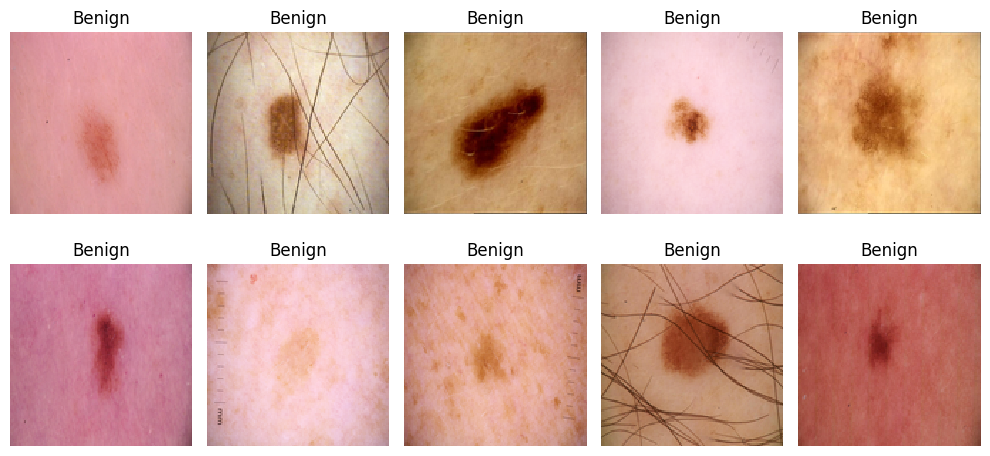

In [ ]:
import matplotlib.pyplot as plt
num_examples = 10
fig = plt.figure(figsize=(10, 5))

for i in range(num_examples):
    ax = fig.add_subplot(2, 5, i + 1)
    ax.imshow(X_train[i], interpolation='nearest')
    label = np.argmax(y_train[i])
    label_text = 'Benign' if label == 0 else 'Malignant'
    ax.set_title(label_text)
    ax.axis('off')

plt.tight_layout()
plt.show()


NameError: name 'models' is not defined

In [ ]:
# Callbacks
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6, verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True, verbose=1)

# Data augmentation
datagen = ImageDataGenerator(
    horizontal_flip=True,
    vertical_flip=True,
    rotation_range=10,
    zoom_range=0.1,
    shear_range=0.1,
    width_shift_range=0.1,
    height_shift_range=0.1
)

# Training
batch_size = 32
epochs = 50
vgg16_history = vgg16_model.fit(
    datagen.flow(X_train, y_train, batch_size=batch_size),
    epochs=epochs,
    validation_data=(X_val, y_val),
    callbacks=[reduce_lr, early_stopping],
    verbose=1
)


Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1024/1024 ━━━━━━━━━━━━━━━━━━━━ 145s 137ms/step - accuracy: 0.9568 - loss: 0.1430 - val_accuracy: 0.9819 - val_loss: 0.0862 - learning_rate: 1.0000e-04
Epoch 2/50
1024/1024 ━━━━━━━━━━━━━━━━━━━━ 127s 124ms/step - accuracy: 0.9827 - loss: 0.0843 - val_accuracy: 0.9819 - val_loss: 0.0842 - learning_rate: 1.0000e-04
Epoch 3/50
1024/1024 ━━━━━━━━━━━━━━━━━━━━ 127s 123ms/step - accuracy: 0.9814 - loss: 0.0853 - val_accuracy: 0.9819 - val_loss: 0.0836 - learning_rate: 1.0000e-04
Epoch 4/50
1024/1024 ━━━━━━━━━━━━━━━━━━━━ 125s 121ms/step - accuracy: 0.9827 - loss: 0.0776 - val_accuracy: 0.9819 - val_loss: 0.0886 - learning_rate: 1.0000e-04
Epoch 5/50
1024/1024 ━━━━━━━━━━━━━━━━━━━━ 124s 121ms/step - accuracy: 0.9827 - loss: 0.0764 - val_accuracy: 0.9819 - val_loss: 0.0839 - learning_rate: 1.0000e-04
Epoch 6/50
1023/1024 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - accuracy: 0.9813 - loss: 0.0805
Epoch 6: ReduceLROnPlateau reducing learning rate to 1.9999999494757503e-05.
1024/1024 ━━━━━━━━━━━━━━━━━━━━ 124

Test loss: 0.07932570576667786
Test accuracy: 0.981540322303772


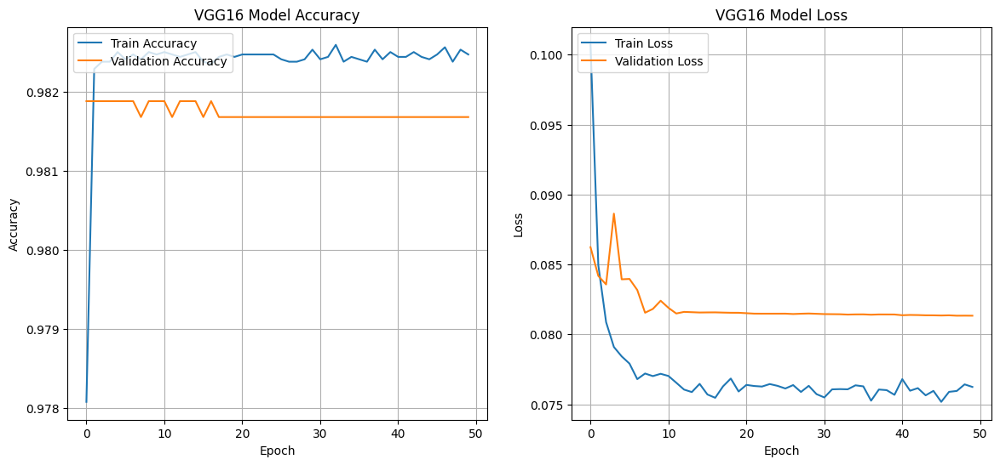

473/473 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step


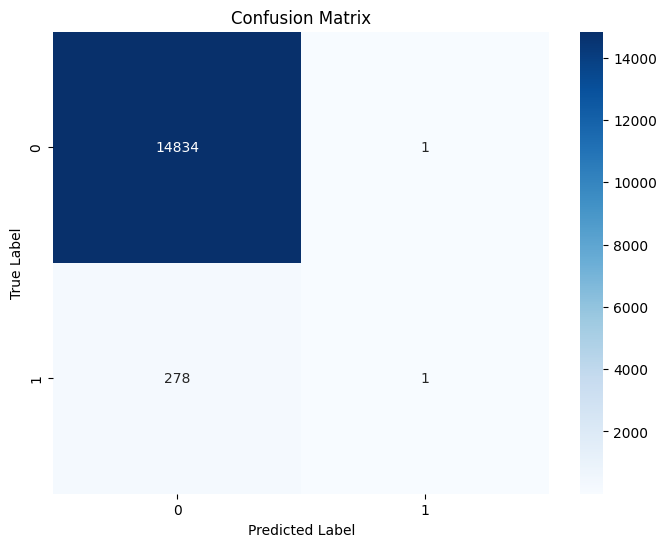

In [ ]:
import matplotlib.pyplot as plt

# Evaluate the model
score = vgg16_model.evaluate(X_test, y_test, verbose=0)
print(f'Test loss: {score[0]}')
print(f'Test accuracy: {score[1]}')

# Save the model
vgg16_model.save("/content/drive/MyDrive/Colab Notebooks/siim_isic_vgg16_model.h5")


def plot_training_history(vgg16_history):
    # Plot training & validation accuracy values
    plt.figure(figsize=(14, 6))

    plt.subplot(1, 2, 1)
    plt.plot(vgg16_history.history['accuracy'], label='Train Accuracy')
    plt.plot(vgg16_history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('VGG16 Model Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend(loc='upper left')
    plt.grid(True)

    # Plot training & validation loss values
    plt.subplot(1, 2, 2)
    plt.plot(vgg16_history.history['loss'], label='Train Loss')
    plt.plot(vgg16_history.history['val_loss'], label='Validation Loss')
    plt.title('VGG16 Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend(loc='upper left')
    plt.grid(True)

    plt.show()

# Call the function to plot the history
plot_training_history(vgg16_history)


# Predict the classes for X_test
y_pred = vgg16_model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)

# Convert y_test to the correct format if necessary
y_true = np.argmax(y_test, axis=1)

# Step 2: Generate Confusion Matrix
cm = confusion_matrix(y_true, y_pred_classes)

# Plot Confusion Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()




In [ ]:
# Step 1: Predict the classes for X_test
y_pred = vgg16_model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)

# Convert y_test to the correct format if necessary
y_true = np.argmax(y_test, axis=1)

# Step 2: Generate Confusion Matrix
cm = confusion_matrix(y_true, y_pred_classes)

# Plot Confusion Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

# Step 3: Generate Classification Report
print("Classification Report:\n")
print(classification_report(y_true, y_pred_classes))


NameError: name 'vgg16_model' is not defined

In [ ]:
from keras.applications import VGG19
from keras.models import Model
from keras.layers import GlobalAveragePooling2D, Dense, Dropout
from keras.optimizers import Adam

def build_vgg19(input_shape=(128, 128, 3), learning_rate=1e-4):
    # Load the VGG19 model, excluding the top layers
    vgg19 = VGG19(weights='imagenet', include_top=False, input_shape=input_shape)

    # Freeze the convolutional base to retain pre-trained weights
    for layer in vgg19.layers:
        layer.trainable = False

    # Add custom top layers
    x = vgg19.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(512, activation='relu')(x)
    x = Dropout(0.5)(x)
    output = Dense(2, activation='softmax')(x)

    # Create the final model
    model = Model(inputs=vgg19.input, outputs=output)

    # Compile the model
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    return model

# Define the model as vgg16_model
vgg19_model = build_vgg19(learning_rate=1e-4)
vgg19_model.summary()


# Callbacks
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6, verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True, verbose=1)

# Data augmentation
datagen = ImageDataGenerator(
    horizontal_flip=True,
    vertical_flip=True,
    rotation_range=10,
    zoom_range=0.1,
    shear_range=0.1,
    width_shift_range=0.1,
    height_shift_range=0.1
)

# Training
batch_size = 32
epochs = 50
vgg19_history = vgg19_model.fit(
    datagen.flow(X_train, y_train, batch_size=batch_size),
    epochs=epochs,
    validation_data=(X_val, y_val),
    callbacks=[reduce_lr, early_stopping],
    verbose=1
)



In [ ]:
import zipfile
import os
import pandas as pd
import matplotlib.pyplot as plt
import cv2

# Define paths
zip_file_path = '/content/drive/MyDrive/Colab Notebooks/ISIC_2020_Training_JPEG.zip'
extracted_images_path = 'extracted_images'

# Extract images from the zip file
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extracted_images_path)

print(f"Images extracted to {extracted_images_path}")

# Load metadata
metadata = pd.read_csv('/content/siim-isic-melanoma/ISIC_2020_Training_GroundTruth_v2.csv')

# Display the first few rows of the metadata
print(metadata.head())


Images extracted to extracted_images
     image_name  patient_id   lesion_id     sex  age_approx  \
0  ISIC_2637011  IP_7279968  IL_7972535    male        45.0   
1  ISIC_0015719  IP_3075186  IL_4649854  female        45.0   
2  ISIC_0052212  IP_2842074  IL_9087444  female        50.0   
3  ISIC_0068279  IP_6890425  IL_4255399  female        45.0   
4  ISIC_0074268  IP_8723313  IL_6898037  female        55.0   

  anatom_site_general_challenge diagnosis benign_malignant  target  
0                     head/neck   unknown           benign       0  
1               upper extremity   unknown           benign       0  
2               lower extremity     nevus           benign       0  
3                     head/neck   unknown           benign       0  
4               upper extremity   unknown           benign       0  


In [ ]:
import os

# Define the path to your directory
directory_path = "/content/extracted_images/train"

# List the first few files and directories in the specified path
head_of_directory = os.listdir(directory_path)[:10]
print("Head of the directory:")
for item in head_of_directory:
    print(item)


Head of the directory:
ISIC_4805048.jpg
ISIC_5563577.jpg
ISIC_3789405.jpg
ISIC_4279689.jpg
ISIC_8416704.jpg
ISIC_4120771.jpg
ISIC_7097665.jpg
ISIC_4766531.jpg
ISIC_2102551.jpg
ISIC_5288559.jpg


In [ ]:
metadata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33126 entries, 0 to 33125
Data columns (total 9 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   image_name                     33126 non-null  object 
 1   patient_id                     33126 non-null  object 
 2   lesion_id                      33126 non-null  object 
 3   sex                            33061 non-null  object 
 4   age_approx                     33058 non-null  float64
 5   anatom_site_general_challenge  32599 non-null  object 
 6   diagnosis                      33126 non-null  object 
 7   benign_malignant               33126 non-null  object 
 8   target                         33126 non-null  int64  
dtypes: float64(1), int64(1), object(7)
memory usage: 2.3+ MB


In [ ]:
metadata.describe()

In [ ]:
metadata['benign_malignant'].value_counts()

,count
benign_malignant,
benign,32542
malignant,584


In [ ]:
metadata['sex'].value_counts()

,count
sex,
male,17080
female,15981


In [ ]:
metadata['anatom_site_general_challenge'].value_counts()

,count
anatom_site_general_challenge,
torso,16845
lower extremity,8417
upper extremity,4983
head/neck,1855
palms/soles,375
oral/genital,124


In [ ]:
metadata['age_approx'].value_counts()

,count
age_approx,
45.0,4466
50.0,4270
55.0,3824
40.0,3576
60.0,3240
35.0,2850
65.0,2527
30.0,2358
70.0,1968


In [ ]:
metadata

,image_name,patient_id,lesion_id,sex,age_approx,anatom_site_general_challenge,diagnosis,benign_malignant,target
0,ISIC_2637011,IP_7279968,IL_7972535,male,45.0,head/neck,unknown,benign,0
1,ISIC_0015719,IP_3075186,IL_4649854,female,45.0,upper extremity,unknown,benign,0
2,ISIC_0052212,IP_2842074,IL_9087444,female,50.0,lower extremity,nevus,benign,0
3,ISIC_0068279,IP_6890425,IL_4255399,female,45.0,head/neck,unknown,benign,0
4,ISIC_0074268,IP_8723313,IL_6898037,female,55.0,upper extremity,unknown,benign,0
...,...,...,...,...,...,...,...,...,...
33121,ISIC_9999134,IP_6526534,IL_2076932,male,50.0,torso,unknown,benign,0
33122,ISIC_9999320,IP_3650745,IL_6891604,male,65.0,torso,unknown,benign,0
33123,ISIC_9999515,IP_2026598,IL_6364820,male,20.0,lower extremity,unknown,benign,0
33124,ISIC_9999666,IP_7702038,IL_6048457,male,50.0,lower extremity,unknown,benign,0


In [ ]:
metadata.isnull().sum()

,0
image_name,0
patient_id,0
lesion_id,0
sex,65
age_approx,68
anatom_site_general_challenge,527
diagnosis,0
benign_malignant,0
target,0


In [ ]:
# Drop rows with missing values in the specified columns
metadata_clean = metadata.dropna(subset=['sex', 'age_approx', 'anatom_site_general_challenge'])

# Display the number of rows before and after dropping
original_count = len(metadata)
cleaned_count = len(metadata_clean)

print(f"Original number of rows: {original_count}")
print(f"Number of rows after removing missing values: {cleaned_count}")

# Display the first few rows of the cleaned metadata
print(metadata_clean.head())


Original number of rows: 33126
Number of rows after removing missing values: 32531
     image_name  patient_id   lesion_id     sex  age_approx  \
0  ISIC_2637011  IP_7279968  IL_7972535    male        45.0   
1  ISIC_0015719  IP_3075186  IL_4649854  female        45.0   
2  ISIC_0052212  IP_2842074  IL_9087444  female        50.0   
3  ISIC_0068279  IP_6890425  IL_4255399  female        45.0   
4  ISIC_0074268  IP_8723313  IL_6898037  female        55.0   

  anatom_site_general_challenge diagnosis benign_malignant  target  
0                     head/neck   unknown           benign       0  
1               upper extremity   unknown           benign       0  
2               lower extremity     nevus           benign       0  
3                     head/neck   unknown           benign       0  
4               upper extremity   unknown           benign       0  


In [ ]:
metadata_clean.isnull().sum()

,0
image_name,0
patient_id,0
lesion_id,0
sex,0
age_approx,0
anatom_site_general_challenge,0
diagnosis,0
benign_malignant,0
target,0


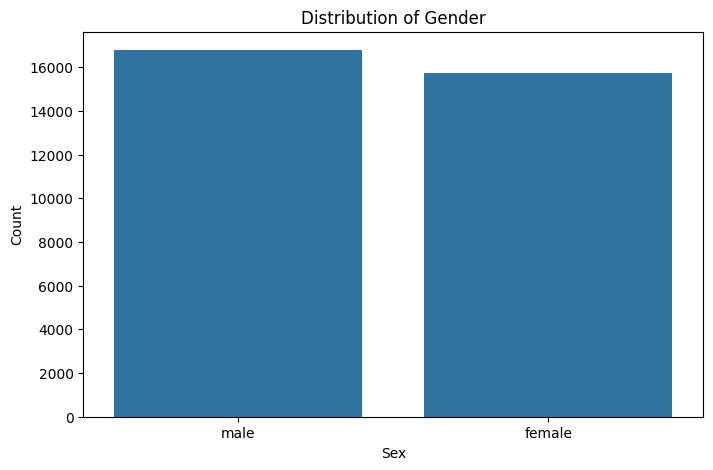

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plot the distribution of gender
plt.figure(figsize=(8, 5))
sns.countplot(data=metadata_clean, x='sex')
plt.title('Distribution of Gender')
plt.xlabel('Sex')
plt.ylabel('Count')
plt.show()


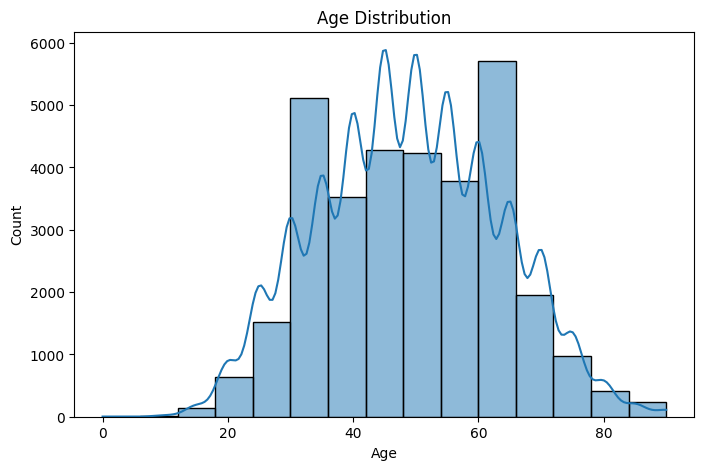

In [ ]:
# Plot the age distribution
plt.figure(figsize=(8, 5))
sns.histplot(metadata_clean['age_approx'], bins=15, kde=True)
plt.title('Age Distribution')
plt.xlabel('Age')
plt.ylabel('Count')
plt.show()


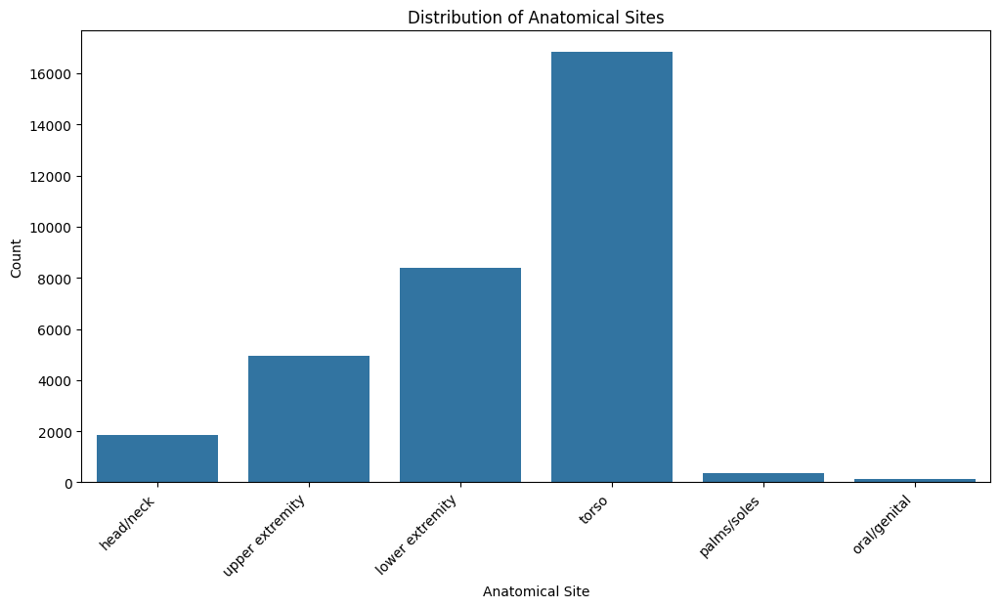

In [ ]:
# Plot the distribution of anatomical sites
plt.figure(figsize=(12, 6))
sns.countplot(data=metadata_clean, x='anatom_site_general_challenge')
plt.xticks(rotation=45, ha='right')
plt.title('Distribution of Anatomical Sites')
plt.xlabel('Anatomical Site')
plt.ylabel('Count')
plt.show()


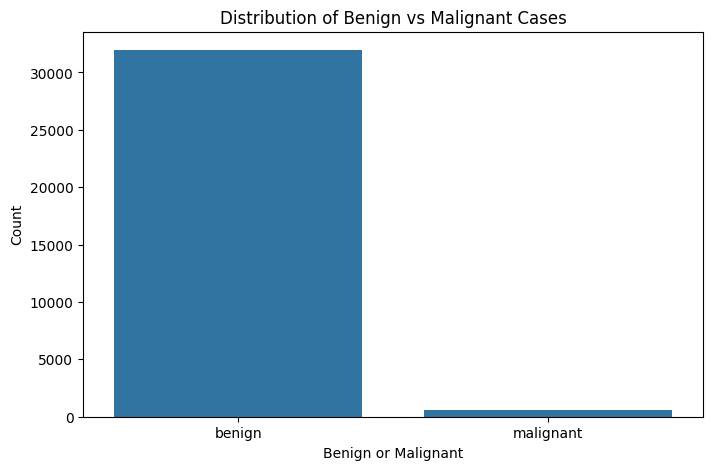

In [ ]:
# Plot the count of benign and malignant cases
plt.figure(figsize=(8, 5))
sns.countplot(data=metadata_clean, x='benign_malignant')
plt.title('Distribution of Benign vs Malignant Cases')
plt.xlabel('Benign or Malignant')
plt.ylabel('Count')
plt.show()


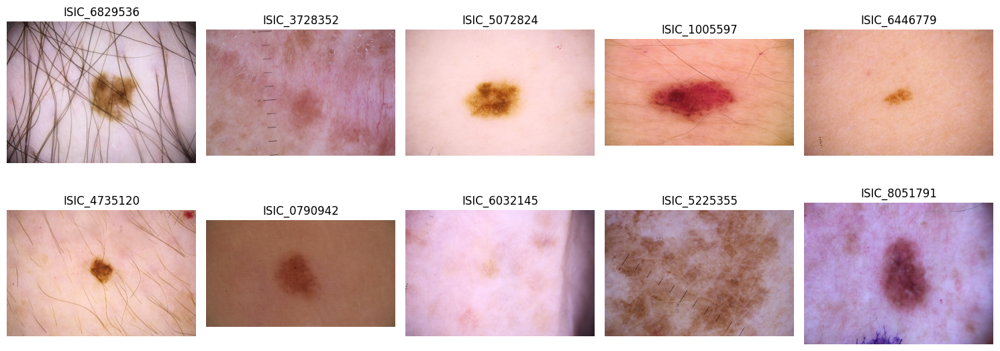

In [ ]:
import cv2
from matplotlib import pyplot as plt

# Define a function to display images
def display_sample_images(image_names, base_path, rows=2, cols=5):
    fig, axes = plt.subplots(rows, cols, figsize=(15, 6))
    axes = axes.flatten()
    for img_name, ax in zip(image_names, axes):
        img_path = os.path.join(base_path, f"{img_name}.jpg")
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        ax.imshow(image)
        ax.axis('off')
        ax.set_title(img_name)
    plt.tight_layout()
    plt.show()

# Display a few sample images
sample_image_names = metadata_clean['image_name'].sample(10).tolist()
display_sample_images(sample_image_names, directory_path)


In [ ]:
import os
import shutil
import random

# Define the source directory and destination directories
source_dir = "/content/extracted_images/train"
dest_train_dir = "/content/extracted_images_split/train"
dest_test_dir = "/content/extracted_images_split/test"

# Create destination directories if they don't exist
os.makedirs(dest_train_dir, exist_ok=True)
os.makedirs(dest_test_dir, exist_ok=True)

# List all files in the source directory
all_files = os.listdir(source_dir)

# Filter only image files if necessary (e.g., based on file extension)
image_files = [file for file in all_files if file.endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif'))]

# Shuffle the list of image files
random.shuffle(image_files)

# Split the list into 80% training and 20% testing
split_index = int(len(image_files) * 0.8)
train_files = image_files[:split_index]
test_files = image_files[split_index:]

# Copy files to the respective directories
for file_name in train_files:
    shutil.copy(os.path.join(source_dir, file_name), os.path.join(dest_train_dir, file_name))

for file_name in test_files:
    shutil.copy(os.path.join(source_dir, file_name), os.path.join(dest_test_dir, file_name))

print(f"Training images copied: {len(train_files)}")
print(f"Testing images copied: {len(test_files)}")


Training images copied: 26500
Testing images copied: 6626


In [ ]:
import os
import shutil
import pandas as pd


images_path = '/content/extracted_images_split/train'
benigntrain_dir = '/content/extracted_images_split/train/benign'
malignanttrain_dir = '/content/extracted_images_split/train/malignant'
csv_path = '/content/siim-isic-melanoma/ISIC_2020_Training_GroundTruth_v2.csv'
# Create directories if they don't exist
os.makedirs(benigntrain_dir, exist_ok=True)
os.makedirs(malignanttrain_dir, exist_ok=True)

# Load the CSV file
df = pd.read_csv(csv_path)

# Iterate through the DataFrame and copy images
for index, row in df.iterrows():
    image_name = row['image_name'] + '.jpg'
    benign_malignant = row['benign_malignant']
    source = os.path.join(images_path, image_name)

    # Debugging output
    print(f"Processing image: {image_name}, Source: {source}")

    if benign_malignant == 'benign':
        destination = os.path.join(benigntrain_dir, image_name)
    elif benign_malignant == 'malignant':
        destination = os.path.join(malignanttrain_dir, image_name)
    else:
        print(f"Unknown label '{benign_malignant}' for image {image_name}. Skipping.")
        continue

    # Copy the image
    if os.path.exists(source):
        shutil.copy(source, destination)
    else:
        print(f"Image {image_name} not found in {images_path}")

print("Images have been separated into 'benign' and 'malignant' folders.")


Streaming output truncated to the last 5000 lines.
Processing image: ISIC_8571168.jpg, Source: /content/extracted_images_split/train/ISIC_8571168.jpg
Processing image: ISIC_8571262.jpg, Source: /content/extracted_images_split/train/ISIC_8571262.jpg
Processing image: ISIC_8572174.jpg, Source: /content/extracted_images_split/train/ISIC_8572174.jpg
Processing image: ISIC_8572337.jpg, Source: /content/extracted_images_split/train/ISIC_8572337.jpg
Processing image: ISIC_8572722.jpg, Source: /content/extracted_images_split/train/ISIC_8572722.jpg
Processing image: ISIC_8572893.jpg, Source: /content/extracted_images_split/train/ISIC_8572893.jpg
Processing image: ISIC_8573647.jpg, Source: /content/extracted_images_split/train/ISIC_8573647.jpg
Processing image: ISIC_8573837.jpg, Source: /content/extracted_images_split/train/ISIC_8573837.jpg
Processing image: ISIC_8574064.jpg, Source: /content/extracted_images_split/train/ISIC_8574064.jpg
Processing image: ISIC_8574269.jpg, Source: /content/extra

In [ ]:
import os
import shutil
import pandas as pd


images_path = '/content/extracted_images_split/test'
benigntest_dir = '/content/extracted_images_split/test/benign'
malignanttest_dir = '/content/extracted_images_split/test/malignant'

# Create directories if they don't exist
os.makedirs(benigntest_dir, exist_ok=True)
os.makedirs(malignanttest_dir, exist_ok=True)

# Load the CSV file
df = pd.read_csv(csv_path)

# Iterate through the DataFrame and copy images
for index, row in df.iterrows():
    image_name = row['image_name'] + '.jpg'
    benign_malignant = row['benign_malignant']
    source = os.path.join(images_path, image_name)


    print(f"Processing image: {image_name}, Source: {source}")

    if benign_malignant == 'benign':
        destination = os.path.join(benigntest_dir, image_name)
    elif benign_malignant == 'malignant':
        destination = os.path.join(malignanttest_dir, image_name)
    else:
        print(f"Unknown label '{benign_malignant}' for image {image_name}. Skipping.")
        continue

    # Copy the image instead of moving it
    if os.path.exists(source):
        shutil.copy(source, destination)
    else:
        print(f"Image {image_name} not found in {images_path}")

print("Images have been separated into 'benign' and 'malignant' folders for the test set.")


Streaming output truncated to the last 5000 lines.
Processing image: ISIC_9088976.jpg, Source: /content/extracted_images_split/test/ISIC_9088976.jpg
Image ISIC_9088976.jpg not found in /content/extracted_images_split/test
Processing image: ISIC_9089031.jpg, Source: /content/extracted_images_split/test/ISIC_9089031.jpg
Processing image: ISIC_9089131.jpg, Source: /content/extracted_images_split/test/ISIC_9089131.jpg
Processing image: ISIC_9089575.jpg, Source: /content/extracted_images_split/test/ISIC_9089575.jpg
Image ISIC_9089575.jpg not found in /content/extracted_images_split/test
Processing image: ISIC_9089757.jpg, Source: /content/extracted_images_split/test/ISIC_9089757.jpg
Image ISIC_9089757.jpg not found in /content/extracted_images_split/test
Processing image: ISIC_9089987.jpg, Source: /content/extracted_images_split/test/ISIC_9089987.jpg
Image ISIC_9089987.jpg not found in /content/extracted_images_split/test
Processing image: ISIC_9089998.jpg, Source: /content/extracted_images

Address the imbalance

The benign images are undersampled to match the number of malignant images.
The malignant images are oversampled to match the number of benign images. This creates a balanced dataset, preventing bias during training.

In [ ]:
import os
import shutil
import pandas as pd
import random

images_path = '/content/extracted_images_split/test'
benigntest_dir = '/content/extracted_images_split/test/benign'
malignanttest_dir = '/content/extracted_images_split/test/malignant'

# Create directories if they don't exist
os.makedirs(benigntest_dir, exist_ok=True)
os.makedirs(malignanttest_dir, exist_ok=True)

# Load the CSV file
df = pd.read_csv(csv_path)

# Separate the DataFrame into benign and malignant
benign_df = df[df['benign_malignant'] == 'benign']
malignant_df = df[df['benign_malignant'] == 'malignant']

# Undersample the benign class to match the number of malignant images
if len(benign_df) > len(malignant_df):
    benign_df = benign_df.sample(len(malignant_df), random_state=42)

# Combine the balanced DataFrame
balanced_df = pd.concat([benign_df, malignant_df])

# Shuffle the DataFrame to mix benign and malignant images
balanced_df = balanced_df.sample(frac=1, random_state=42).reset_index(drop=True)

# Iterate through the DataFrame and copy images
for index, row in balanced_df.iterrows():
    image_name = row['image_name'] + '.jpg'
    benign_malignant = row['benign_malignant']
    source = os.path.join(images_path, image_name)


    print(f"Processing image: {image_name}, Source: {source}")

    if benign_malignant == 'benign':
        destination = os.path.join(benigntest_dir, image_name)
    elif benign_malignant == 'malignant':
        destination = os.path.join(malignanttest_dir, image_name)
    else:
        print(f"Unknown label '{benign_malignant}' for image {image_name}. Skipping.")
        continue

    # Copy the image instead of moving it
    if os.path.exists(source):
        shutil.copy(source, destination)
    else:
        print(f"Image {image_name} not found in {images_path}")

print("Balanced dataset created with undersampling. Images have been separated into 'benign' and 'malignant' folders for the test set.")


Processing image: ISIC_2153401.jpg, Source: /content/extracted_images_split/test/ISIC_2153401.jpg
Processing image: ISIC_9000824.jpg, Source: /content/extracted_images_split/test/ISIC_9000824.jpg
Image ISIC_9000824.jpg not found in /content/extracted_images_split/test
Processing image: ISIC_6527570.jpg, Source: /content/extracted_images_split/test/ISIC_6527570.jpg
Processing image: ISIC_4577414.jpg, Source: /content/extracted_images_split/test/ISIC_4577414.jpg
Processing image: ISIC_7724762.jpg, Source: /content/extracted_images_split/test/ISIC_7724762.jpg
Image ISIC_7724762.jpg not found in /content/extracted_images_split/test
Processing image: ISIC_1197692.jpg, Source: /content/extracted_images_split/test/ISIC_1197692.jpg
Image ISIC_1197692.jpg not found in /content/extracted_images_split/test
Processing image: ISIC_1210011.jpg, Source: /content/extracted_images_split/test/ISIC_1210011.jpg
Processing image: ISIC_8557624.jpg, Source: /content/extracted_images_split/test/ISIC_8557624.j

In [ ]:
import os
import shutil
import random
import pandas as pd
import numpy as np
import cv2
from PIL import Image
from matplotlib import pyplot as plt
import seaborn as sns
from keras.utils import to_categorical
from keras.models import Sequential
from keras.layers import Conv2D, MaxPool2D, Dropout, Flatten, Dense
from keras.optimizers import Adam, RMSprop
from keras.callbacks import ReduceLROnPlateau, EarlyStopping
from tensorflow.keras.preprocessing.image import ImageDataGenerator


In [ ]:
import os
import numpy as np
from PIL import Image

# Define the folder paths
folder_benign_train = '/content/extracted_images_split/train/benign'
folder_malignant_train = '/content/extracted_images_split/train/malignant'
folder_benign_test = '/content/extracted_images_split/test/benign'
folder_malignant_test = '/content/extracted_images_split/test/malignant'



# Function to read and convert images to RGB arrays, with optional resizing
def read(imname, resize_to=None):
    img = Image.open(imname).convert("RGB")
    if resize_to:
        img = img.resize(resize_to, Image.ANTIALIAS)
    return np.asarray(img)

# Function to load images and labels from a given directory with optional balancing
def load_images_from_folder(folder_path, label, resize_to=None, target_size=None, method='none'):
    images = []
    labels = []
    filenames = os.listdir(folder_path)

    # Oversampling or undersampling based on the method chosen
    if method == 'oversample' and target_size is not None:
        while len(filenames) < target_size:
            filenames.extend(filenames[:target_size - len(filenames)])
        filenames = filenames[:target_size]
    elif method == 'undersample' and target_size is not None:
        filenames = filenames[:min(target_size, len(filenames))]

    for filename in filenames:
        img_path = os.path.join(folder_path, filename)
        images.append(read(img_path, resize_to=resize_to))
        labels.append(label)

    return np.array(images, dtype='uint8'), np.array(labels)

resize_to = (128, 128)

# Load benign and malignant training images with balancing
benign_train_size = 1000  # Example size, adjust based on your dataset
malignant_train_size = 1000  # Example size, adjust based on your dataset

X_benign_train, y_benign_train = load_images_from_folder(folder_benign_train, 0, resize_to, target_size=malignant_train_size, method='undersample')
X_malignant_train, y_malignant_train = load_images_from_folder(folder_malignant_train, 1, resize_to, target_size=benign_train_size, method='oversample')

# Load benign and malignant testing images without balancing
X_benign_test, y_benign_test = load_images_from_folder(folder_benign_test, 0, resize_to)
X_malignant_test, y_malignant_test = load_images_from_folder(folder_malignant_test, 1, resize_to)

# Merge and shuffle training data
X_train = np.concatenate((X_benign_train, X_malignant_train), axis=0)
y_train = np.concatenate((y_benign_train, y_malignant_train), axis=0)

train_shuffle_indices = np.arange(X_train.shape[0])
np.random.shuffle(train_shuffle_indices)
X_train = X_train[train_shuffle_indices]
y_train = y_train[train_shuffle_indices]

# Merge and shuffle testing data
X_test = np.concatenate((X_benign_test, X_malignant_test), axis=0)
y_test = np.concatenate((y_benign_test, y_malignant_test), axis=0)

test_shuffle_indices = np.arange(X_test.shape[0])
np.random.shuffle(test_shuffle_indices)
X_test = X_test[test_shuffle_indices]
y_test = y_test[test_shuffle_indices]

print(f"Training data: {X_train.shape[0]} images")
print(f"Testing data: {X_test.shape[0]} images")


<ipython-input-26-3512c1ccc781>:20: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize(resize_to, Image.ANTIALIAS)


Training data: 2000 images
Testing data: 11882 images


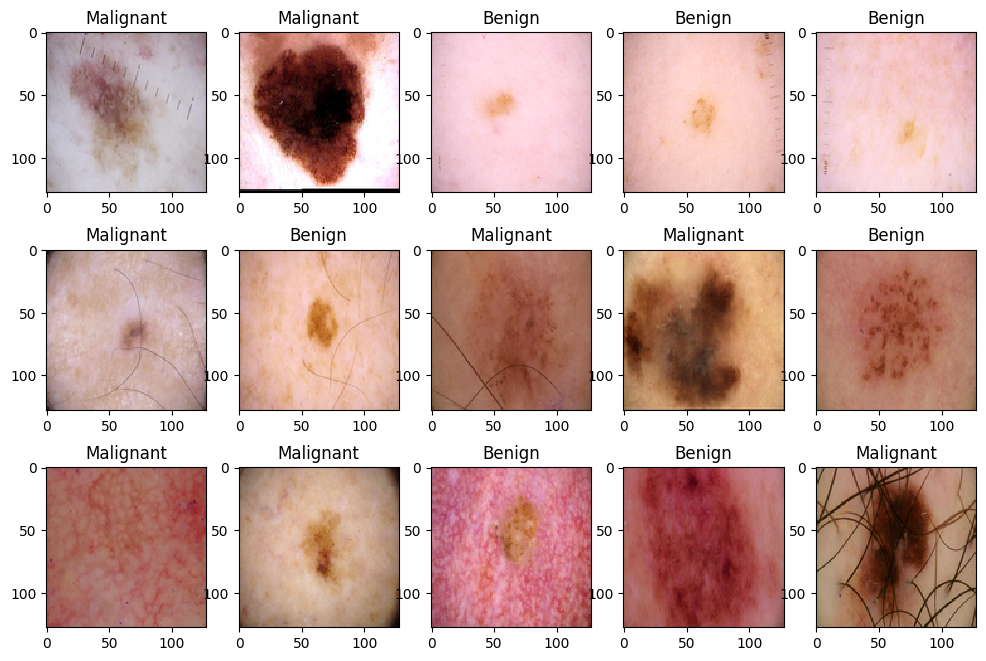

In [ ]:
w=40
h=30
fig=plt.figure(figsize=(12, 8))
columns = 5
rows = 3

for i in range(1, columns*rows +1):
    ax = fig.add_subplot(rows, columns, i)
    if y_train[i] == 0:
        ax.title.set_text('Benign')
    else:
        ax.title.set_text('Malignant')
    plt.imshow(X_train[i], interpolation='nearest')
plt.show()

Shape of y_train after one-hot encoding: (2000, 2)
Shape of y_test after one-hot encoding: (11882, 2)


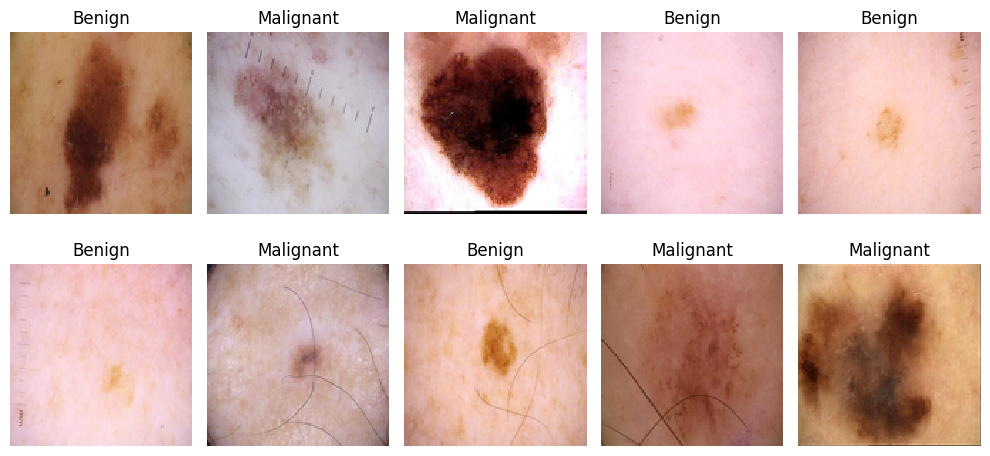

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from keras.utils import to_categorical


# Convert labels to one-hot encoded format
y_train = to_categorical(y_train, num_classes=2)
y_test = to_categorical(y_test, num_classes=2)

# Print shapes to verify
print(f"Shape of y_train after one-hot encoding: {y_train.shape}")
print(f"Shape of y_test after one-hot encoding: {y_test.shape}")

# Visualize a few examples with their one-hot encoded labels
num_examples = 10
fig = plt.figure(figsize=(10, 5))

for i in range(num_examples):
    ax = fig.add_subplot(2, 5, i + 1)  # 2 rows, 5 columns grid
    ax.imshow(X_train[i], interpolation='nearest')
    # Convert one-hot encoded label to human-readable label
    label = np.argmax(y_train[i])
    label_text = 'Benign' if label == 0 else 'Malignant'
    ax.set_title(label_text)
    ax.axis('off')  # Hide axis

plt.tight_layout()
plt.show()


Shape of X_train after normalization: (2000, 128, 128, 3)
Shape of X_test after normalization: (11882, 128, 128, 3)
Shape of y_train after one-hot encoding: (2000, 2, 2)
Shape of y_test after one-hot encoding: (11882, 2, 2)


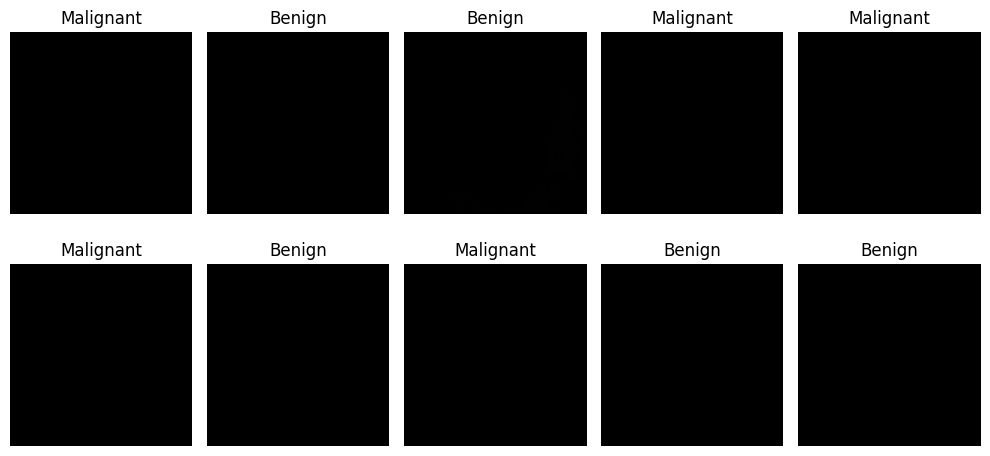

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from keras.utils import to_categorical

# Normalize the image data
X_train = X_train / 255.0
X_test = X_test / 255.0

# Convert labels to one-hot encoded format
y_train = to_categorical(y_train, num_classes=2)
y_test = to_categorical(y_test, num_classes=2)

# Print shapes to verify
print(f"Shape of X_train after normalization: {X_train.shape}")
print(f"Shape of X_test after normalization: {X_test.shape}")
print(f"Shape of y_train after one-hot encoding: {y_train.shape}")
print(f"Shape of y_test after one-hot encoding: {y_test.shape}")

#Visualize a few examples with their one-hot encoded labels
num_examples = 10
fig = plt.figure(figsize=(10, 5))

for i in range(num_examples):
    ax = fig.add_subplot(2, 5, i + 1)
    ax.imshow(X_train[i], interpolation='nearest')
    # Convert one-hot encoded label to human-readable label
    label = np.argmax(y_train[i])
    label_text = 'Benign' if label == 0 else 'Malignant'
    ax.set_title(label_text)
    ax.axis('off')  # Hide axis

plt.tight_layout()
plt.show()


In [ ]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPool2D, Dropout, Flatten, Dense
from keras.optimizers import Adam, RMSprop
from keras.callbacks import ReduceLROnPlateau, EarlyStopping

def build(input_shape=(224, 224, 3), lr=1e-3, num_classes=2,
          init='normal', activ='relu', optim='adam'):
    model = Sequential()
    model.add(Conv2D(64, kernel_size=(3, 3), padding='Same', input_shape=input_shape,
                     activation=activ, kernel_initializer='glorot_uniform'))
    model.add(MaxPool2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))

    model.add(Conv2D(64, kernel_size=(3, 3), padding='Same',
                     activation=activ, kernel_initializer='glorot_uniform'))
    model.add(MaxPool2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))

    model.add(Flatten())
    model.add(Dense(128, activation='relu', kernel_initializer=init))
    model.add(Dense(num_classes, activation='softmax'))
    model.summary()

    # Set the optimizer
    if optim == 'rmsprop':
        optimizer = RMSprop(learning_rate=lr)
    else:
        optimizer = Adam(learning_rate=lr)

    # Compile the model
    model.compile(optimizer=optimizer, loss="categorical_crossentropy", metrics=["accuracy"])
    return model

# Learning rate annealing
learning_rate_reduction = ReduceLROnPlateau(monitor='val_accuracy',
                                            patience=5,
                                            verbose=1,
                                            factor=0.5,
                                            min_lr=1e-7)

# Early stopping to stop training when the model stops improving
early_stopping = EarlyStopping(monitor='val_accuracy',
                               patience=10,  # Number of epochs with no improvement after which training will be stopped
                               verbose=1,
                               restore_best_weights=True)  # Restore model weights from the epoch with the best value of the monitored quantity


In [ ]:
new

In [17]:
# Define a function to build a model
def build_model(base_model):
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    predictions = Dense(1, activation='sigmoid')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    return model





Training VGG16...
Epoch 1/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 88s 2s/step - accuracy: 0.4787 - loss: 7.2880 - val_accuracy: 0.4777 - val_loss: 6.6182 - learning_rate: 1.0000e-04
Epoch 2/100
 1/29 ━━━━━━━━━━━━━━━━━━━━ 12s 440ms/step - accuracy: 0.5000 - loss: 6.6188

/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


29/29 ━━━━━━━━━━━━━━━━━━━━ 7s 220ms/step - accuracy: 0.5000 - loss: 6.6188 - val_accuracy: 1.0000 - val_loss: 6.5867 - learning_rate: 1.0000e-04
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 63s 2s/step - accuracy: 0.5076 - loss: 6.3864 - val_accuracy: 0.4777 - val_loss: 5.8003 - learning_rate: 1.0000e-04
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4375 - loss: 5.8008 - val_accuracy: 1.0000 - val_loss: 5.7741 - learning_rate: 1.0000e-04
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 65s 2s/step - accuracy: 0.5009 - loss: 5.5940 - val_accuracy: 0.5223 - val_loss: 5.0883 - learning_rate: 1.0000e-04
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4688 - loss: 5.0893 - val_accuracy: 0.0000e+00 - val_loss: 5.0702 - learning_rate: 1.0000e-04
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 63s 2s/step - accuracy: 0.4649 - loss: 4.9142 - val_accuracy: 0.5223 - val_loss: 4.4690 - learning_rate: 1.0000e-04
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.6562 - loss

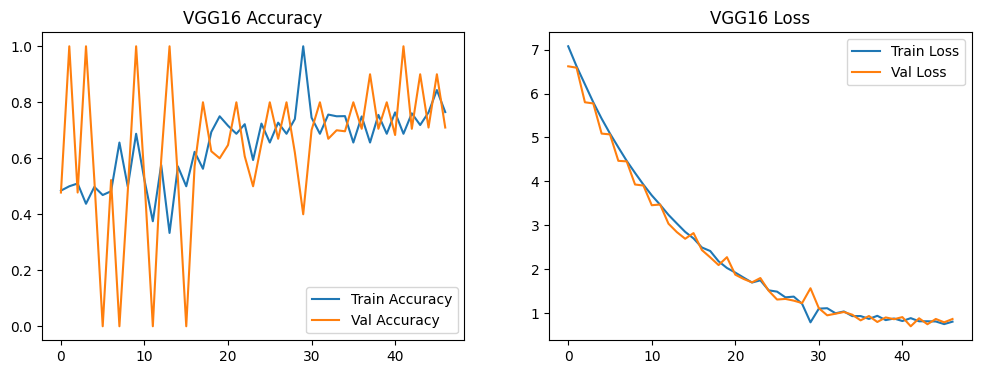

8/8 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step
Classification Report for VGG16:

              precision    recall  f1-score   support

      Benign       0.93      0.43      0.58       117
   Malignant       0.63      0.97      0.76       117

    accuracy                           0.70       234
   macro avg       0.78      0.70      0.67       234
weighted avg       0.78      0.70      0.67       234



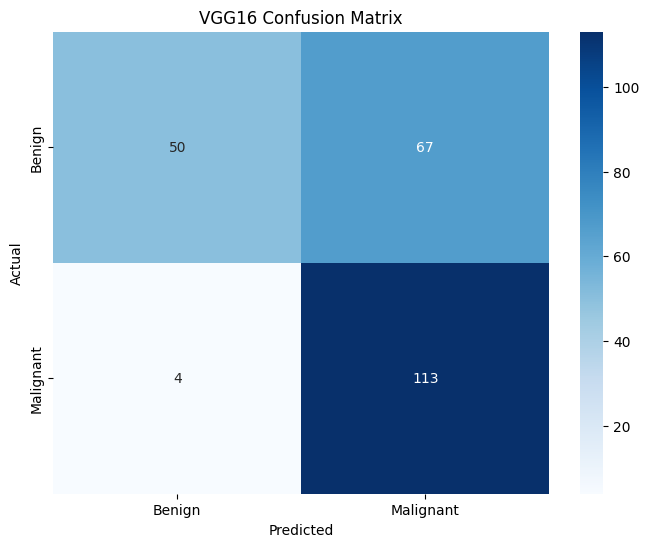


Training VGG19...
Epoch 1/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 79s 2s/step - accuracy: 0.4864 - loss: 7.3325 - val_accuracy: 0.5223 - val_loss: 6.6641 - learning_rate: 1.0000e-04
Epoch 2/100
 1/29 ━━━━━━━━━━━━━━━━━━━━ 15s 549ms/step - accuracy: 0.5938 - loss: 6.6194

/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5938 - loss: 6.6194 - val_accuracy: 0.0000e+00 - val_loss: 6.7082 - learning_rate: 1.0000e-04
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 65s 2s/step - accuracy: 0.5031 - loss: 6.4472 - val_accuracy: 0.6741 - val_loss: 5.8027 - learning_rate: 1.0000e-04
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.6250 - loss: 5.7722 - val_accuracy: 0.9000 - val_loss: 5.5491 - learning_rate: 1.0000e-04
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 63s 2s/step - accuracy: 0.6575 - loss: 5.6479 - val_accuracy: 0.5982 - val_loss: 5.1860 - learning_rate: 1.0000e-04
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.6562 - loss: 5.1305 - val_accuracy: 1.0000 - val_loss: 4.9096 - learning_rate: 1.0000e-04
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 61s 2s/step - accuracy: 0.7134 - loss: 4.9036 - val_accuracy: 0.6607 - val_loss: 4.4986 - learning_rate: 1.0000e-04
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7188 - loss:

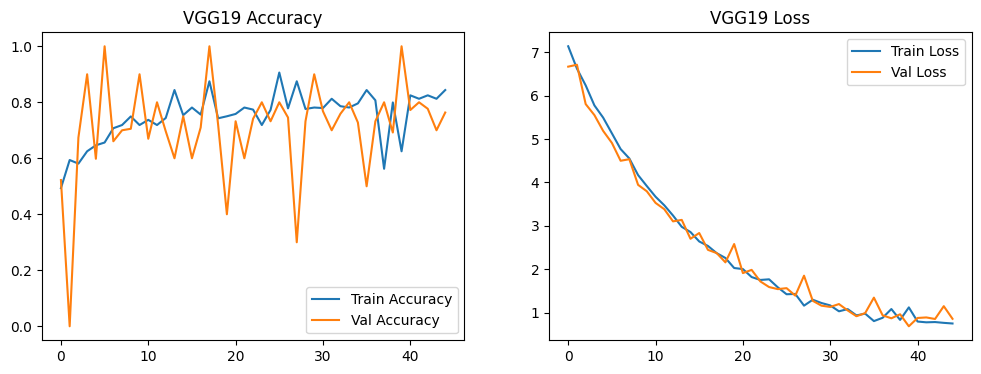

8/8 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step
Classification Report for VGG19:

              precision    recall  f1-score   support

      Benign       0.90      0.48      0.63       117
   Malignant       0.65      0.95      0.77       117

    accuracy                           0.71       234
   macro avg       0.77      0.71      0.70       234
weighted avg       0.77      0.71      0.70       234



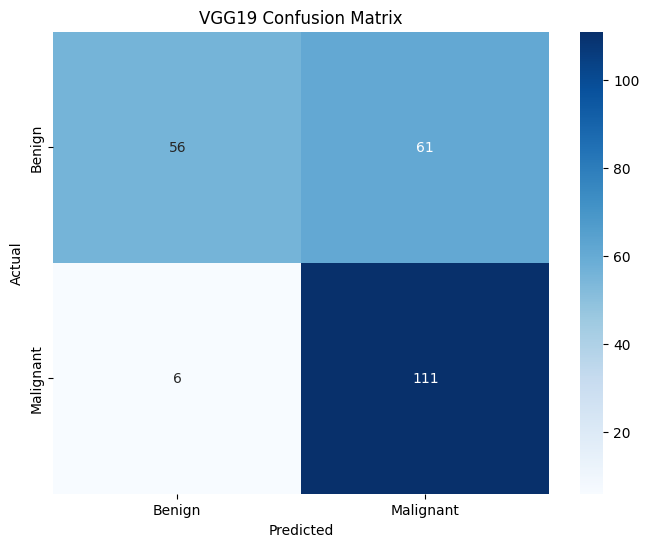


Training ResNet50...
Epoch 1/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 163s 3s/step - accuracy: 0.6653 - loss: 14.1225 - val_accuracy: 0.5223 - val_loss: 13.5487 - learning_rate: 1.0000e-04
Epoch 2/100
 1/29 ━━━━━━━━━━━━━━━━━━━━ 8s 303ms/step - accuracy: 0.7812 - loss: 13.1418

/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 105ms/step - accuracy: 0.7812 - loss: 13.1418 - val_accuracy: 0.0000e+00 - val_loss: 14.1936 - learning_rate: 1.0000e-04
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 62s 2s/step - accuracy: 0.8638 - loss: 12.7461 - val_accuracy: 0.5223 - val_loss: 12.3938 - learning_rate: 1.0000e-04
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9062 - loss: 11.9145 - val_accuracy: 0.0000e+00 - val_loss: 12.4734 - learning_rate: 1.0000e-04
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 61s 2s/step - accuracy: 0.9532 - loss: 11.5448 - val_accuracy: 0.5223 - val_loss: 11.4227 - learning_rate: 1.0000e-04
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9375 - loss: 10.8649 - val_accuracy: 0.0000e+00 - val_loss: 11.5096 - learning_rate: 1.0000e-04
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 65s 2s/step - accuracy: 0.9854 - loss: 10.4738 - val_accuracy: 0.4777 - val_loss: 11.1928 - learning_rate: 1.0000e-04
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - acc

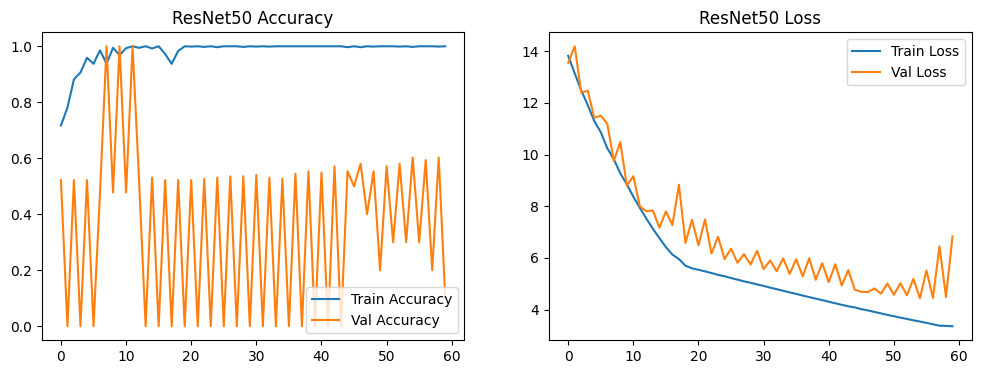

8/8 ━━━━━━━━━━━━━━━━━━━━ 15s 1s/step
Classification Report for ResNet50:

              precision    recall  f1-score   support

      Benign       0.59      0.62      0.60       117
   Malignant       0.59      0.56      0.58       117

    accuracy                           0.59       234
   macro avg       0.59      0.59      0.59       234
weighted avg       0.59      0.59      0.59       234



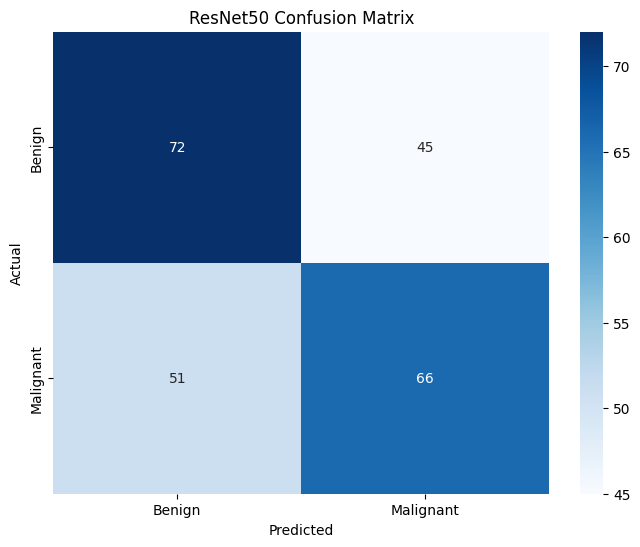


Training DenseNet121...
Epoch 1/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 337s 6s/step - accuracy: 0.6547 - loss: 10.5658 - val_accuracy: 0.5402 - val_loss: 10.0333 - learning_rate: 1.0000e-04
Epoch 2/100
 1/29 ━━━━━━━━━━━━━━━━━━━━ 9s 329ms/step - accuracy: 0.8125 - loss: 9.6491

/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


29/29 ━━━━━━━━━━━━━━━━━━━━ 9s 298ms/step - accuracy: 0.8125 - loss: 9.6491 - val_accuracy: 0.0000e+00 - val_loss: 10.9313 - learning_rate: 1.0000e-04
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 65s 2s/step - accuracy: 0.8541 - loss: 9.2604 - val_accuracy: 0.6161 - val_loss: 8.8597 - learning_rate: 1.0000e-04
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7812 - loss: 8.8288 - val_accuracy: 0.5000 - val_loss: 9.5133 - learning_rate: 1.0000e-04
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 64s 2s/step - accuracy: 0.9226 - loss: 8.1715 - val_accuracy: 0.6116 - val_loss: 8.0286 - learning_rate: 1.0000e-04
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8750 - loss: 7.5615 - val_accuracy: 0.5000 - val_loss: 9.1524 - learning_rate: 1.0000e-04
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 60s 2s/step - accuracy: 0.9626 - loss: 7.2411 - val_accuracy: 0.6964 - val_loss: 7.2679 - learning_rate: 1.0000e-04
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 1.0000 - los

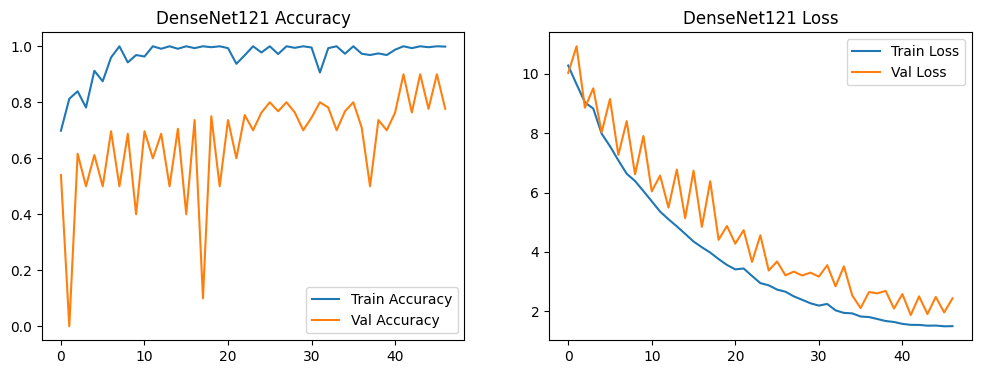

8/8 ━━━━━━━━━━━━━━━━━━━━ 28s 2s/step
Classification Report for DenseNet121:

              precision    recall  f1-score   support

      Benign       0.86      0.64      0.74       117
   Malignant       0.71      0.90      0.80       117

    accuracy                           0.77       234
   macro avg       0.79      0.77      0.77       234
weighted avg       0.79      0.77      0.77       234



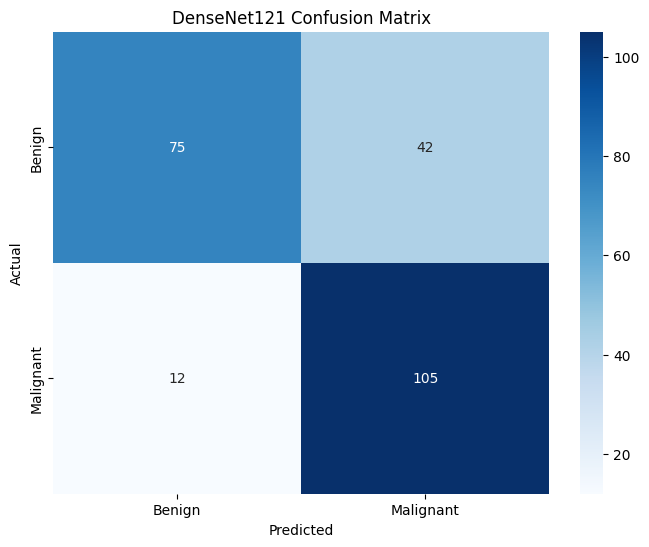

In [18]:
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import LearningRateScheduler
from tensorflow.keras.regularizers import l2
from tensorflow.keras.layers import Dropout

# Define constants
BATCH_SIZE = 32
EPOCHS = 100

def lr_schedule(epoch, lr):
    if epoch < 10:
        return lr
    else:
        return lr * 0.1

lr_scheduler = LearningRateScheduler(lr_schedule)
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=60,
    width_shift_range=0.3,
    height_shift_range=0.3,
    shear_range=0.3,
    zoom_range=0.3,
    horizontal_flip=True,
    fill_mode='nearest'
)
steps_per_epoch = max(1, train_generator.samples // BATCH_SIZE)
validation_steps = max(1, val_generator.samples // BATCH_SIZE)
def unfreeze_layers(model, num_layers_to_unfreeze):
    for layer in model.layers[-num_layers_to_unfreeze:]:
        layer.trainable = True
    return model


def build_model(base_model):
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu', kernel_regularizer=l2(0.01))(x)
    x = Dropout(0.5)(x)
    predictions = Dense(1, activation='sigmoid')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    return model

def train_evaluate_model(base_model, model_name):
    base_model = unfreeze_layers(base_model, 4)  # Adjust as necessary

    model = build_model(base_model)
    model.compile(optimizer=Adam(learning_rate=1e-4), loss='binary_crossentropy', metrics=['accuracy'])

    # Callbacks
    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6, verbose=1)
    early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

    # Train the model
    history = model.fit(
        train_generator,
        steps_per_epoch=steps_per_epoch,
        validation_data=val_generator,
        validation_steps=validation_steps,
        epochs=EPOCHS,
        class_weight=class_weights_dict,
        callbacks=[reduce_lr, early_stopping]
    )

    # Define the path where you want to save the model
    model_save_path = f"/content/drive/MyDrive/{model_name}_model.keras"
    model.save(model_save_path)
    print(f"Model saved to {model_save_path}")

    # Plot accuracy and loss
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Val Accuracy')
    plt.title(f'{model_name} Accuracy')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Val Loss')
    plt.title(f'{model_name} Loss')
    plt.legend()

    plt.show()

    # Predict on validation set
    val_generator.reset()
    y_pred = model.predict(val_generator)
    y_pred = (y_pred > 0.5).astype(int)  # Adjusting threshold

    y_true = val_generator.classes

    # Flatten predictions and true labels for classification report
    y_pred_flat = y_pred.flatten()
    y_true_flat = y_true.flatten()

    print(f"Classification Report for {model_name}:\n")
    print(classification_report(y_true_flat, y_pred_flat, target_names=['Benign', 'Malignant']))

    cm = confusion_matrix(y_true_flat, y_pred_flat)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Benign', 'Malignant'], yticklabels=['Benign', 'Malignant'])
    plt.title(f'{model_name} Confusion Matrix')
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.show()

# Train and evaluate each model with tuning
for model_name, base_model in models.items():
    print(f"\nTraining {model_name}...")
    train_evaluate_model(base_model, model_name)


In [ ]:
!pip install keras

In [ ]:
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.applications import VGG16
from keras.models import Model
from keras.layers import Dense, Flatten, Dropout
from keras.optimizers import Adam
from keras.callbacks import ReduceLROnPlateau

# Directories for training and test data
dest_train_dir = "/content/extracted_images_split/train"
dest_test_dir = "/content/extracted_images_split/test"

# Define image size and batch size
image_size = (224, 224)
batch_size = 32

# Create ImageDataGenerators for training and validation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2,  # 20% of training data used for validation
    rotation_range=20,  # Add data augmentation options
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

test_datagen = ImageDataGenerator(rescale=1./255)

# Load training and validation data
train_generator = train_datagen.flow_from_directory(
    dest_train_dir,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='training'
)

validation_generator = train_datagen.flow_from_directory(
    dest_train_dir,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation'
)

# Load test data
test_generator = test_datagen.flow_from_directory(
    dest_test_dir,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical'
)

Found 25406 images belonging to 2 classes.
Found 6350 images belonging to 2 classes.
Found 11882 images belonging to 2 classes.


In [ ]:
def build_vgg16_model(input_shape=(224, 224, 3), num_classes=2, lr=1e-3):
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)

    # Freeze the layers of VGG16
    for layer in base_model.layers:
        layer.trainable = False

    x = base_model.output
    x = Flatten()(x)
    x = Dense(128, activation='relu')(x)
    x = Dropout(0.5)(x)  # Dropout layer to prevent overfitting
    predictions = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs=base_model.input, outputs=predictions)

    model.compile(optimizer=Adam(learning_rate=lr),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

    model.summary()

    return model

# Learning rate annealing
learning_rate_reduction = ReduceLROnPlateau(monitor='val_accuracy',
                                            patience=5,
                                            verbose=1,
                                            factor=0.5,
                                            min_lr=1e-7)

# Build and train the model
vgg16_model = build_vgg16_model(input_shape=(224, 224, 3), num_classes=2, lr=1e-3)

# Train the VGG16 model and save its history
vgg16_history = vgg16_model.fit(
    train_generator,
    epochs=3,  # Number of epochs
    validation_data=validation_generator,
    callbacks=[learning_rate_reduction]
)

vgg16_model.save('vgg16_finetuned_model.h5')


58889256/58889256 [==============================] - 3s 0us/step
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                              

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
from keras.applications import VGG16
from keras.models import Model
from keras.layers import Dense, Flatten, Dropout
from keras.optimizers import Adam
from keras.callbacks import ReduceLROnPlateau, EarlyStopping

def build_vgg16_model(input_shape=(224, 224, 3), num_classes=2, lr=1e-3):
    # Load the VGG16 model with pre-trained ImageNet weights
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)

    # Freeze the layers of VGG16
    for layer in base_model.layers:
        layer.trainable = False

    # Add custom layers on top of the VGG16 base
    x = base_model.output
    x = Flatten()(x)
    x = Dense(128, activation='relu')(x)
    x = Dropout(0.5)(x)  # Dropout layer to prevent overfitting
    predictions = Dense(num_classes, activation='softmax')(x)

    # Create the model
    model = Model(inputs=base_model.input, outputs=predictions)

    # Compile the model
    model.compile(optimizer=Adam(learning_rate=lr),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

    model.summary()

    return model

# Learning rate annealing
learning_rate_reduction = ReduceLROnPlateau(monitor='val_accuracy',
                                            patience=5,
                                            verbose=1,
                                            factor=0.5,
                                            min_lr=1e-7)

# Early stopping to stop training when the model stops improving
early_stopping = EarlyStopping(monitor='val_accuracy',
                               patience=10,
                               verbose=1,
                               restore_best_weights=True)

# Build and train the model
vgg16_model = build_vgg16_model(input_shape=(224, 224, 3), num_classes=2, lr=1e-3)

# Train the VGG16 model and save its history
vgg16_history = vgg16_model.fit(
    train_generator,
    epochs=3,  # Number of epochs
    validation_data=validation_generator,
    callbacks=[learning_rate_reduction, early_stopping]
)

# Save the trained model
vgg16_model.save('vgg16_finetuned_model.h5')


Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 224, 224, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 224, 224, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 112, 112, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 14, 14, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 7, 7, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_2 (Flatten)                  │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 128)                 │       3,211,392 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 17,926,338 (68.38 MB)

 Trainable params: 3,211,650 (12.25 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


663/663 ━━━━━━━━━━━━━━━━━━━━ 1788s 3s/step - accuracy: 0.9775 - loss: 0.2044 - val_accuracy: 0.9823 - val_loss: 0.0835 - learning_rate: 0.0010
Epoch 2/20
611/663 ━━━━━━━━━━━━━━━━━━━━ 1:50 2s/step - accuracy: 0.9814 - loss: 0.1055

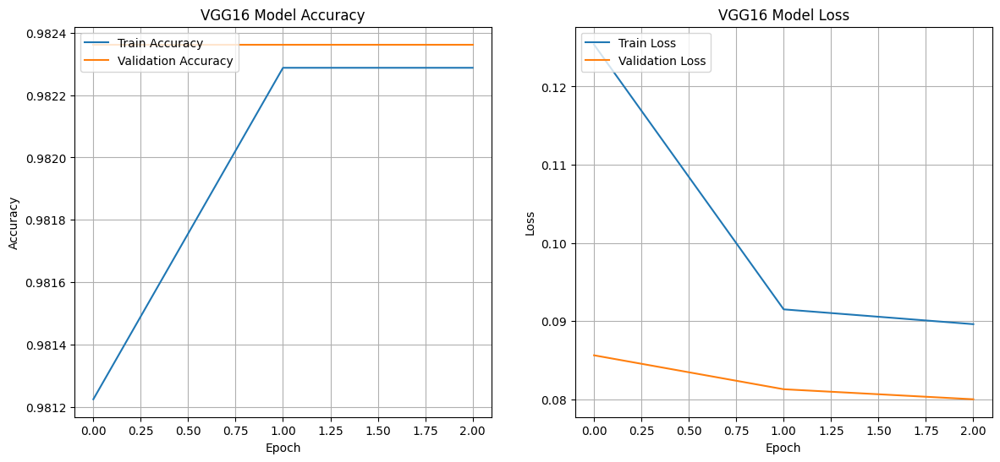

In [ ]:
import matplotlib.pyplot as plt

def plot_training_history(vgg16_history):
    # Plot training & validation accuracy values
    plt.figure(figsize=(14, 6))

    plt.subplot(1, 2, 1)
    plt.plot(vgg16_history.history['accuracy'], label='Train Accuracy')
    plt.plot(vgg16_history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('VGG16 Model Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend(loc='upper left')
    plt.grid(True)

    # Plot training & validation loss values
    plt.subplot(1, 2, 2)
    plt.plot(vgg16_history.history['loss'], label='Train Loss')
    plt.plot(vgg16_history.history['val_loss'], label='Validation Loss')
    plt.title('VGG16 Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend(loc='upper left')
    plt.grid(True)

    plt.show()

# Call the function to plot the history
plot_training_history(vgg16_history)





372/372 [==============================] - 737s 2s/step


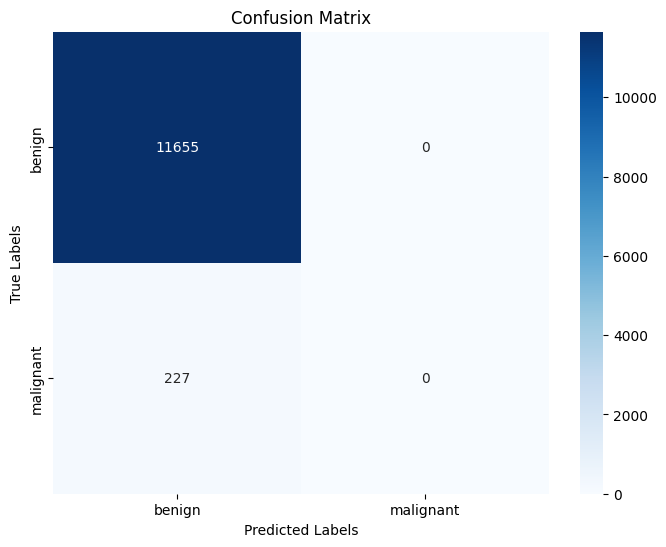

Classification Report:
               precision    recall  f1-score   support

      benign       0.98      1.00      0.99     11655
   malignant       0.00      0.00      0.00       227

    accuracy                           0.98     11882
   macro avg       0.49      0.50      0.50     11882
weighted avg       0.96      0.98      0.97     11882



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Make predictions on the test data
test_generator.reset()  # Ensure the generator is reset
predictions = vgg16_model.predict(test_generator, verbose=1)
y_pred = np.argmax(predictions, axis=1)

# Get the true labels from the test data
true_labels = test_generator.classes

# Get the class labels
class_labels = list(test_generator.class_indices.keys())

# Generate confusion matrix
conf_matrix = confusion_matrix(true_labels, y_pred)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# Step 6: Generate classification report
report = classification_report(true_labels, y_pred, target_names=class_labels)
print("Classification Report:\n", report)


1/1 [==============================] - 0s 240ms/step


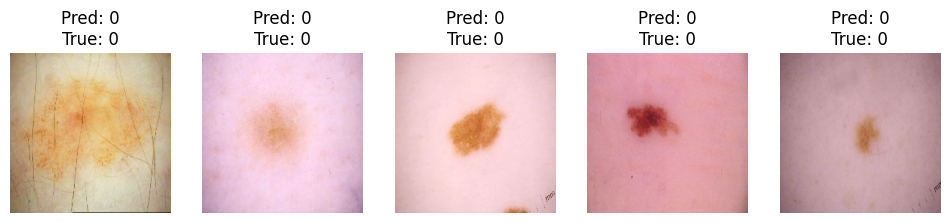

In [ ]:
import numpy as np

def plot_sample_predictions(generator, vgg16_model, num_samples=5):
    # Get a batch of images and labels from the generator
    images, labels = next(generator)

    # Predict the class probabilities
    predictions = vgg16_model.predict(images)

    # Convert predictions to class labels
    predicted_classes = np.argmax(predictions, axis=1)
    true_classes = np.argmax(labels, axis=1)

    # Plot some sample images with predictions and true labels
    plt.figure(figsize=(12, 8))
    for i in range(num_samples):
        plt.subplot(1, num_samples, i + 1)
        plt.imshow(images[i])
        plt.title(f'Pred: {predicted_classes[i]}\nTrue: {true_classes[i]}')
        plt.axis('off')
    plt.show()

# Plot sample predictions
plot_sample_predictions(test_generator, vgg16_model, num_samples=5)


In [ ]:
from keras.applications import VGG19
from keras.models import Model
from keras.layers import Dense, Flatten, Dropout
from keras.optimizers import Adam
from keras.callbacks import ReduceLROnPlateau


# Define image size and batch size
image_size = (224, 224)
batch_size = 32

# Create ImageDataGenerators for training and validation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2  # 20% of training data used for validation
)

test_datagen = ImageDataGenerator(rescale=1./255)

# Load training and validation data
train_generator = train_datagen.flow_from_directory(
    dest_train_dir,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='training'
)

validation_generator = train_datagen.flow_from_directory(
    dest_train_dir,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation'
)

# Load test data
test_generator = test_datagen.flow_from_directory(
    dest_test_dir,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical'
)

# Build the VGG19 model
def build_vgg19_model(input_shape=(224, 224, 3), num_classes=2, lr=1e-3):
    base_model = VGG19(weights='imagenet', include_top=False, input_shape=input_shape)

    # Freeze the layers of VGG19
    for layer in base_model.layers:
        layer.trainable = False

    x = base_model.output
    x = Flatten()(x)
    x = Dense(128, activation='relu')(x)
    x = Dropout(0.5)(x)  # Dropout layer to prevent overfitting
    predictions = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs=base_model.input, outputs=predictions)

    model.compile(optimizer=Adam(learning_rate=lr),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

    model.summary()

    return model

# Learning rate annealing
learning_rate_reduction = ReduceLROnPlateau(monitor='val_accuracy',
                                            patience=5,
                                            verbose=1,
                                            factor=0.5,
                                            min_lr=1e-7)

# Build and train the model
vgg19_model = build_vgg19_model(input_shape=(224, 224, 3), num_classes=2, lr=1e-3)

vgg19_history = vgg19_model.fit(
    train_generator,
    epochs=3,  # Number of epochs
    validation_data=validation_generator,
    callbacks=[learning_rate_reduction]
)

# Optionally, save the model
vgg19_model.save('vgg19_finetuned_model.h5')


Found 25406 images belonging to 2 classes.
Found 6350 images belonging to 2 classes.
Found 11882 images belonging to 2 classes.
80134624/80134624 [==============================] - 3s 0us/step
Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


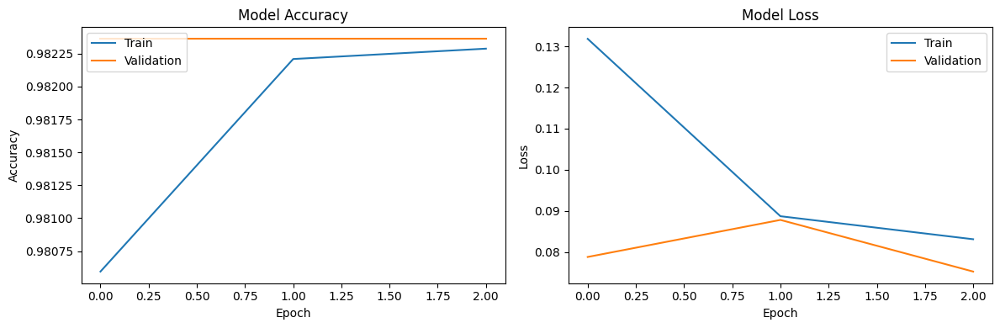

In [ ]:
# Plotting the training and validation loss and accuracy
plt.figure(figsize=(12, 4))

# Plotting training & validation accuracy values
plt.subplot(1, 2, 1)
plt.plot(vgg19_history.history['accuracy'])
plt.plot(vgg19_history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plotting training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(vgg19_history.history['loss'])
plt.plot(vgg19_history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper right')

plt.tight_layout()
plt.show()

1/1 [==============================] - 0s 166ms/step


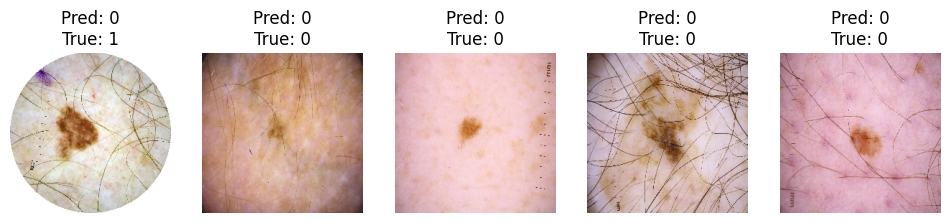

In [ ]:
import numpy as np

def plot_sample_predictions(generator, vgg19_model, num_samples=5):
    # Get a batch of images and labels from the generator
    images, labels = next(generator)

    # Predict the class probabilities
    predictions = vgg19_model.predict(images)

    # Convert predictions to class labels
    predicted_classes = np.argmax(predictions, axis=1)
    true_classes = np.argmax(labels, axis=1)

    # Plot some sample images with predictions and true labels
    plt.figure(figsize=(12, 8))
    for i in range(num_samples):
        plt.subplot(1, num_samples, i + 1)
        plt.imshow(images[i])
        plt.title(f'Pred: {predicted_classes[i]}\nTrue: {true_classes[i]}')
        plt.axis('off')
    plt.show()

# Plot sample predictions
plot_sample_predictions(test_generator, vgg19_model, num_samples=5)


372/372 [==============================] - 724s 2s/step


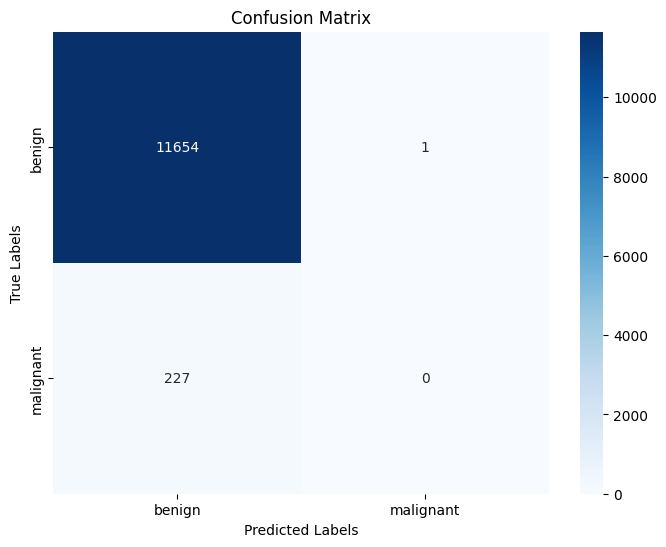

Classification Report:
               precision    recall  f1-score   support

      benign       0.98      1.00      0.99     11655
   malignant       0.00      0.00      0.00       227

    accuracy                           0.98     11882
   macro avg       0.49      0.50      0.50     11882
weighted avg       0.96      0.98      0.97     11882



In [ ]:
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Make predictions on the test data
test_generator.reset()  # Ensure the generator is reset
predictions = vgg19_model.predict(test_generator, verbose=1)
y_pred = np.argmax(predictions, axis=1)

# Get the true labels from the test data
true_labels = test_generator.classes

# Get the class labels
class_labels = list(test_generator.class_indices.keys())

# Generate confusion matrix
conf_matrix = confusion_matrix(true_labels, y_pred)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# Step 6: Generate classification report
report = classification_report(true_labels, y_pred, target_names=class_labels)
print("Classification Report:\n", report)


1/1 [==============================] - 0s 28ms/step


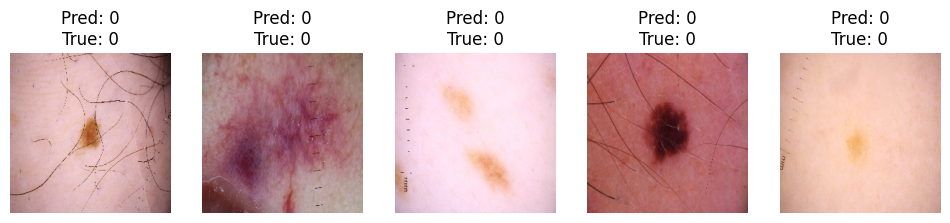

In [ ]:
import numpy as np

def plot_sample_predictions(generator, vgg19_model, num_samples=5):
    # Get a batch of images and labels from the generator
    images, labels = next(generator)

    # Predict the class probabilities
    predictions = vgg19_model.predict(images)

    # Convert predictions to class labels
    predicted_classes = np.argmax(predictions, axis=1)
    true_classes = np.argmax(labels, axis=1)

    # Plot some sample images with predictions and true labels
    plt.figure(figsize=(12, 8))
    for i in range(num_samples):
        plt.subplot(1, num_samples, i + 1)
        plt.imshow(images[i])
        plt.title(f'Pred: {predicted_classes[i]}\nTrue: {true_classes[i]}')
        plt.axis('off')
    plt.show()

# Plot sample predictions
plot_sample_predictions(test_generator, vgg19_model, num_samples=5)


In [ ]:
from keras.applications import ResNet50
from keras.models import Model
from keras.layers import Dense, Flatten, Dropout
from keras.optimizers import Adam
from keras.callbacks import ReduceLROnPlateau
from keras.preprocessing.image import ImageDataGenerator

# Define image size and batch size
image_size = (224, 224)
batch_size = 32

# Create ImageDataGenerators for training and validation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2  # 20% of training data used for validation
)

test_datagen = ImageDataGenerator(rescale=1./255)

# Load training and validation data
train_generator = train_datagen.flow_from_directory(
    dest_train_dir,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='training'
)

validation_generator = train_datagen.flow_from_directory(
    dest_train_dir,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation'
)

# Load test data
test_generator = test_datagen.flow_from_directory(
    dest_test_dir,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical'
)

# Build the ResNet50 model
def build_resnet50_model(input_shape=(224, 224, 3), num_classes=2, lr=1e-3):
    base_model = ResNet50(weights='imagenet', include_top=False, input_shape=input_shape)

    # Freeze the layers of ResNet50
    for layer in base_model.layers:
        layer.trainable = False

    x = base_model.output
    x = Flatten()(x)
    x = Dense(128, activation='relu')(x)
    x = Dropout(0.5)(x)  # Dropout layer to prevent overfitting
    predictions = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs=base_model.input, outputs=predictions)

    model.compile(optimizer=Adam(learning_rate=lr),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

    model.summary()

    return model

# Learning rate annealing
learning_rate_reduction = ReduceLROnPlateau(monitor='val_accuracy',
                                            patience=5,
                                            verbose=1,
                                            factor=0.5,
                                            min_lr=1e-7)

# Build and train the model
resnet50_model = build_resnet50_model(input_shape=(224, 224, 3), num_classes=2, lr=1e-3)

resnet50_history = resnet50_model.fit(
    train_generator,
    epochs=3,  # Number of epochs
    validation_data=validation_generator,
    callbacks=[learning_rate_reduction]
)


model.save('resnet50_finetuned_model.h5')


Found 25406 images belonging to 2 classes.
Found 6350 images belonging to 2 classes.
Found 11882 images belonging to 2 classes.
94765736/94765736 [==============================] - 4s 0us/step
Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_3[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                 

NameError: name 'model' is not defined

In [ ]:
resnet50_model.save('resnet50_finetuned_model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


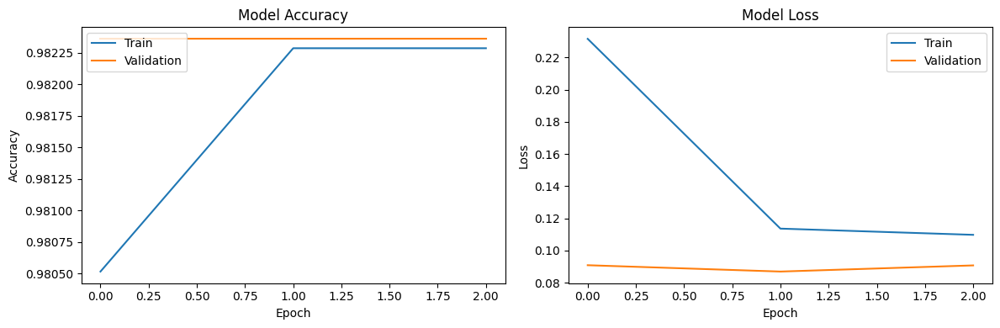

In [ ]:
# Plotting the training and validation loss and accuracy
plt.figure(figsize=(12, 4))

# Plotting training & validation accuracy values
plt.subplot(1, 2, 1)
plt.plot(resnet50_history.history['accuracy'])
plt.plot(resnet50_history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plotting training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(resnet50_history.history['loss'])
plt.plot(resnet50_history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper right')

plt.tight_layout()
plt.show()

In [ ]:
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Make predictions on the test data
test_generator.reset()  # Ensure the generator is reset
predictions = resnet50_model.predict(test_generator, verbose=1)
y_pred = np.argmax(predictions, axis=1)

# Get the true labels from the test data
true_labels = test_generator.classes

# Get the class labels
class_labels = list(test_generator.class_indices.keys())

# Generate confusion matrix
conf_matrix = confusion_matrix(true_labels, y_pred)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# Step 6: Generate classification report
report = classification_report(true_labels, y_pred, target_names=class_labels)
print("Classification Report:\n", report)


1/1 [==============================] - 1s 880ms/step


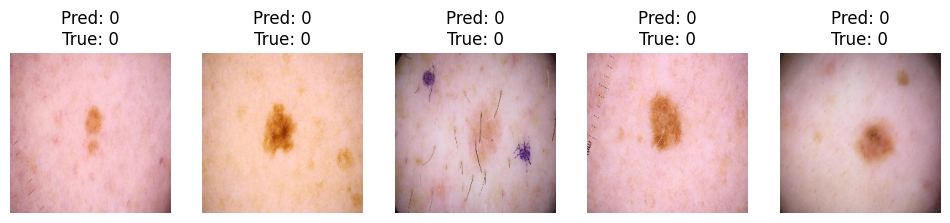

In [ ]:
import numpy as np

def plot_sample_predictions(generator, model, num_samples=5):
    # Get a batch of images and labels from the generator
    images, labels = next(generator)

    # Predict the class probabilities
    predictions = resnet50_model.predict(images)

    # Convert predictions to class labels
    predicted_classes = np.argmax(predictions, axis=1)
    true_classes = np.argmax(labels, axis=1)

    # Plot some sample images with predictions and true labels
    plt.figure(figsize=(12, 8))
    for i in range(num_samples):
        plt.subplot(1, num_samples, i + 1)
        plt.imshow(images[i])
        plt.title(f'Pred: {predicted_classes[i]}\nTrue: {true_classes[i]}')
        plt.axis('off')
    plt.show()

# Plot sample predictions
plot_sample_predictions(test_generator, resnet50_model, num_samples=5)


In [16]:
import matplotlib.pyplot as plt
from keras.applications import DenseNet121
from keras.models import Model
from keras.layers import Dense, GlobalAveragePooling2D, Dropout
from keras.optimizers import Adam
from keras.callbacks import ReduceLROnPlateau
from keras.preprocessing.image import ImageDataGenerator

# Define a function to build a model
def build_model(base_model):
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    predictions = Dense(1, activation='sigmoid')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    return model

# Define image size and batch size
image_size = (224, 224)
batch_size = 32

# Create ImageDataGenerators for training and validation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2  # 20% of training data used for validation
)

test_datagen = ImageDataGenerator(rescale=1./255)

# Load training and validation data
train_generator = train_datagen.flow_from_directory(
    dest_train_dir,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='training'
)

validation_generator = train_datagen.flow_from_directory(
    dest_train_dir,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation'
)

# Load test data
test_generator = test_datagen.flow_from_directory(
    dest_test_dir,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical'
)

# Build the DenseNet121 model
def build_densenet121_model(input_shape=(224, 224, 3), num_classes=2, lr=1e-3):
    base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=input_shape)

    # Freeze the layers of DenseNet121
    for layer in base_model.layers:
        layer.trainable = False

    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(128, activation='relu')(x)
    x = Dropout(0.5)(x)  # Dropout layer to prevent overfitting
    predictions = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs=base_model.input, outputs=predictions)

    model.compile(optimizer=Adam(learning_rate=lr),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

    model.summary()

    return model

# Learning rate annealing
learning_rate_reduction = ReduceLROnPlateau(monitor='val_accuracy',
                                            patience=5,
                                            verbose=1,
                                            factor=0.5,
                                            min_lr=1e-7)

# Build and train the model
densenet121_model = build_densenet121_model(input_shape=(224, 224, 3), num_classes=2, lr=1e-3)

densenet121_history = densenet121_model.fit(
    train_generator,
    epochs=3,  # Number of epochs
    validation_data=validation_generator,
    callbacks=[learning_rate_reduction]
)

densenet121_model.save('densenet121_finetuned_model.h5')


ImportError: cannot import name 'ImageDataGenerator' from 'keras.preprocessing.image' (/usr/local/lib/python3.10/dist-packages/keras/api/preprocessing/image/__init__.py)

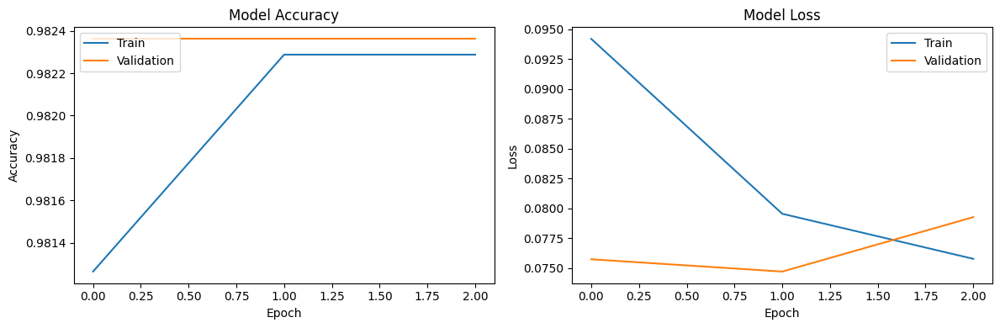

In [ ]:
# Plotting the training and validation loss and accuracy
plt.figure(figsize=(12, 4))

# Plotting training & validation accuracy values
plt.subplot(1, 2, 1)
plt.plot(densenet121_history.history['accuracy'])
plt.plot(densenet121_history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plotting training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(densenet121_history.history['loss'])
plt.plot(densenet121_history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper right')

plt.tight_layout()
plt.show()

372/372 [==============================] - 770s 2s/step


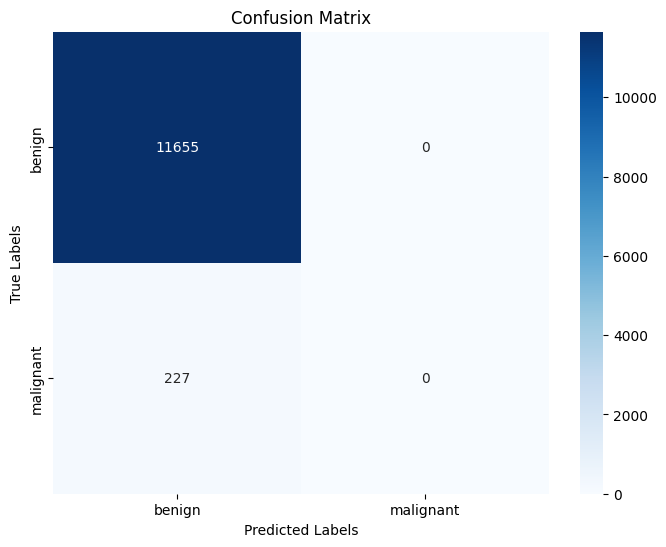

Classification Report:
               precision    recall  f1-score   support

      benign       0.98      1.00      0.99     11655
   malignant       0.00      0.00      0.00       227

    accuracy                           0.98     11882
   macro avg       0.49      0.50      0.50     11882
weighted avg       0.96      0.98      0.97     11882



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Make predictions on the test data
test_generator.reset()  # Ensure the generator is reset
predictions = densenet121_model.predict(test_generator, verbose=1)
y_pred = np.argmax(predictions, axis=1)

# Get the true labels from the test data
true_labels = test_generator.classes

# Get the class labels
class_labels = list(test_generator.class_indices.keys())

# Generate confusion matrix
conf_matrix = confusion_matrix(true_labels, y_pred)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# Step 6: Generate classification report
report = classification_report(true_labels, y_pred, target_names=class_labels)
print("Classification Report:\n", report)


In [ ]:
import numpy as np

def plot_sample_predictions(generator, model, num_samples=5):
    # Get a batch of images and labels from the generator
    images, labels = next(generator)

    # Predict the class probabilities
    predictions = model.predict(images)

    # Convert predictions to class labels
    predicted_classes = np.argmax(predictions, axis=1)
    true_classes = np.argmax(labels, axis=1)

    # Plot some sample images with predictions and true labels
    plt.figure(figsize=(12, 8))
    for i in range(num_samples):
        plt.subplot(1, num_samples, i + 1)
        plt.imshow(images[i])
        plt.title(f'Pred: {predicted_classes[i]}\nTrue: {true_classes[i]}')
        plt.axis('off')
    plt.show()

# Plot sample predictions
plot_sample_predictions(test_generator, model, num_samples=5)


NameError: name 'model' is not defined

In [ ]:
from keras.models import load_model

# Paths to the saved models
vgg16_model_path = '/content/vgg16_finetuned_model.h5'
vgg19_model_path = '/content/vgg19_finetuned_model.h5'
resnet_model_path = '/content/resnet50_finetuned_model.h5'
densenet_model_path = '/content/densenet121_finetuned_model.h5'

# Load the models
vgg16_model = load_model(vgg16_model_path)
vgg19_model = load_model(vgg19_model_path)
resnet_model = load_model(resnet_model_path)
densenet_model = load_model(densenet_model_path)


In [ ]:
# Evaluate the models using test_generator
vgg16_eval = vgg16_model.evaluate(test_generator, verbose=0)
vgg19_eval = vgg19_model.evaluate(test_generator, verbose=0)
resnet_eval = resnet_model.evaluate(test_generator, verbose=0)
densenet_eval = densenet_model.evaluate(test_generator, verbose=0)

# Store the evaluation results in a dictionary
eval_results = {
    'VGG16': vgg16_eval,
    'VGG19': vgg19_eval,
    'ResNet': resnet_eval,
    'DenseNet': densenet_eval
}

# Print the results
for model_name, eval_result in eval_results.items():
    print(f"{model_name} - Loss: {eval_result[0]}, Accuracy: {eval_result[1]}")


In [ ]:
import matplotlib.pyplot as plt

# Extracting losses and accuracies
model_names = list(eval_results.keys())
losses = [result[0] for result in eval_results.values()]
accuracies = [result[1] for result in eval_results.values()]

# Plotting accuracy comparison
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
plt.bar(model_names, accuracies, color=['blue', 'green', 'red', 'purple'])
plt.title('Model Accuracy Comparison')
plt.xlabel('Models')
plt.ylabel('Accuracy')

# Plotting loss comparison
plt.subplot(1, 2, 2)
plt.bar(model_names, losses, color=['blue', 'green', 'red', 'purple'])
plt.title('Model Loss Comparison')
plt.xlabel('Models')
plt.ylabel('Loss')

plt.tight_layout()
plt.show()
